## Training a New Model

##### Import Important Libaries

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

##### Func to Save Plots

In [3]:
def save_and_show(fig_name, dpi=300):
    """
    Saves the current matplotlib figure to the 'figures' directory
    and displays it.

    Parameters:
        fig_name (str): Name of the file to save.
        dpi (int): Image resolution in dots per inch.
    """
    save_dirn = "figures"
    os.makedirs(save_dirn, exist_ok=True)
    save_path_t = os.path.join(save_dirn, fig_name)
    plt.tight_layout()
    plt.savefig(save_path_t, dpi=dpi, bbox_inches="tight")
    plt.show()
    plt.close()
    print(f" Saved figure to: {save_path_t}")

#### Load Non-Earthquake Segments Into a Single Dataset and Prepare for Training

In [5]:
import os
import numpy as np
from sklearn.model_selection import train_test_split

# dir to load from
segment_dir = "segments_2500_std"  

# List of non-earthquake base filenames to match against
non_eq_filenames = [
    "RCC8D_EQ_trimmed_10min",
    "RD9D6_EQ_trimmed_10min",
    "R76F0_EQ_trimmed_10min",
    "R0CEC_EQ_trimmed_10min",
    "R5B93_EQ_trimmed_10min",
    "R119F_EQ_20230921T132653_10min",
    "R119F_EQ_20231017T080517_10min",
    "R1906_EQ_20230924T205322_10min",
    "R3949_EQ_20230721T031559_10min",
    "R9F13_EQ_20190410T161508_10min",
    "R7000_EQ_20250528T124439_10min",
    "R57CE_EQ_20240918T101939_10min"
]

# Filter and collect file paths
non_eq_files = []
for fname in os.listdir(segment_dir):
    for base in non_eq_filenames:
        if fname.startswith(base) and fname.endswith(".npy"):
            non_eq_files.append(os.path.join(segment_dir, fname))

print(f"Found {len(non_eq_files)} non-earthquake .npy segment files")

# Load and stack all segments
all_segments = []
for fname in non_eq_files:
    segments = np.load(fname)
    all_segments.append(segments)

X = np.vstack(all_segments).astype("float32")
print(f"Total segments loaded: {X.shape[0]} (each of length {X.shape[1]})")

# Per-segment normalization 
means = X.mean(axis=1, keepdims=True)
stds = X.std(axis=1, keepdims=True) + 1e-8
X_norm = (X - means) / stds

# Split into train/test
X_train, X_test = train_test_split(X_norm, test_size=0.2, random_state=42)

print(f"Training samples: {X_train.shape[0]}")
print(f"Testing samples: {X_test.shape[0]}")

Found 38 non-earthquake .npy segment files
Total segments loaded: 912 (each of length 500)
Training samples: 729
Testing samples: 183


In [7]:
# Save test set and train set to .npy files
np.save("non_eq_X_test.npy", X_test)
np.save("non_eq_X_train.npy", X_train)

# save also the indices so we can reconstruct exactly the same split
idx = np.arange(X_norm.shape[0])
_, test_idx = train_test_split(idx, test_size=0.2, random_state=42)
np.save("non_eq_test_idx.npy", test_idx)

print(" Saved: non_eq_X_test.npy, non_eq_X_train.npy, non_eq_test_idx.npy")

 Saved: non_eq_X_test.npy, non_eq_X_train.npy, non_eq_test_idx.npy


#### Load Eq_segments

In [9]:
# Folder name
base_dir = "segments_2500_std"

# Earthquake base names 
earthquake_bases = [
    "RE992_EQ_20240601T111409_10min",
    "RE992_EQ_20240814T022653_10min",
    "R5C62_EQ_trimmed_10min",
    "R77F9_EQ_trimmed_10min",
    "R853C_EQ_20240712T063946_10min",
    "R74A7_EQ_20220430T090645_10min",
    "R30A2_EQ_20250228T193324_10min",
    "R5156_EQ_20230222T060119_10min",
    "R47BB_EQ_20230722T164652_10min",
    "R5E3B_EQ_20250312T131039_10min"
]

# Get all matching .npy file paths
all_files = os.listdir(base_dir)
earthquake_files = []

for base in earthquake_bases:
    matches = [f for f in all_files if f.startswith(base) and f.endswith(".npy")]
    earthquake_files.extend([os.path.join(base_dir, m) for m in matches])

# Load and stack segments from all matched files
eq_segments_list = [np.load(f) for f in earthquake_files]
eq_segments = np.vstack(eq_segments_list)

print(" Loaded EQ segments:", eq_segments.shape)

 Loaded EQ segments: (768, 500)


### Quick Test for Autoencoder Bottleneck and Dropout Settings to Find Best ROC-AUC

In [12]:
from sklearn.metrics import roc_auc_score
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.callbacks import EarlyStopping

# Normalize earthquake segments
eq_means = eq_segments.mean(axis=1, keepdims=True)
eq_stds = eq_segments.std(axis=1, keepdims=True) + 1e-8
eq_norm = (eq_segments - eq_means) / eq_stds

# Autoencoder Trainer Function
def train_autoencoder_model(bottleneck_size=32, dropout_rate=0.1, epochs=200, batch_size=128):
    input_dim = X_train.shape[1]

    inputs = layers.Input(shape=(input_dim,))
    x = layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(inputs)
    x = layers.Dropout(dropout_rate)(x)
    x = layers.Dense(bottleneck_size, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.Dropout(dropout_rate)(x)
    outputs = layers.Dense(input_dim)(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer='adam', loss='mse')

    early_stop = EarlyStopping(patience=5, restore_best_weights=True)
    model.fit(X_train, X_train,
              validation_data=(X_test, X_test),
              epochs=epochs, batch_size=batch_size,
              callbacks=[early_stop], verbose=0)
    
    return model

# Grid Search
bottlenecks = [8, 16, 32,64]
dropouts = [0.0, 0.1, 0.2,0.3]
grid_results = []

for b in bottlenecks:
    for d in dropouts:
        print(f"Training: Bottleneck = {b}, Dropout = {d}")
        model = train_autoencoder_model(bottleneck_size=b, dropout_rate=d)

        # Predict and compute test errors
        test_preds = model.predict(X_test, verbose=0)
        test_mse = np.mean((X_test - test_preds) ** 2, axis=1)

        # Predict and compute EQ errors
        eq_preds = model.predict(eq_norm, verbose=0)
        eq_mse = np.mean((eq_norm - eq_preds) ** 2, axis=1)

        # Combine errors and compute AUC
        all_errors = np.concatenate([test_mse, eq_mse])
        labels = np.array([0] * len(test_mse) + [1] * len(eq_mse))

        auc = roc_auc_score(labels, all_errors)
        print(f"  → ROC-AUC: {auc:.4f}")
        grid_results.append((b, d, auc))

# Show Results
df_auc = pd.DataFrame(grid_results, columns=["Bottleneck", "Dropout", "AUC"])
df_auc = df_auc.sort_values(by="AUC", ascending=False)
df_auc

Training: Bottleneck = 8, Dropout = 0.0
  → ROC-AUC: 0.6677
Training: Bottleneck = 8, Dropout = 0.1
  → ROC-AUC: 0.6525
Training: Bottleneck = 8, Dropout = 0.2
  → ROC-AUC: 0.6498
Training: Bottleneck = 8, Dropout = 0.3
  → ROC-AUC: 0.6365
Training: Bottleneck = 16, Dropout = 0.0
  → ROC-AUC: 0.6694
Training: Bottleneck = 16, Dropout = 0.1
  → ROC-AUC: 0.6794
Training: Bottleneck = 16, Dropout = 0.2
  → ROC-AUC: 0.6873
Training: Bottleneck = 16, Dropout = 0.3
  → ROC-AUC: 0.6734
Training: Bottleneck = 32, Dropout = 0.0
  → ROC-AUC: 0.6966
Training: Bottleneck = 32, Dropout = 0.1
  → ROC-AUC: 0.6979
Training: Bottleneck = 32, Dropout = 0.2
  → ROC-AUC: 0.6931
Training: Bottleneck = 32, Dropout = 0.3
  → ROC-AUC: 0.6751
Training: Bottleneck = 64, Dropout = 0.0
  → ROC-AUC: 0.7146
Training: Bottleneck = 64, Dropout = 0.1
  → ROC-AUC: 0.7183
Training: Bottleneck = 64, Dropout = 0.2
  → ROC-AUC: 0.7035
Training: Bottleneck = 64, Dropout = 0.3
  → ROC-AUC: 0.6955


,Bottleneck,Dropout,AUC
13,64,0.1,0.718266
12,64,0.0,0.714595
14,64,0.2,0.703467
9,32,0.1,0.697895
8,32,0.0,0.696636
15,64,0.3,0.695497
10,32,0.2,0.693142
6,16,0.2,0.687279
5,16,0.1,0.679403
11,32,0.3,0.675134


#### Doublecheck Segment Shape

In [14]:
segment_dir = "segments_2500_std"

# Get only .npy files
segment_files = [f for f in os.listdir(segment_dir) if f.endswith(".npy")]

total_segments = 0

for fname in sorted(segment_files):
    path = os.path.join(segment_dir, fname)
    data = np.load(path)
    print(f"{fname}: shape = {data.shape}")
    total_segments += data.shape[0]

print(f"\n Total segments across all files: {total_segments}")

R0CEC_EQ_trimmed_10min_EHE_segments.npy: shape = (24, 500)
R0CEC_EQ_trimmed_10min_EHN_segments.npy: shape = (24, 500)
R0CEC_EQ_trimmed_10min_EHZ_segments.npy: shape = (24, 500)
R119F_EQ_20230921T132653_10min_EHE_segments.npy: shape = (24, 500)
R119F_EQ_20230921T132653_10min_EHN_segments.npy: shape = (24, 500)
R119F_EQ_20230921T132653_10min_EHZ_segments.npy: shape = (24, 500)
R119F_EQ_20231017T080517_10min_EHE_segments.npy: shape = (24, 500)
R119F_EQ_20231017T080517_10min_EHN_segments.npy: shape = (24, 500)
R119F_EQ_20231017T080517_10min_EHZ_segments.npy: shape = (24, 500)
R1906_EQ_20230924T205322_10min_EHE_segments.npy: shape = (24, 500)
R1906_EQ_20230924T205322_10min_EHN_segments.npy: shape = (24, 500)
R1906_EQ_20230924T205322_10min_EHZ_segments.npy: shape = (24, 500)
R30A2_EQ_20250228T193324_10min_EHE_segments.npy: shape = (24, 500)
R30A2_EQ_20250228T193324_10min_EHN_segments.npy: shape = (24, 500)
R30A2_EQ_20250228T193324_10min_EHZ_segments.npy: shape = (24, 500)
R3949_EQ_20230721T0

#### Train Autoencoder 

In [ ]:
"""

"""

In [16]:
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential


# Define the autoencoder with L2
def build_autoencoder(input_dim=500, bottleneck_dim=64, l2_strength=1e-4):
    model = Sequential([
        Dense(128, activation='relu', input_shape=(input_dim,), kernel_regularizer=l2(l2_strength)),
        Dense(bottleneck_dim, activation='relu', kernel_regularizer=l2(l2_strength)),
        Dense(128, activation='relu', kernel_regularizer=l2(l2_strength)),
        Dense(input_dim, activation='linear')
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
    return model

# Build and compile
autoencoder_std = build_autoencoder()

# Train with early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history_std = autoencoder_std.fit(X_train, X_train, epochs=200, batch_size=128,
    validation_data=(X_test, X_test), callbacks=[early_stop],verbose=1)

Epoch 1/200


/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 1.0783 - val_loss: 1.0440
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.0361 - val_loss: 1.0350
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.0255 - val_loss: 1.0299
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.0171 - val_loss: 1.0229
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.0058 - val_loss: 1.0104
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9880 - val_loss: 0.9918
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9673 - val_loss: 0.9715
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9411 - val_loss: 0.9525
Epoch 9/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9160 - val_loss: 0.9372
Epoch 10/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8947 - val_loss: 0.9245
Epoch 11/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.8730 - val_loss: 0.9142
Epoch 12/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8534 - val_loss: 0.9047
Epoch 13/200

#### Training vs Validation Loss Curve

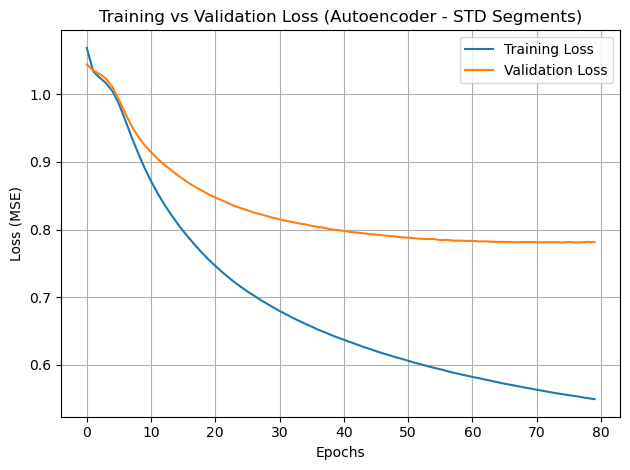

 Saved figure to: figures/loss_curve_std.png


In [18]:
# Plot the loss curves
plt.plot(history_std.history['loss'], label='Training Loss')
plt.plot(history_std.history['val_loss'], label='Validation Loss')
plt.title("Training vs Validation Loss (Autoencoder - STD Segments)")
plt.xlabel("Epochs")
plt.ylabel("Loss (MSE)")
plt.legend()
plt.grid(True)
plt.tight_layout()
save_and_show("loss_curve_std.png")

#### Evaluate Reconstruction Error

In [20]:
# Predict reconstructions for the test set using your trained model
X_Pred = autoencoder_std.predict(X_test)

# Compute Mean Squared Error (MSE) for each segment
reconstruction_errors = np.mean((X_test - X_Pred) ** 2, axis=1)

# Summary statistics
mean_error = np.mean(reconstruction_errors)
std_error = np.std(reconstruction_errors)

# Print results
print(" Reconstruction Error Summary:")
print(f"• Mean MSE: {mean_error:.4f}")
print(f"• Std Dev: {std_error:.4f}")

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
 Reconstruction Error Summary:
• Mean MSE: 0.7496
• Std Dev: 0.1690


#### Reconstruction Error Distribution

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


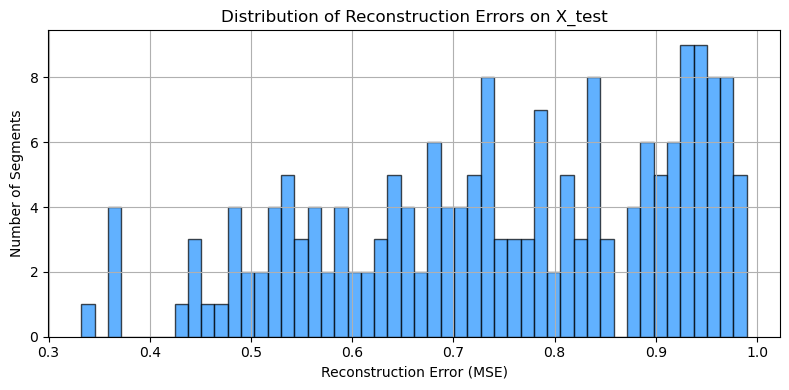

 Saved figure to: figures/distri_reconstruction_error.png


In [22]:
# Predict and calculate MSE for each test segment
X_Pred = autoencoder_std.predict(X_test)
reconstruction_errors = np.mean((X_test - X_Pred)**2, axis=1)

# Plot histogram
plt.figure(figsize=(8, 4))
plt.hist(reconstruction_errors, bins=50, color='dodgerblue', edgecolor='k', alpha=0.7)
plt.xlabel("Reconstruction Error (MSE)")
plt.ylabel("Number of Segments")
plt.title("Distribution of Reconstruction Errors on X_test")
plt.grid(True)
plt.tight_layout()
save_and_show("distri_reconstruction_error.png")

#### Plots original vs decoded segments

In [24]:
def plot_input_vs_decoded(X, model, n_samples=5, dataset_label="Test"):
    """
    This function plots random original vs decoded segments from X using trained autoencoder.

    Parameters:
    - X: Input array (X_train or X_test), shape = (n_segments, 500)
    - model: Trained autoencoder
    - n_samples: Number of random segments to plot
    - dataset_label: "Train" or "Test" label for plot title
    """
    decoded = model.predict(X)
    indices = np.random.choice(len(X), size=n_samples, replace=False)
    time_axis = np.linspace(0, 5, 500)  # 5 seconds at 100 Hz
    for i, idx in enumerate(indices):
        plt.figure(figsize=(10, 3))
        plt.plot(time_axis, X[idx], label="Original", linewidth=2)
        plt.plot(time_axis, decoded[idx], label="Decoded", linestyle="--")
        plt.title(f"{dataset_label} Segment {idx}: Original vs Decoded")
        plt.xlabel("Time (seconds)")
        plt.ylabel("Normalized Amplitude")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        save_and_show(f"Original_VS_Decoded_{idx}.png")

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


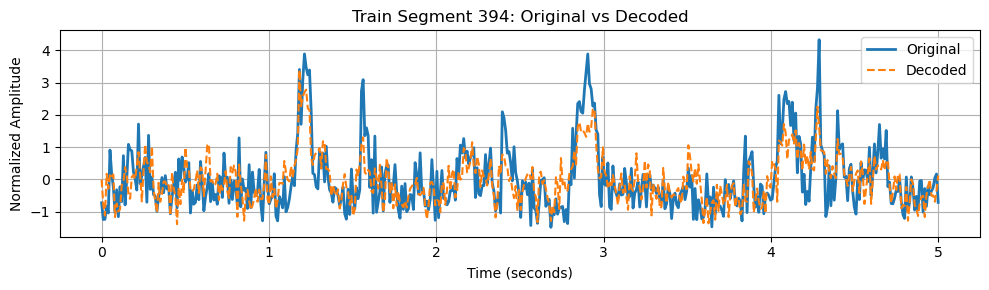

 Saved figure to: figures/Original_VS_Decoded_394.png


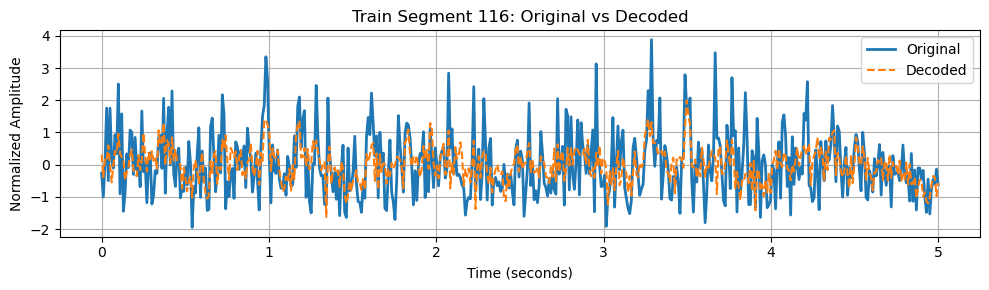

 Saved figure to: figures/Original_VS_Decoded_116.png


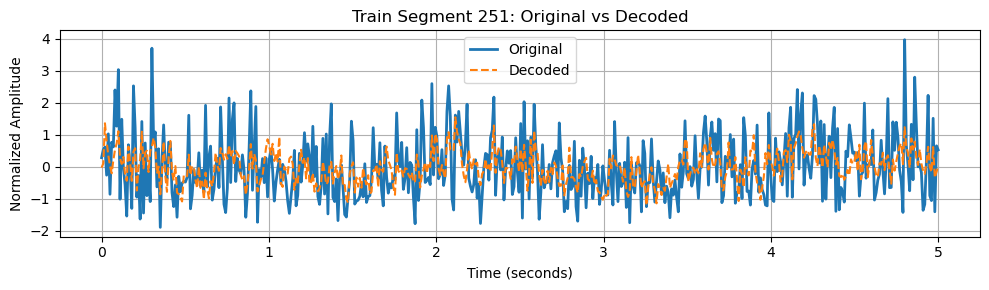

 Saved figure to: figures/Original_VS_Decoded_251.png


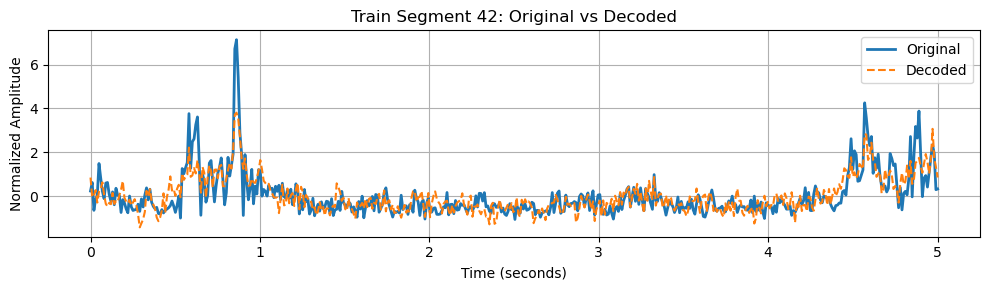

 Saved figure to: figures/Original_VS_Decoded_42.png


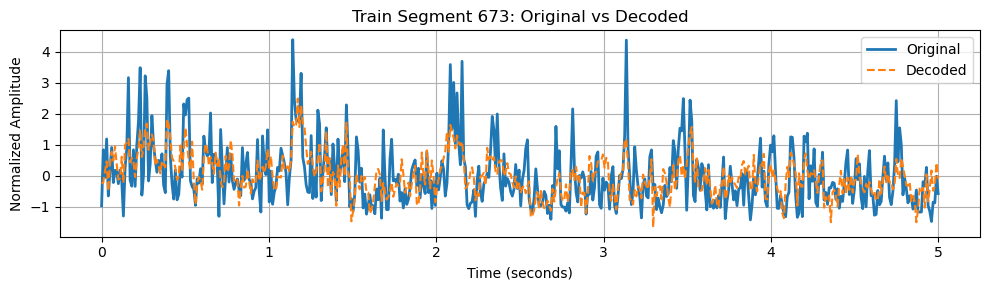

 Saved figure to: figures/Original_VS_Decoded_673.png
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


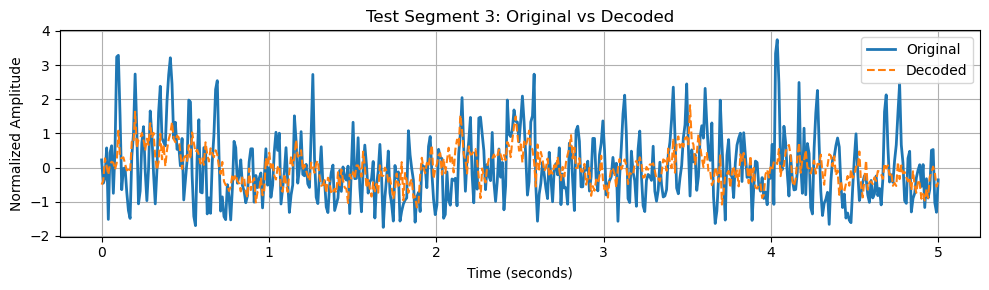

 Saved figure to: figures/Original_VS_Decoded_3.png


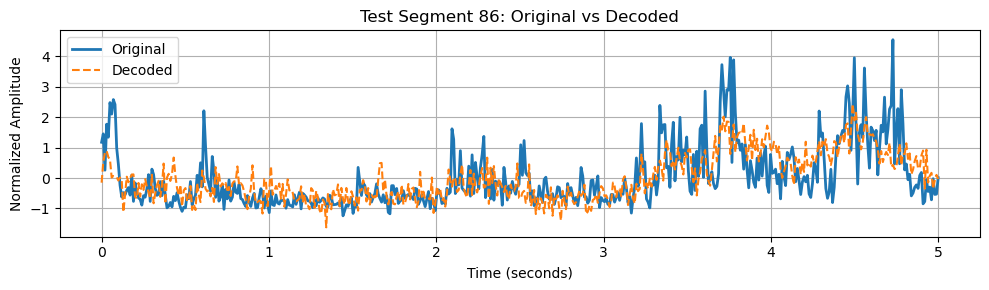

 Saved figure to: figures/Original_VS_Decoded_86.png


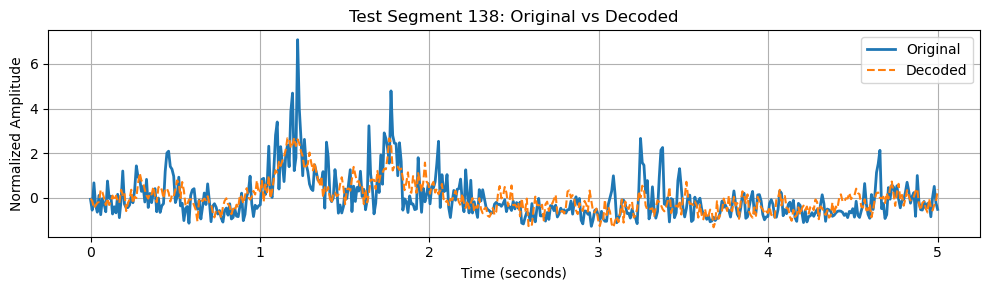

 Saved figure to: figures/Original_VS_Decoded_138.png


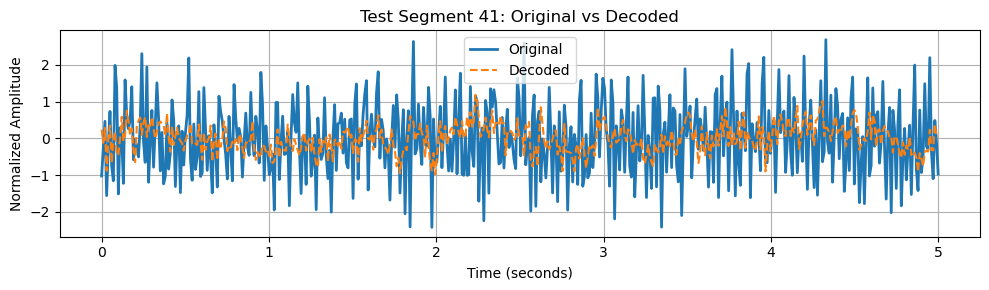

 Saved figure to: figures/Original_VS_Decoded_41.png


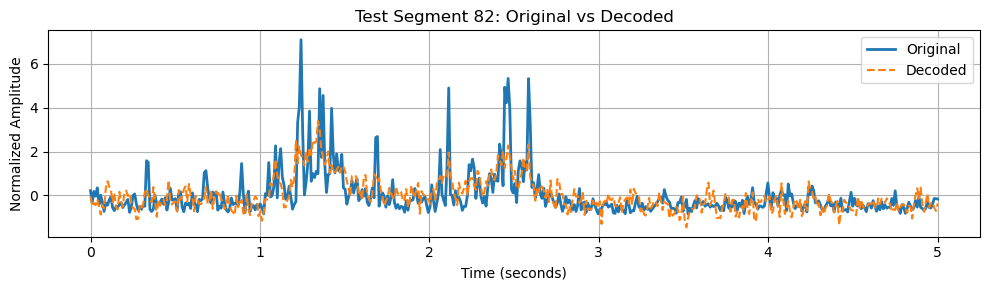

 Saved figure to: figures/Original_VS_Decoded_82.png


In [26]:
plot_input_vs_decoded(X_train, autoencoder_std, n_samples=5, dataset_label="Train")
plot_input_vs_decoded(X_test, autoencoder_std, n_samples=5, dataset_label="Test")

#### Plot High Error Segment

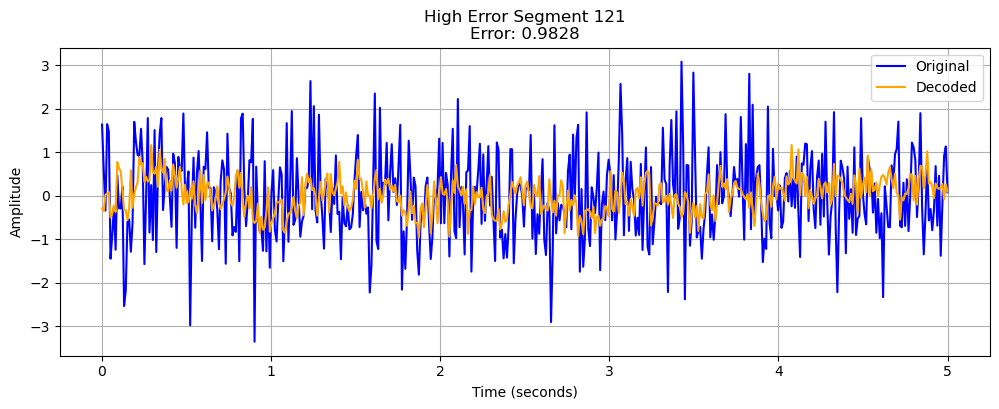

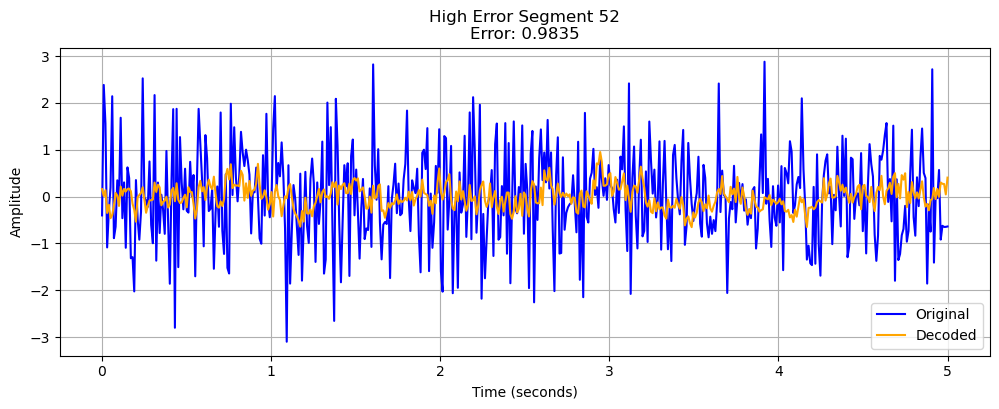

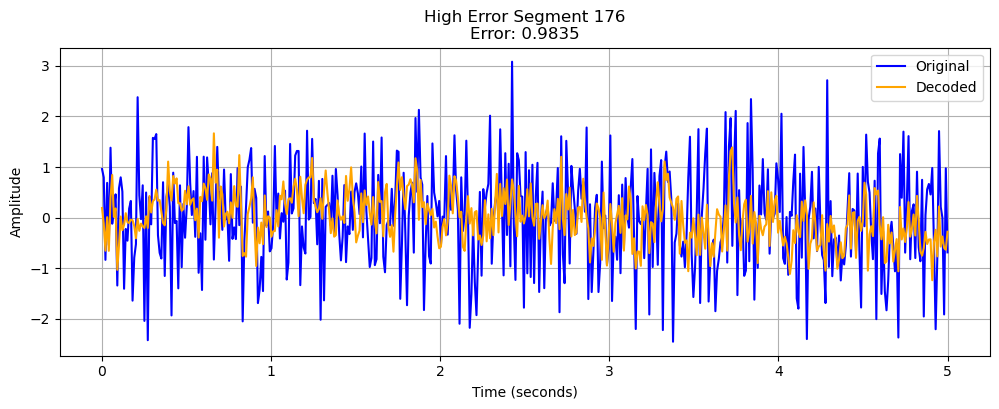

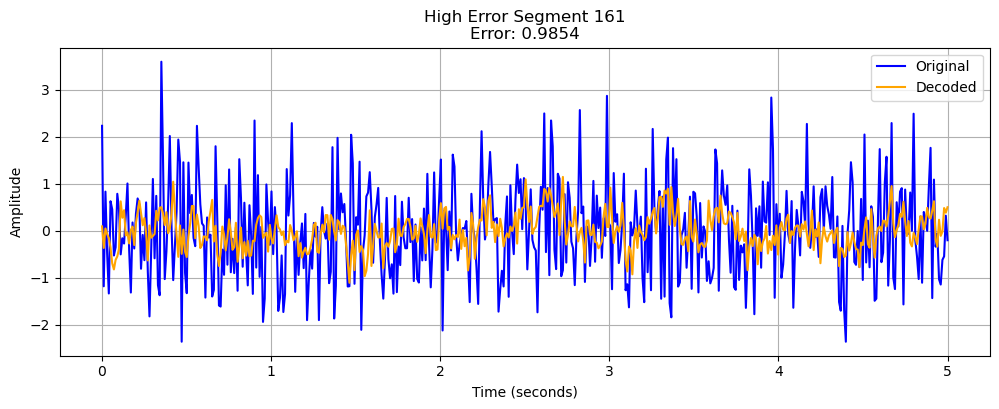

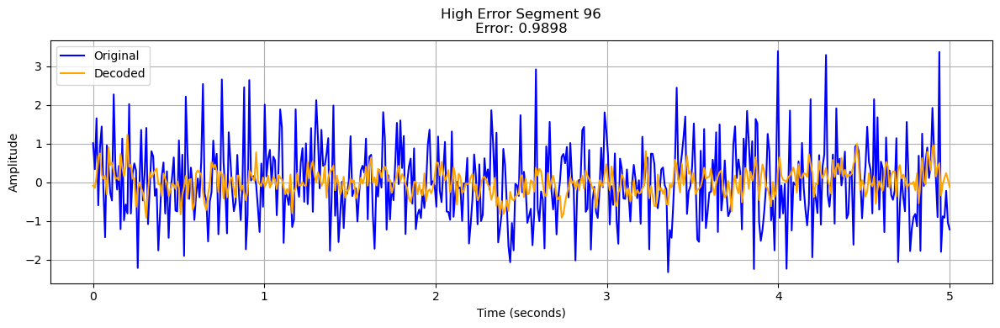

 Saved figure to: figures/High_error_segment_96.png


In [30]:
def plot_high_error_segments(X_data, decoded_data, errors, top_n=5):
    """
    This function plots the segments with the highest reconstruction error.

    Parameters:
    - X_data: Original input data
    - decoded_data: Reconstructed data from autoencoder
    - errors: Reconstruction MSEs
    - top_n: Number of top high-error segments to visualize
    """
    # Get indices of top N highest errors
    worst_indices = np.argsort(errors)[-top_n:]
    time_axis = np.linspace(0, 5, 500)  # 5 seconds at 100 Hz
    
    for i, idx in enumerate(worst_indices):
        plt.figure(figsize=(12, 4))
        plt.plot(time_axis, X_data[idx], label='Original', color='blue')
        plt.plot(time_axis, decoded_data[idx], label='Decoded', color='orange')
        plt.title(f"High Error Segment {idx}\nError: {errors[idx]:.4f}")
        plt.xlabel("Time (seconds)")
        plt.ylabel("Amplitude")
        plt.legend()
        plt.grid(True)
    plt.tight_layout()
    save_and_show(f"High_error_segment_{idx}.png")

# Call 
plot_high_error_segments(X_test, X_Pred, reconstruction_errors, top_n=5)

##### Plot to show threshold comparison

In [ ]:
"""
This code shows threshold comparison visualisation plot using defined thresholds as percentages of max errror
"""

 High Reconstruction Error Summary:
• 99% of max → cutoff = 0.9799 → 5 segments (2.73%)
• 95% of max → cutoff = 0.9404 → 27 segments (14.75%)
• 90% of max → cutoff = 0.8909 → 54 segments (29.51%)
• 85% of max → cutoff = 0.8414 → 65 segments (35.52%)
• 80% of max → cutoff = 0.7919 → 81 segments (44.26%)


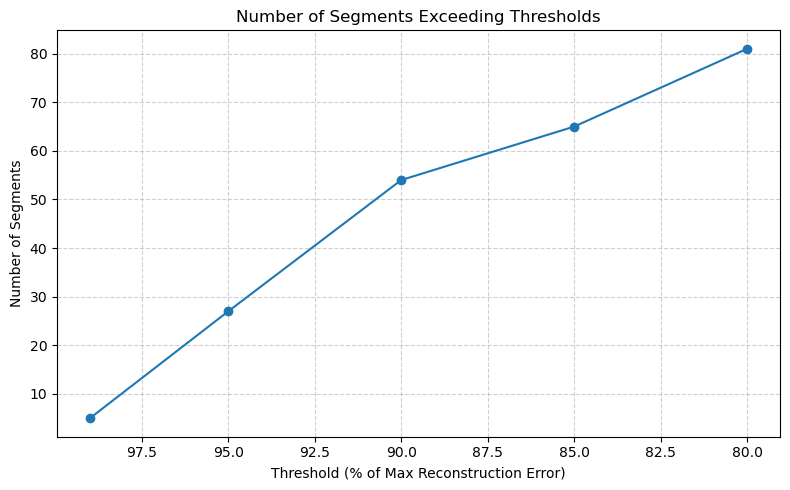

 Saved figure to: figures/Threshold_Comparison.png


In [32]:
# reconstruction_errors
max_error = np.max(reconstruction_errors)

# Define thresholds as percentages of max error
percentiles = [99, 95, 90, 85, 80]
cutoffs = [max_error * (p / 100) for p in percentiles]
counts = [np.sum(reconstruction_errors >= cutoff) for cutoff in cutoffs]

# Print details
print(" High Reconstruction Error Summary:")
for p, cutoff, count in zip(percentiles, cutoffs, counts):
    print(f"• {p}% of max → cutoff = {cutoff:.4f} → {count} segments ({100 * count / len(reconstruction_errors):.2f}%)")

# Plot
plt.figure(figsize=(8, 5))
plt.plot(percentiles, counts, marker='o', linestyle='-')
plt.gca().invert_xaxis()  # Higher thresholds on the left
plt.title("Number of Segments Exceeding Thresholds")
plt.xlabel("Threshold (% of Max Reconstruction Error)")
plt.ylabel("Number of Segments")
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
save_and_show("Threshold_Comparison.png")

##### Count all segments above the high error thresold

In [34]:
# Get the maximum reconstruction error
max_error = np.max(reconstruction_errors)

# Decide what counts as "high"
high_error_cutoff = max_error * 0.95

# Count how many segments are above that
high_error_mask = reconstruction_errors >= high_error_cutoff
num_high_error = np.sum(high_error_mask)

# Percentage
percentage_high_error = (num_high_error / len(reconstruction_errors)) * 100

print(f"Maximum reconstruction error: {max_error:.4f}")
print(f"High error cutoff : {high_error_cutoff:.4f}")
print(f"Number of high-error segments: {num_high_error}")
print(f"Percentage of total: {percentage_high_error:.2f}%")

Maximum reconstruction error: 0.9898
High error cutoff : 0.9404
Number of high-error segments: 27
Percentage of total: 14.75%


##### Show high error indices and plot

Maximum reconstruction error: 0.9898
High error cutoff (95% of max): 0.9404
Number of high-error segments: 27
High-error indices: [  2   6  16  32  39  41  45  47  48  49  52  73  96 104 106 109 114 121
 124 133 150 161 162 170 176 177 179]


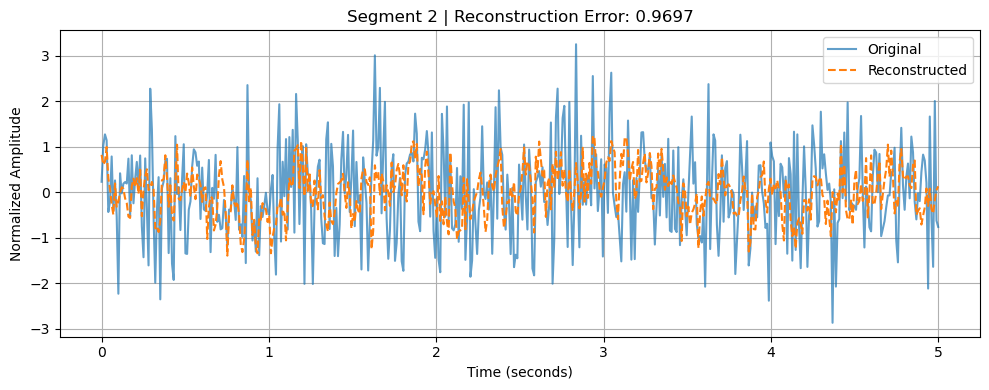

 Saved figure to: figures/High_error_Xtest_segment_2.png


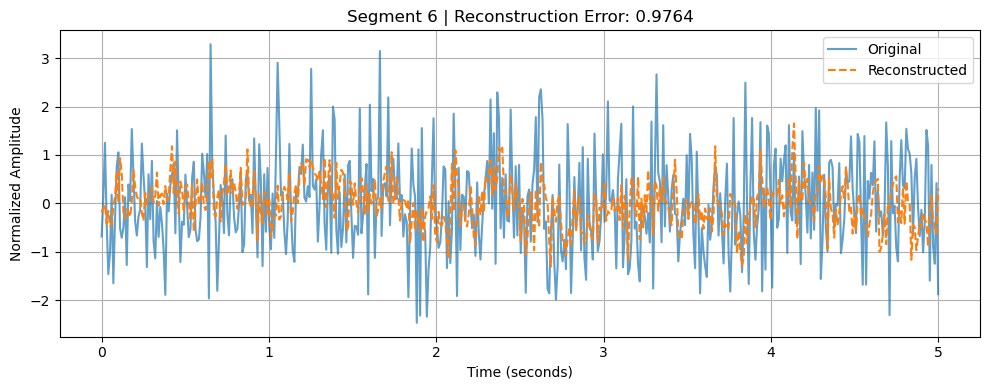

 Saved figure to: figures/High_error_Xtest_segment_6.png


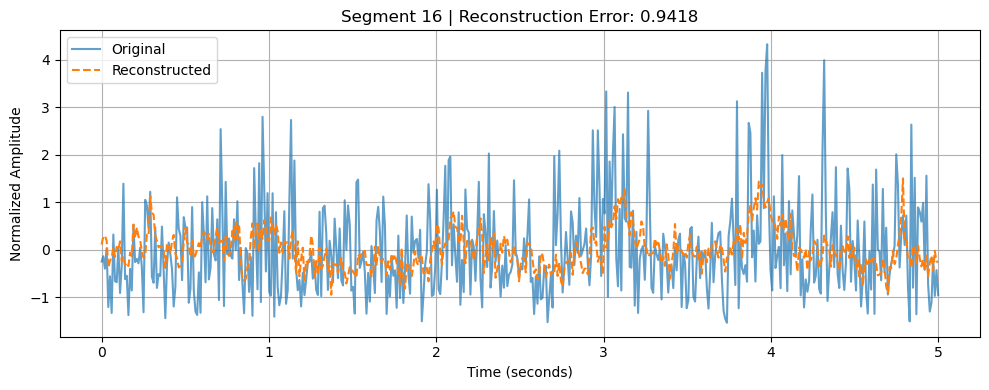

 Saved figure to: figures/High_error_Xtest_segment_16.png


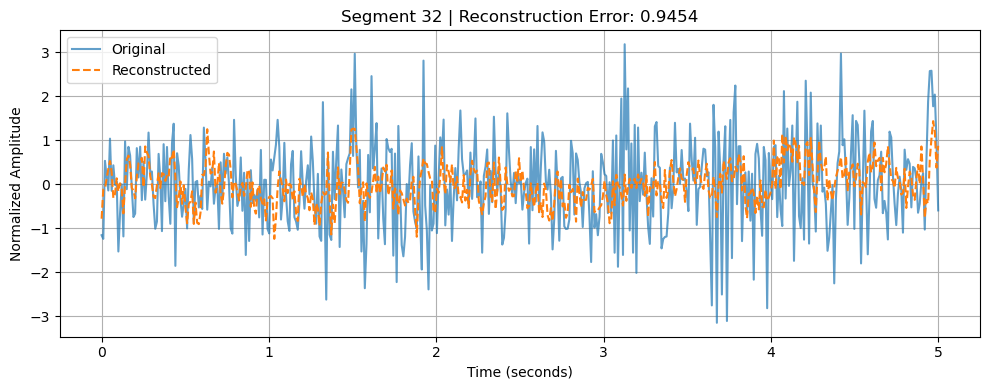

 Saved figure to: figures/High_error_Xtest_segment_32.png


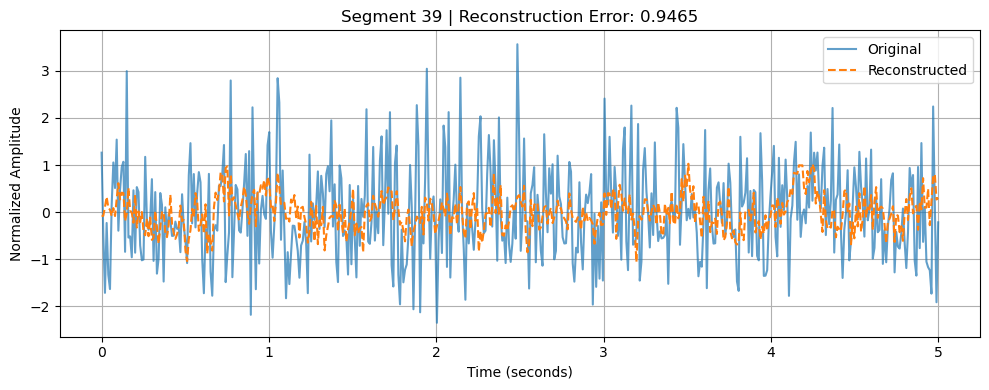

 Saved figure to: figures/High_error_Xtest_segment_39.png


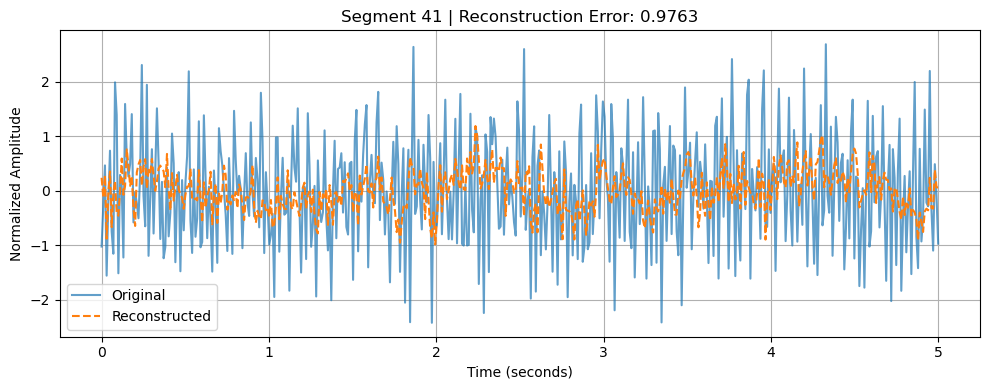

 Saved figure to: figures/High_error_Xtest_segment_41.png


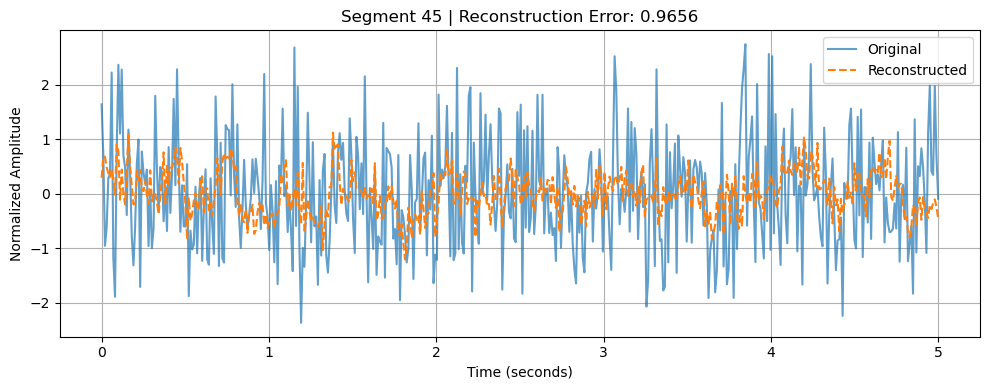

 Saved figure to: figures/High_error_Xtest_segment_45.png


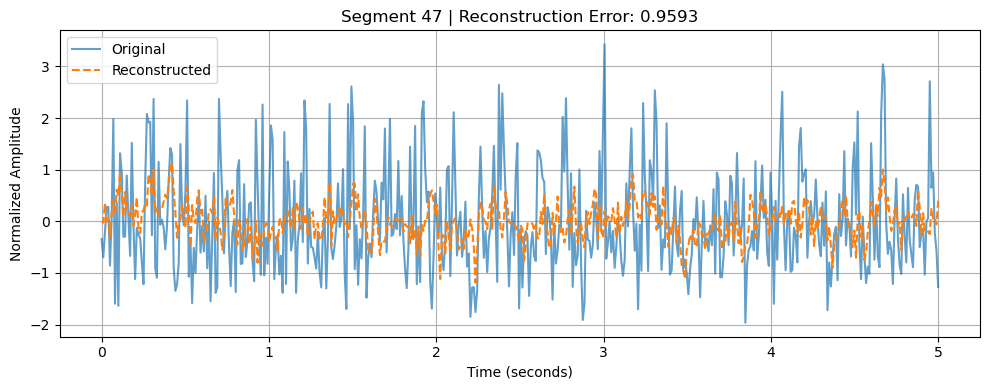

 Saved figure to: figures/High_error_Xtest_segment_47.png


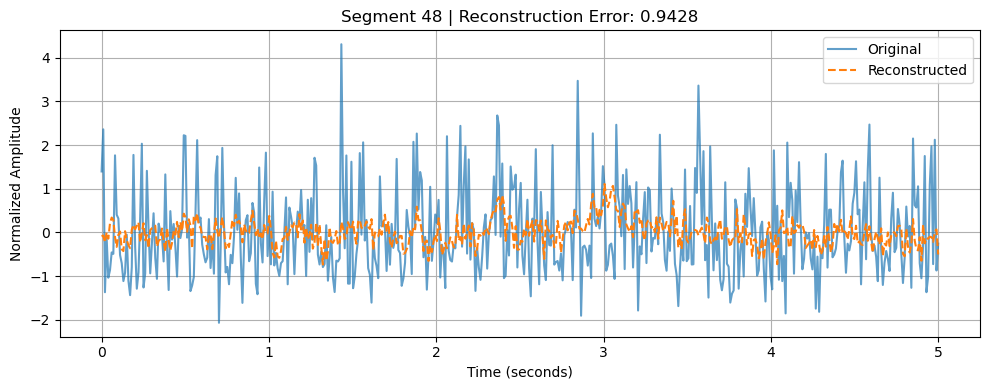

 Saved figure to: figures/High_error_Xtest_segment_48.png


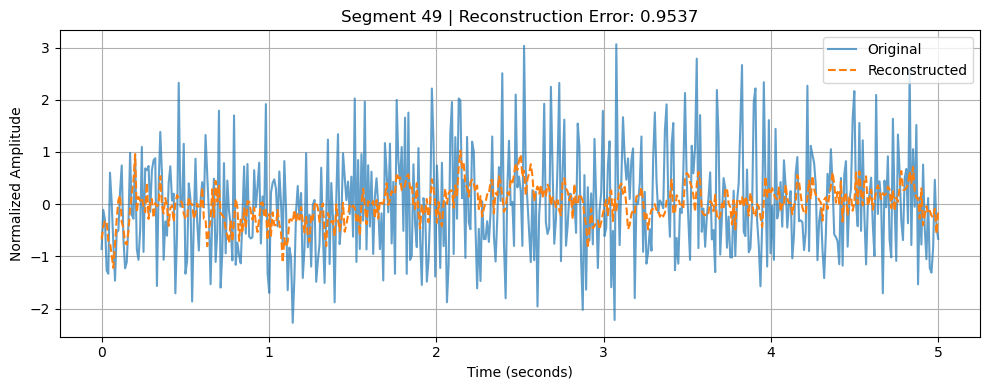

 Saved figure to: figures/High_error_Xtest_segment_49.png


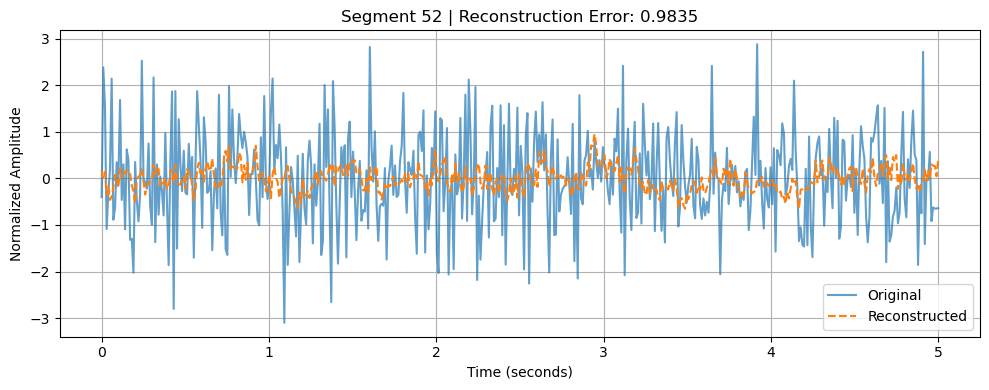

 Saved figure to: figures/High_error_Xtest_segment_52.png


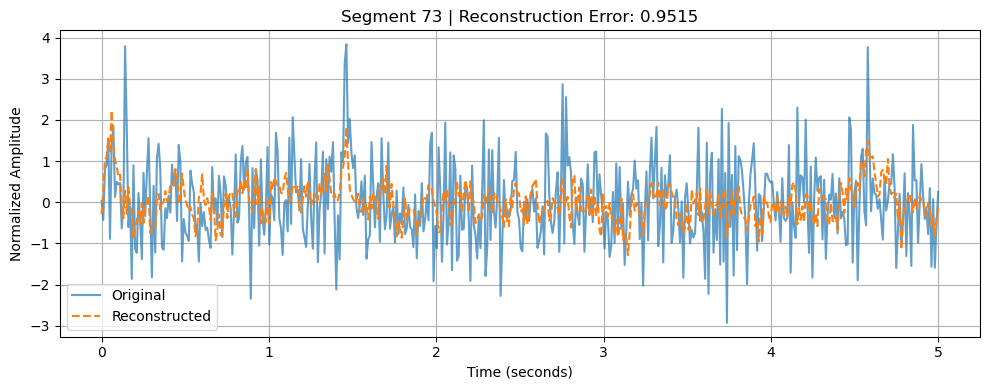

 Saved figure to: figures/High_error_Xtest_segment_73.png


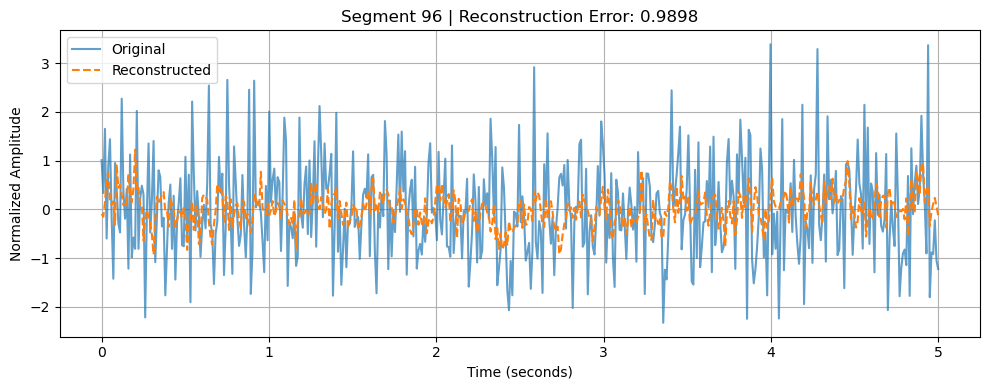

 Saved figure to: figures/High_error_Xtest_segment_96.png


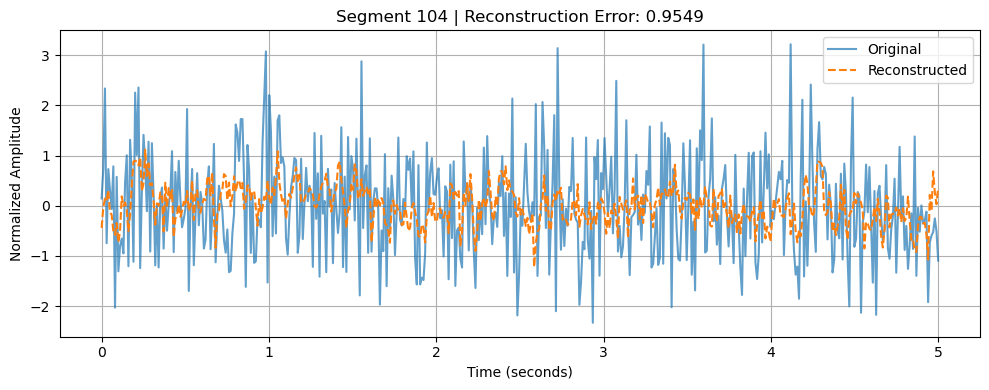

 Saved figure to: figures/High_error_Xtest_segment_104.png


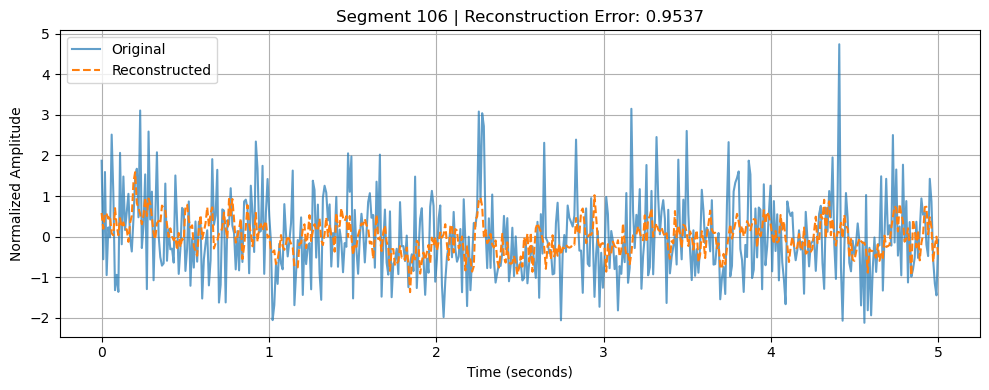

 Saved figure to: figures/High_error_Xtest_segment_106.png


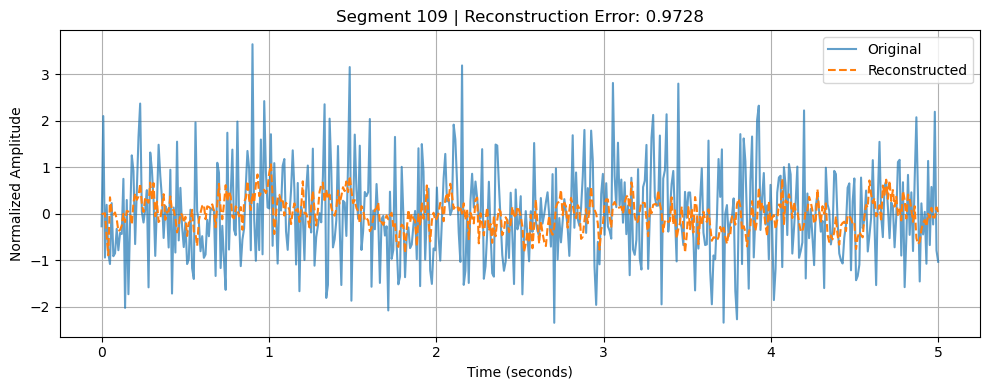

 Saved figure to: figures/High_error_Xtest_segment_109.png


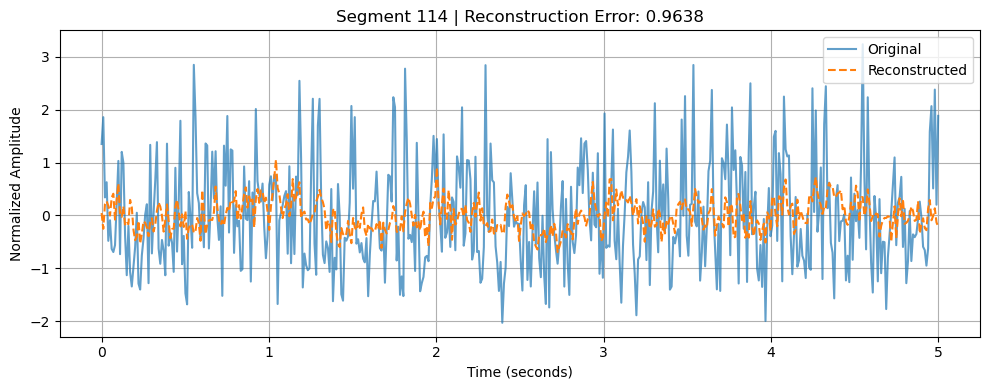

 Saved figure to: figures/High_error_Xtest_segment_114.png


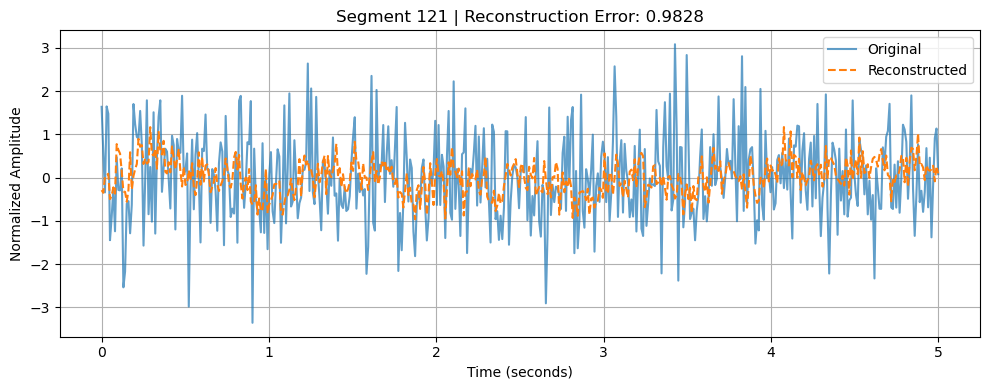

 Saved figure to: figures/High_error_Xtest_segment_121.png


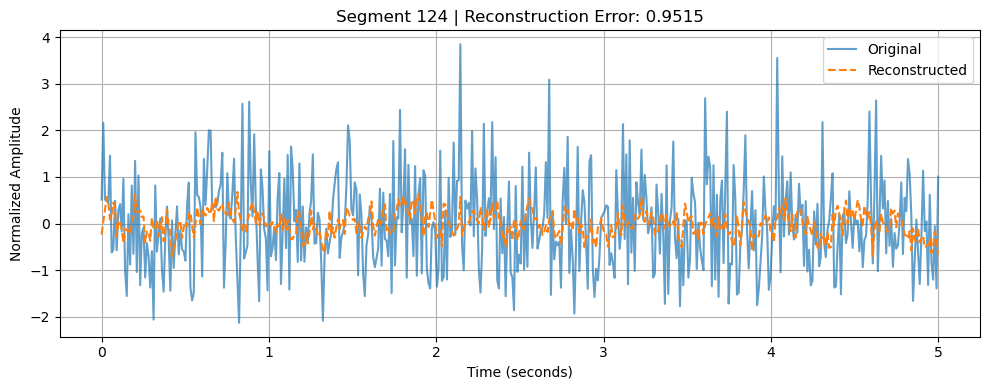

 Saved figure to: figures/High_error_Xtest_segment_124.png


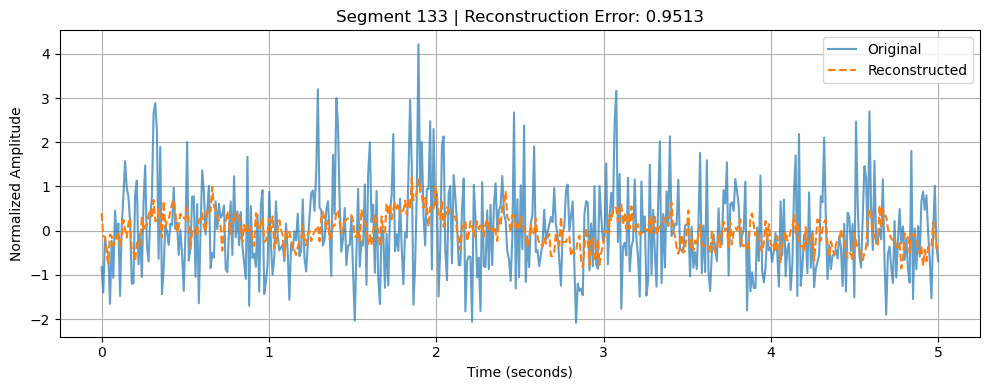

 Saved figure to: figures/High_error_Xtest_segment_133.png


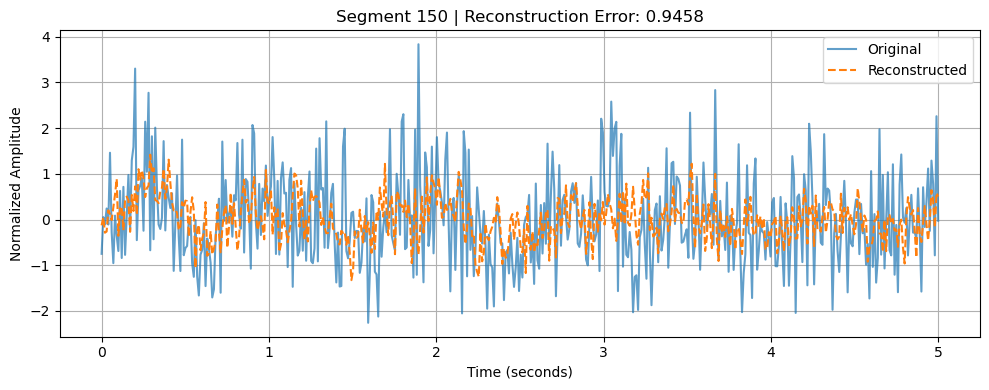

 Saved figure to: figures/High_error_Xtest_segment_150.png


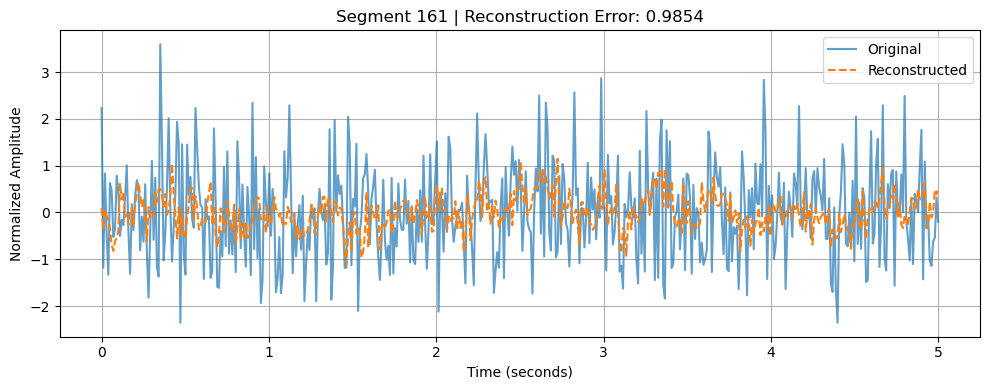

 Saved figure to: figures/High_error_Xtest_segment_161.png


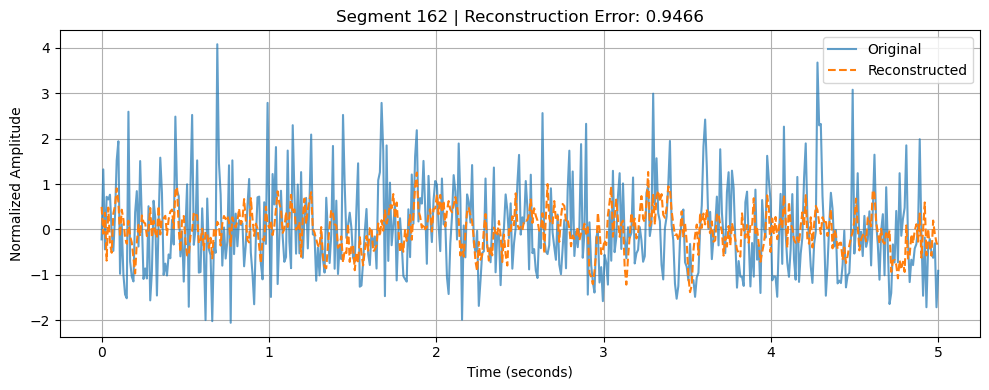

 Saved figure to: figures/High_error_Xtest_segment_162.png


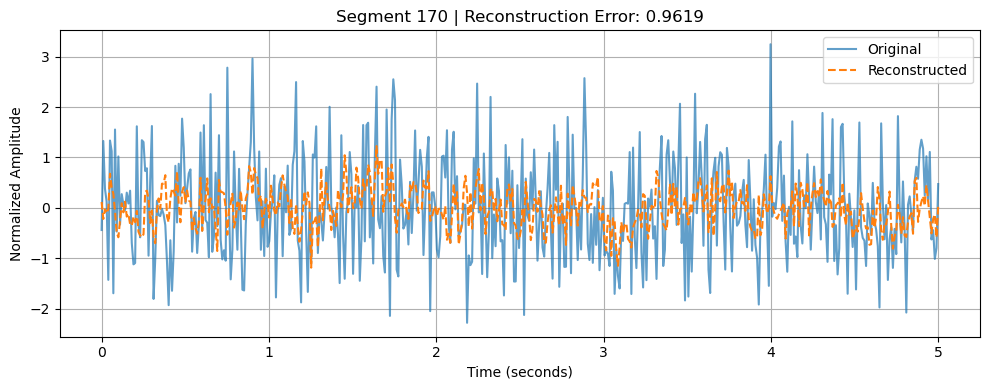

 Saved figure to: figures/High_error_Xtest_segment_170.png


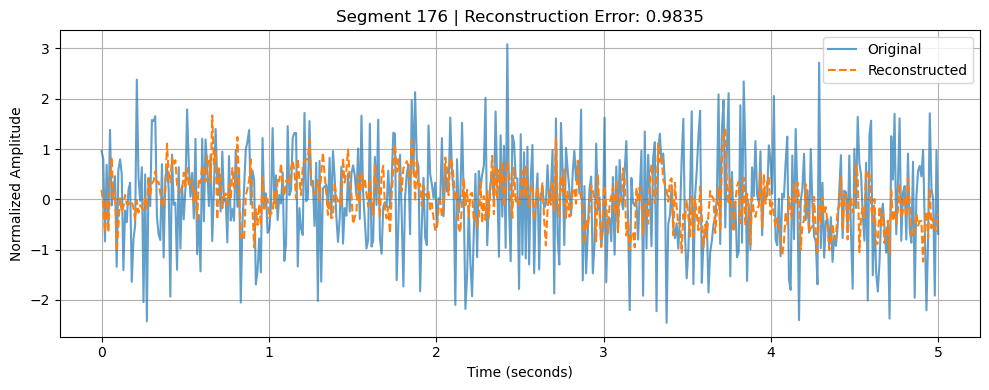

 Saved figure to: figures/High_error_Xtest_segment_176.png


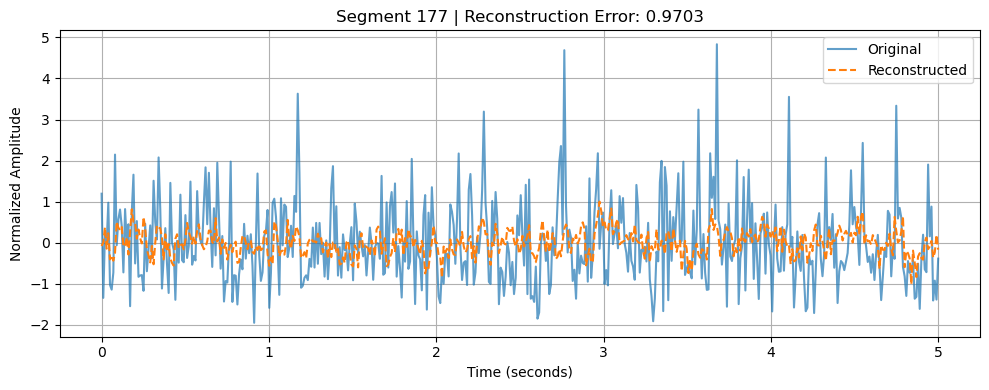

 Saved figure to: figures/High_error_Xtest_segment_177.png


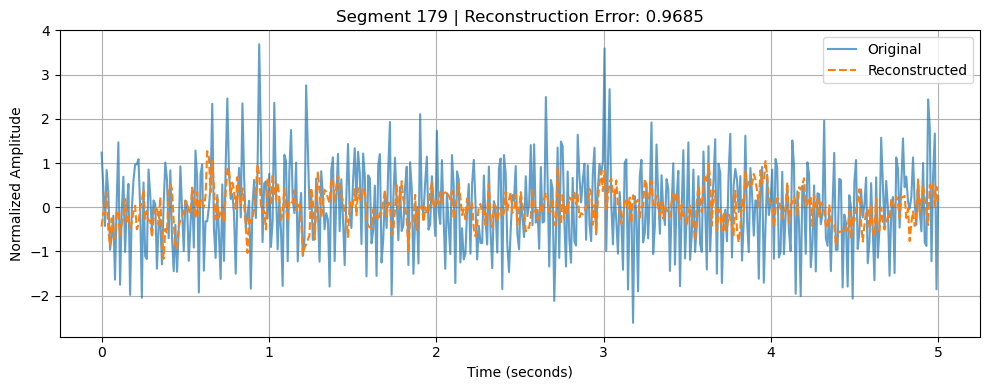

 Saved figure to: figures/High_error_Xtest_segment_179.png


In [36]:
# Compute high reconstruction error threshold
max_error = np.max(reconstruction_errors)
high_error_cutoff = max_error * 0.95

# Find indices of segments with very high error
high_error_indices = np.where(reconstruction_errors > high_error_cutoff)[0]

print(f"Maximum reconstruction error: {max_error:.4f}")
print(f"High error cutoff (95% of max): {high_error_cutoff:.4f}")
print(f"Number of high-error segments: {len(high_error_indices)}")
print(f"High-error indices: {high_error_indices}")

# Plot them
for i, idx in enumerate(high_error_indices):
    time_axis = np.linspace(0, 5, 500)  # 5 seconds at 100 Hz
    plt.figure(figsize=(10, 4))
    plt.plot(time_axis, X_test[idx], label="Original", alpha=0.7)
    plt.plot(time_axis, X_Pred[idx], label="Reconstructed", linestyle="--")
    plt.title(f"Segment {idx} | Reconstruction Error: {reconstruction_errors[idx]:.4f}")
    plt.xlabel("Time (seconds)")
    plt.ylabel("Normalized Amplitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    save_and_show(f"High_error_Xtest_segment_{idx}.png")

### Evaluate Earthquake Segments on Autoencoder


###### Sort Eartquake files to prepare for evaluation

In [38]:
# Folder name
base_dir = "segments_2500_std"

# Earthquake base names 
earthquake_bases = [
    "RE992_EQ_20240601T111409_10min",
    "RE992_EQ_20240814T022653_10min",
    "R5C62_EQ_trimmed_10min",
    "R77F9_EQ_trimmed_10min",
    "R853C_EQ_20240712T063946_10min",
    "R74A7_EQ_20220430T090645_10min",
    "R30A2_EQ_20250228T193324_10min",
    "R5156_EQ_20230222T060119_10min",
    "R47BB_EQ_20230722T164652_10min",
    "R5E3B_EQ_20250312T131039_10min"
]

# Find all matching .npy files
all_files = os.listdir(base_dir)
earthquake_files = []

for base in earthquake_bases:
    matches = [f for f in all_files if f.startswith(base) and f.endswith(".npy")]
    earthquake_files.extend(matches)

# Sort the result for clarity
earthquake_files = sorted(earthquake_files)

# Preview the list
print(f"Total earthquake files found: {len(earthquake_files)}")
for f in earthquake_files:
    print(f)

Total earthquake files found: 32
R30A2_EQ_20250228T193324_10min_EHE_segments.npy
R30A2_EQ_20250228T193324_10min_EHN_segments.npy
R30A2_EQ_20250228T193324_10min_EHZ_segments.npy
R47BB_EQ_20230722T164652_10min_EHZ_segments.npy
R47BB_EQ_20230722T164652_10min_ENE_segments.npy
R47BB_EQ_20230722T164652_10min_ENN_segments.npy
R47BB_EQ_20230722T164652_10min_ENZ_segments.npy
R5156_EQ_20230222T060119_10min_EHE_segments.npy
R5156_EQ_20230222T060119_10min_EHN_segments.npy
R5156_EQ_20230222T060119_10min_EHZ_segments.npy
R5C62_EQ_trimmed_10min_EHE_segments.npy
R5C62_EQ_trimmed_10min_EHN_segments.npy
R5C62_EQ_trimmed_10min_EHZ_segments.npy
R5E3B_EQ_20250312T131039_10min_EHZ_segments.npy
R5E3B_EQ_20250312T131039_10min_ENE_segments.npy
R5E3B_EQ_20250312T131039_10min_ENN_segments.npy
R5E3B_EQ_20250312T131039_10min_ENZ_segments.npy
R74A7_EQ_20220430T090645_10min_EHE_segments.npy
R74A7_EQ_20220430T090645_10min_EHN_segments.npy
R74A7_EQ_20220430T090645_10min_EHZ_segments.npy
R77F9_EQ_trimmed_10min_EHE_segm

 Evaluating Earthquake Segment Files (Normalized)...

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
R30A2_EQ_20250228T193324_10min_EHE_segments.npy: 9 anomalies out of 24 segments
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
R30A2_EQ_20250228T193324_10min_EHN_segments.npy: 17 anomalies out of 24 segments
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
R30A2_EQ_20250228T193324_10min_EHZ_segments.npy: 4 anomalies out of 24 segments
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
R47BB_EQ_20230722T164652_10min_EHZ_segments.npy: 5 anomalies out of 24 segments
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
R47BB_EQ_20230722T164652_10min_ENE_segments.npy: 21 anomalies out of 24 segments
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
R47BB_EQ_20230722T164652_10min_ENN_segments.npy: 20 anomalies out of 24 segments
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
R47BB_EQ_20230722T164652_10min_ENZ_segments.npy: 20 anomalies out of 24 segments
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
R5156_EQ_20230222T060119_10min_EHE_segments.npy: 0 anomalies out of 24 segment

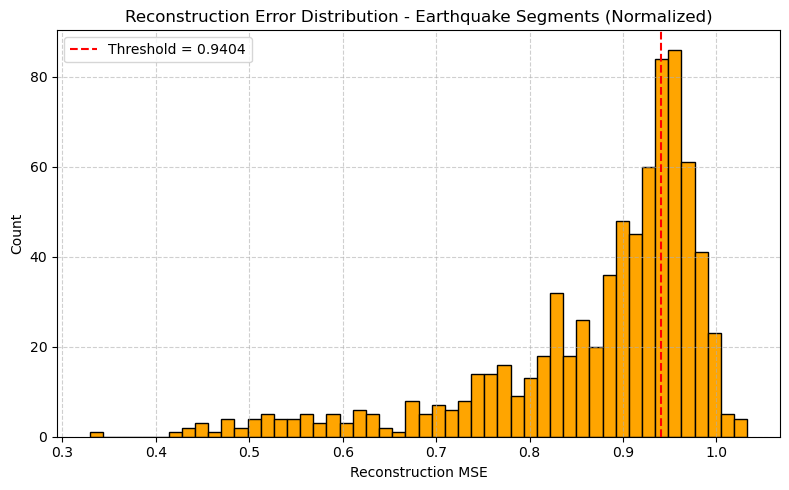

 Saved figure to: figures/Reconstruction_error_distri_EQ.png


In [40]:
# Parameters
base_dir = "segments_2500_std"
threshold = 0.9404  # from 95% of max
model = autoencoder_std  # Trained autoencoder

# List of earthquake file bases
earthquake_bases = [
    "RE992_EQ_20240601T111409_10min",
    "RE992_EQ_20240814T022653_10min",
    "R5C62_EQ_trimmed_10min",
    "R77F9_EQ_trimmed_10min",
    "R853C_EQ_20240712T063946_10min",
    "R74A7_EQ_20220430T090645_10min",
    "R30A2_EQ_20250228T193324_10min",
    "R5156_EQ_20230222T060119_10min",
    "R47BB_EQ_20230722T164652_10min",
    "R5E3B_EQ_20250312T131039_10min"
]

# Find all matching earthquake .npy files
all_files = os.listdir(base_dir)
earthquake_files = []
for base in earthquake_bases:
    matches = [f for f in all_files if f.startswith(base) and f.endswith(".npy")]
    earthquake_files.extend(matches)

earthquake_files = sorted(earthquake_files)

# Evaluate
total_segments = 0
total_anomalies = 0
all_errors = []

print(" Evaluating Earthquake Segment Files (Normalized)...\n")

for fname in earthquake_files:
    path = os.path.join(base_dir, fname)
    data = np.load(path).astype("float32")

    #  Per-segment normalization 
    means = data.mean(axis=1, keepdims=True)
    stds = data.std(axis=1, keepdims=True) + 1e-8
    data_norm = (data - means) / stds

    # Predict and compute error
    preds = model.predict(data_norm)
    errors = np.mean((data_norm - preds) ** 2, axis=1)
    all_errors.extend(errors)

    anomalies = np.sum(errors > threshold)
    total_segments += len(data)
    total_anomalies += anomalies

    print(f"{fname}: {anomalies} anomalies out of {len(data)} segments")

# Summary
print("\n Earthquake Detection Summary (Normalized):")
print(f"• Total segments analyzed: {total_segments}")
print(f"• Total anomalies detected: {total_anomalies}")
print(f"• Detection rate: {(total_anomalies / total_segments) * 100:.2f}%")

# Histogram
plt.figure(figsize=(8, 5))
plt.hist(all_errors, bins=50, color='orange', edgecolor='black')
plt.axvline(threshold, color='red', linestyle='--', label=f"Threshold = {threshold:.4f}")
plt.title("Reconstruction Error Distribution - Earthquake Segments (Normalized)")
plt.xlabel("Reconstruction MSE")
plt.ylabel("Count")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
save_and_show("Reconstruction_error_distri_EQ.png")

##### Reconstruction Error Comparison

In [42]:
# Split EQ and Non-EQ error arrays
eq_errors = np.array(all_errors)
non_eq_errors = reconstruction_errors  # from earlier non-earthquake test set

# Compare basic stats
print("\n Reconstruction Error Comparison:")
print(f"• EQ Segments - Mean MSE: {eq_errors.mean():.4f}, Std: {eq_errors.std():.4f}")
print(f"• Non-EQ Segments - Mean MSE: {non_eq_errors.mean():.4f}, Std: {non_eq_errors.std():.4f}")


 Reconstruction Error Comparison:
• EQ Segments - Mean MSE: 0.8709, Std: 0.1225
• Non-EQ Segments - Mean MSE: 0.7496, Std: 0.1690


#### Visualise Reconstruction Error Comaparison

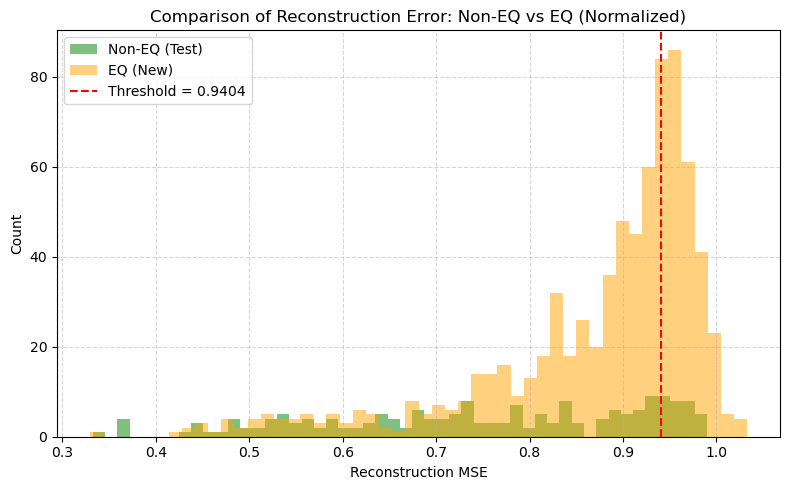

 Saved figure to: figures/Reconstruction_error_EQ_vs_NonEQ.png


In [44]:
plt.figure(figsize=(8, 5))
plt.hist(reconstruction_errors, bins=50, alpha=0.5, label='Non-EQ (Test)', color='green')
plt.hist(all_errors, bins=50, alpha=0.5, label='EQ (New)', color='orange')
plt.axvline(threshold, color='red', linestyle='--', label=f"Threshold = {threshold:.4f}")
plt.xlabel("Reconstruction MSE")
plt.ylabel("Count")
plt.legend()
plt.title("Comparison of Reconstruction Error: Non-EQ vs EQ (Normalized)")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
save_and_show("Reconstruction_error_EQ_vs_NonEQ.png")

##### Identify segments that are most anomalous within the earthquake group.


 95th Percentile Threshold (based on EQ errors): 0.9886
 Anomalous EQ segments: 39 / 768


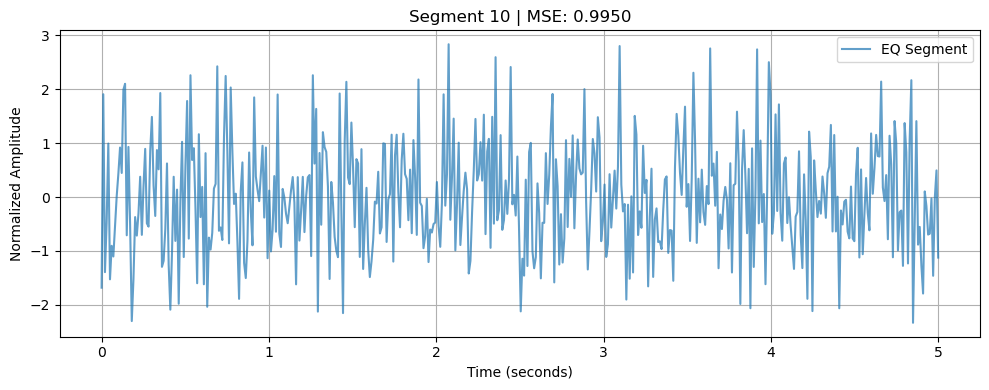

 Saved figure to: figures/Anomalous_EQ_segment_10.png


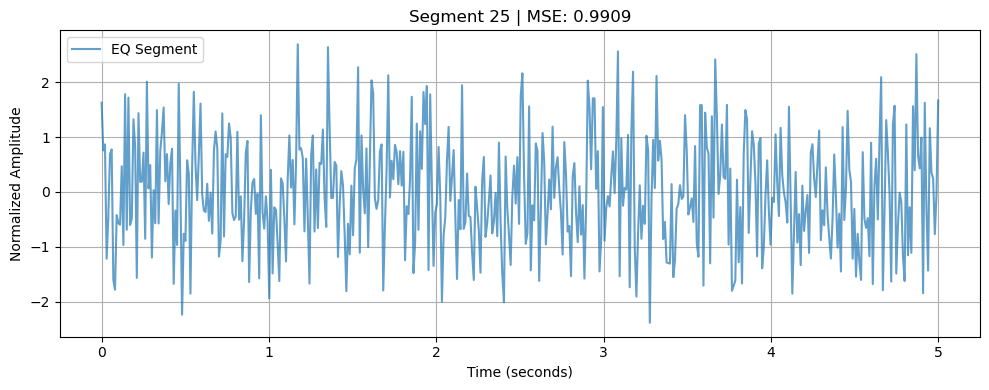

 Saved figure to: figures/Anomalous_EQ_segment_25.png


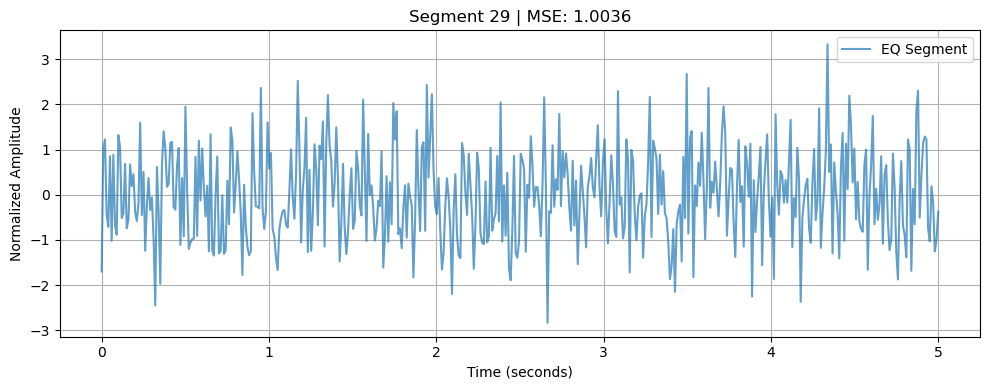

 Saved figure to: figures/Anomalous_EQ_segment_29.png


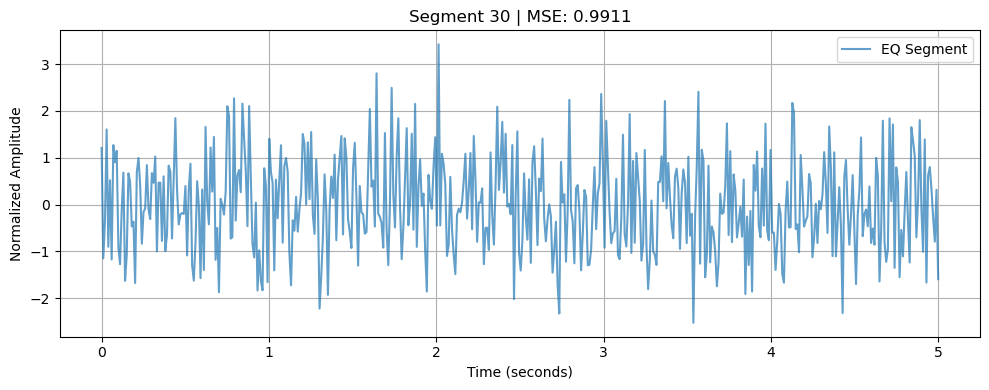

 Saved figure to: figures/Anomalous_EQ_segment_30.png


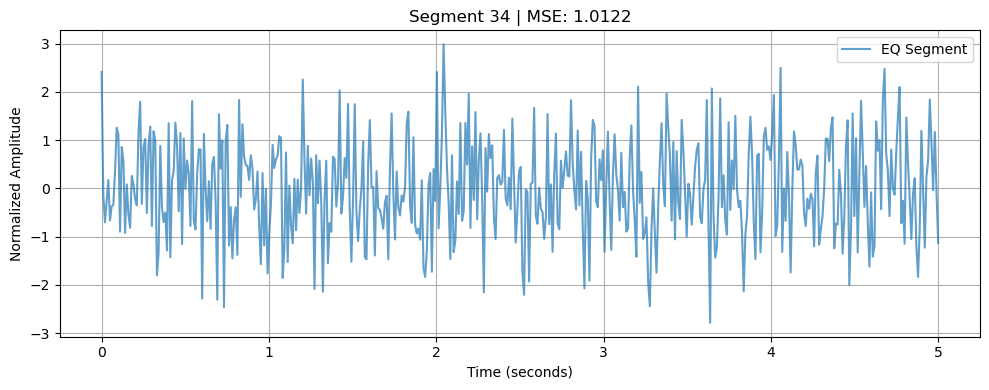

 Saved figure to: figures/Anomalous_EQ_segment_34.png


In [46]:
# Convert all_errors to a NumPy array
all_errors_eq = np.array(all_errors)

# Stack all EQ segments into one array for use
all_eq_segments = np.vstack([np.load(os.path.join(base_dir, f)).astype("float32") for f in earthquake_files])

# Re-normalize all segments 
means = all_eq_segments.mean(axis=1, keepdims=True)
stds = all_eq_segments.std(axis=1, keepdims=True) + 1e-8
all_eq_segments_norm = (all_eq_segments - means) / stds

# Apply 95th percentile threshold
threshold_95 = np.percentile(all_errors_eq, 95)
print(f"\n 95th Percentile Threshold (based on EQ errors): {threshold_95:.4f}")

# Identify "anomalous" segments
anomalous_indices_95 = np.where(all_errors_eq > threshold_95)[0]
print(f" Anomalous EQ segments: {len(anomalous_indices_95)} / {len(all_errors_eq)}")

# Save for later analysis
np.save("eq1_anomalous_indices_95.npy", anomalous_indices_95)
np.save("eq1_anomalous_segments_95.npy", all_eq_segments_norm[anomalous_indices_95])

# Plot top 5 of them 
time_axis = np.linspace(0, 5, 500)  # 5 seconds at 100 Hz
for i, idx in enumerate(anomalous_indices_95[:5]):
    plt.figure(figsize=(10, 4))
    plt.plot(time_axis, all_eq_segments_norm[idx], label="EQ Segment", alpha=0.7)
    plt.title(f"Segment {idx} | MSE: {all_errors_eq[idx]:.4f}")
    plt.xlabel("Time (seconds)")
    plt.ylabel("Normalized Amplitude")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    save_and_show(f"Anomalous_EQ_segment_{idx}.png")

In [48]:
print("Shape of segment array:", all_eq_segments_norm.shape)
print("Length of anomaly indices:", len(anomalous_indices_95))
print("Max index in anomaly list:", np.max(anomalous_indices_95))

Shape of segment array: (768, 500)
Length of anomaly indices: 39
Max index in anomaly list: 729


#### Show Reconstructed EQ Segments

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


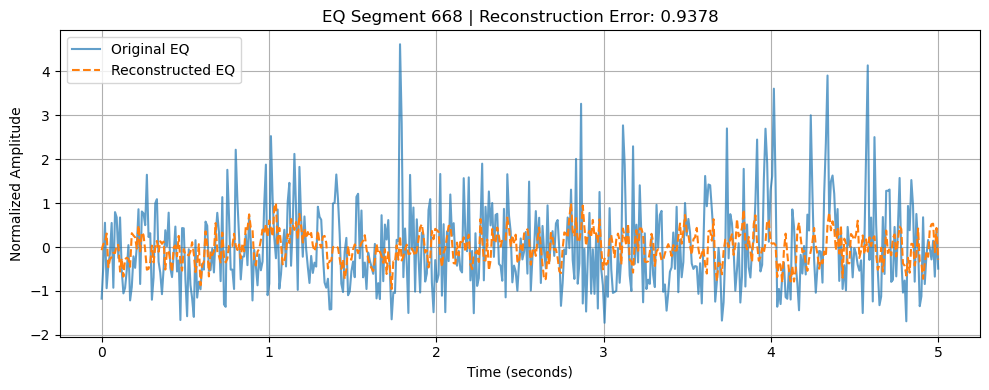

 Saved figure to: figures/EQ_Recon_668.png


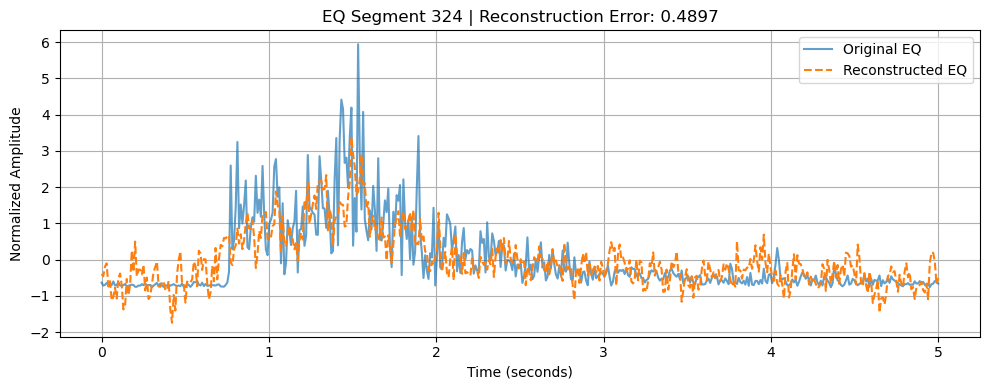

 Saved figure to: figures/EQ_Recon_324.png


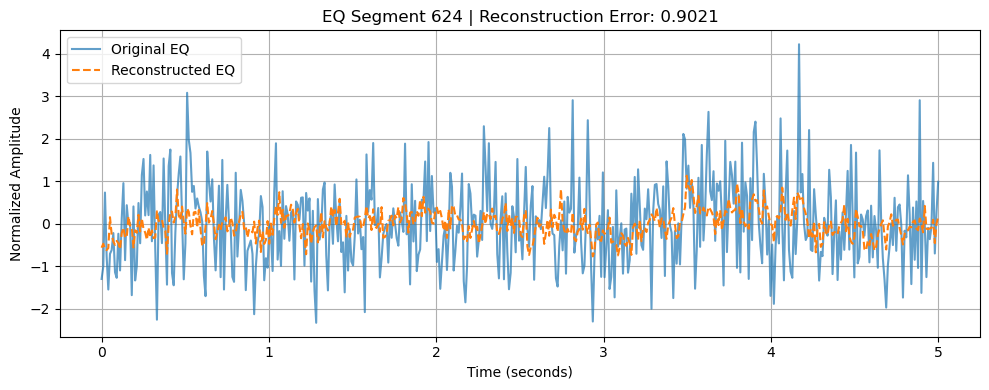

 Saved figure to: figures/EQ_Recon_624.png


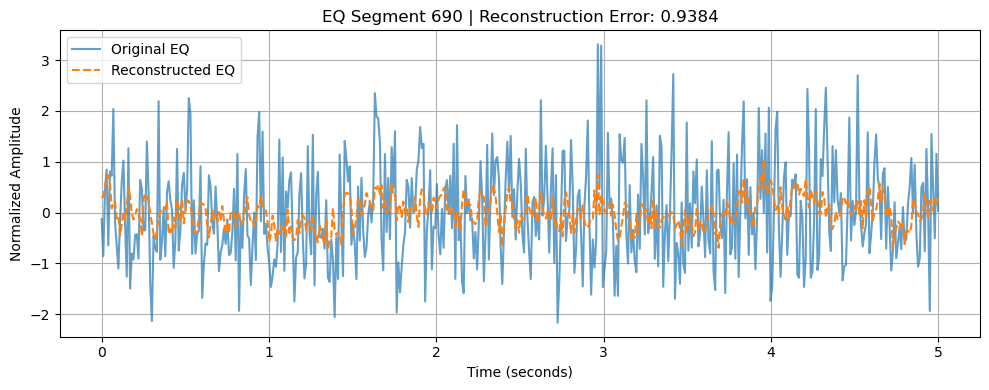

 Saved figure to: figures/EQ_Recon_690.png


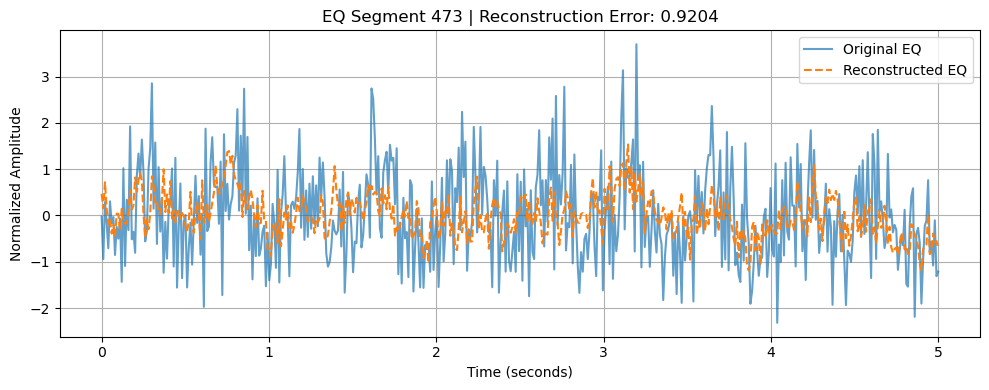

 Saved figure to: figures/EQ_Recon_473.png


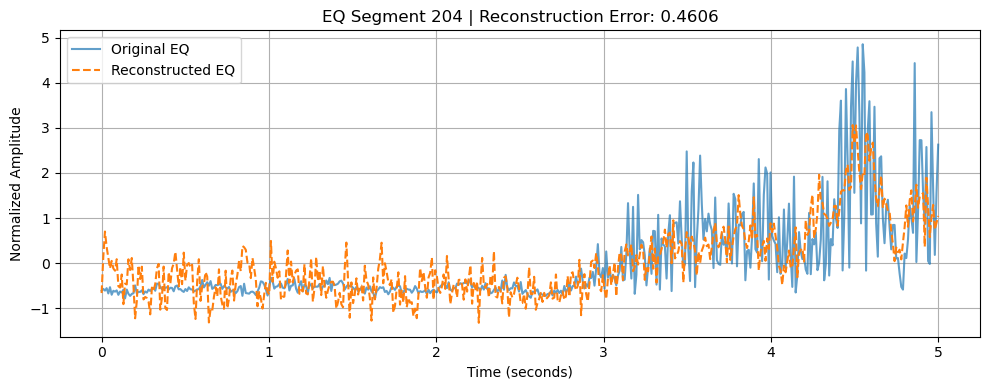

 Saved figure to: figures/EQ_Recon_204.png


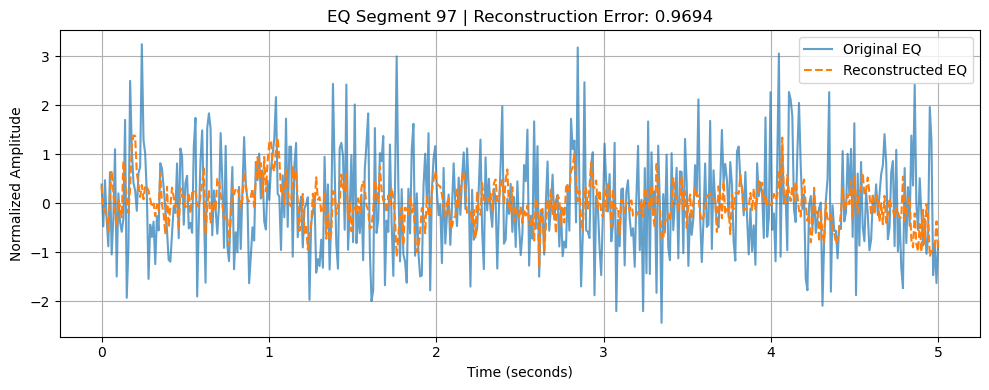

 Saved figure to: figures/EQ_Recon_97.png


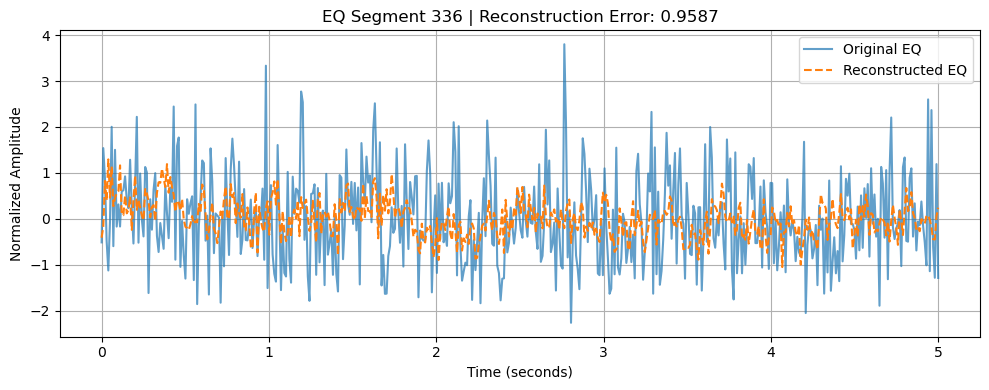

 Saved figure to: figures/EQ_Recon_336.png


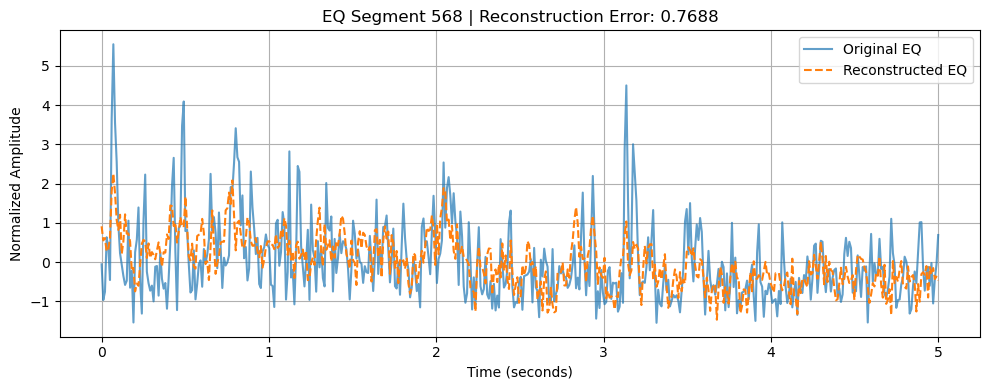

 Saved figure to: figures/EQ_Recon_568.png


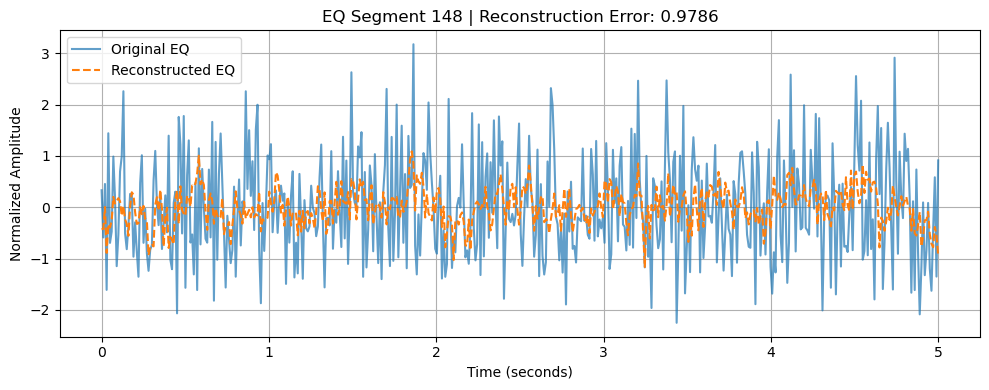

 Saved figure to: figures/EQ_Recon_148.png


In [50]:
import random

# Choose 10 random earthquake segment indices to inspect
np.random.seed(42)
inspect_indices = np.random.choice(len(all_eq_segments_norm), size=10, replace=False)

# Predict with trained model
reconstructed_eq = autoencoder_std.predict(all_eq_segments_norm)

# Plot original vs reconstructed for EQ segments
for idx in inspect_indices:
    plt.figure(figsize=(10, 4))
    plt.plot(time_axis, all_eq_segments_norm[idx], label="Original EQ", alpha=0.7)
    plt.plot(time_axis, reconstructed_eq[idx], label="Reconstructed EQ", linestyle='--')
    plt.title(f"EQ Segment {idx} | Reconstruction Error: {np.mean((all_eq_segments_norm[idx] - reconstructed_eq[idx])**2):.4f}")
    plt.xlabel("Time (seconds)")
    plt.ylabel("Normalized Amplitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    save_and_show(f"EQ_Recon_{idx}.png")

#### Compare Mean Feature Values for EQ vs Non-EQ

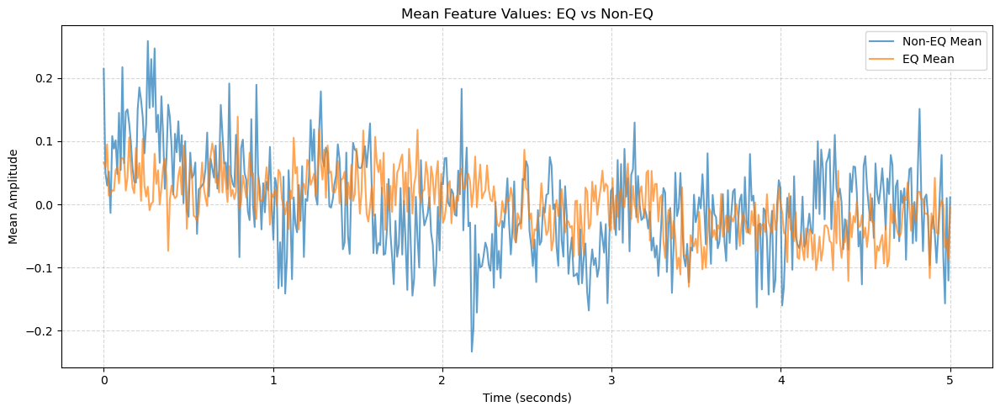

 Saved figure to: figures/Mean_Features_EQ_vs_NonEQ.png


In [52]:
# Compute per-feature mean across all non-earthquake segments
mean_non_eq = X_test.mean(axis=0)

# Compute per-feature mean across all earthquake segments
mean_eq = all_eq_segments_norm.mean(axis=0)

# Plot
plt.figure(figsize=(12, 5))
plt.plot(time_axis, mean_non_eq, label="Non-EQ Mean", alpha=0.7)
plt.plot(time_axis, mean_eq, label="EQ Mean", alpha=0.7)
plt.title("Mean Feature Values: EQ vs Non-EQ")
plt.xlabel("Time (seconds)")
plt.ylabel("Mean Amplitude")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
save_and_show("Mean_Features_EQ_vs_NonEQ.png")

#### Compare Standard Deviation Feature Values for EQ vs Non-EQ

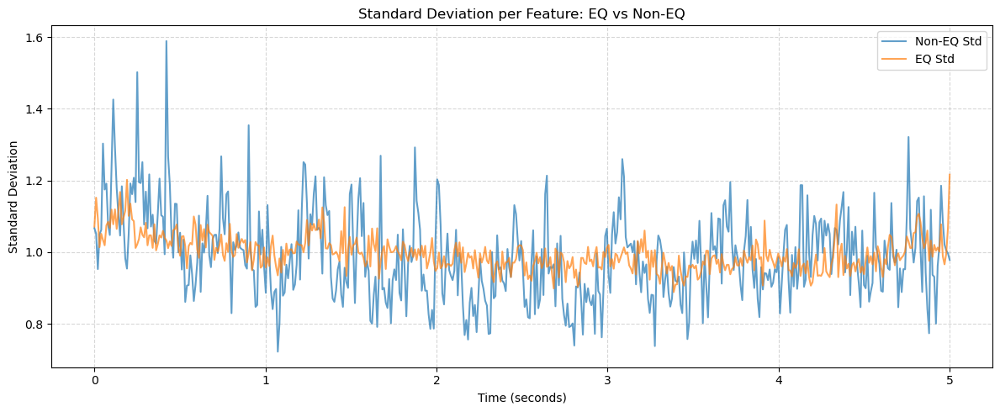

 Saved figure to: figures/STD_Features_EQ_vs_NonEQ.png


In [54]:
# Compute per-feature std across all non-earthquake segments
std_non_eq = X_test.std(axis=0)

# Compute per-feature std across all earthquake segments
std_eq = all_eq_segments_norm.std(axis=0)

# Plot
plt.figure(figsize=(12, 5))
plt.plot(time_axis, std_non_eq, label="Non-EQ Std", alpha=0.7)
plt.plot(time_axis, std_eq, label="EQ Std", alpha=0.7)
plt.title("Standard Deviation per Feature: EQ vs Non-EQ")
plt.xlabel("Time (seconds)")
plt.ylabel("Standard Deviation")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
save_and_show("STD_Features_EQ_vs_NonEQ.png")

#### Plot a few raw waveforms (5 from each class)

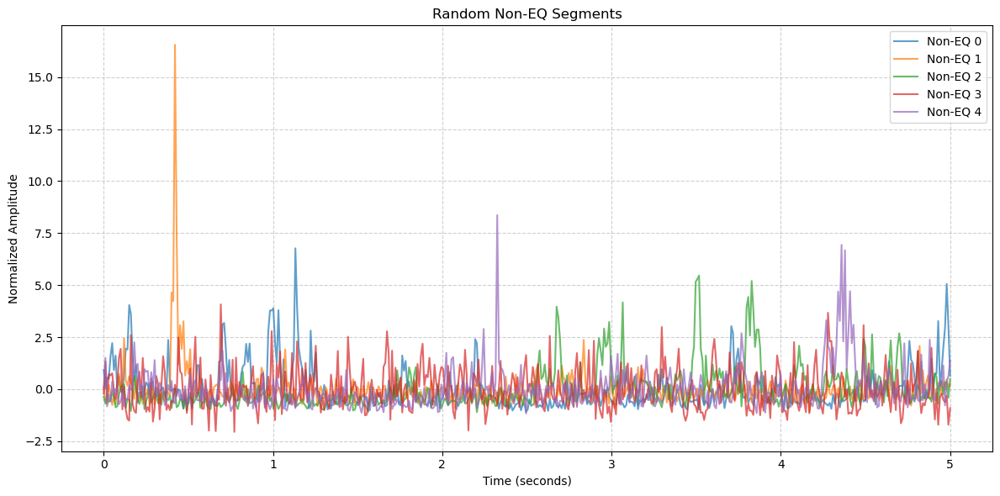

 Saved figure to: figures/Raw_waveforms_NonEQ.png


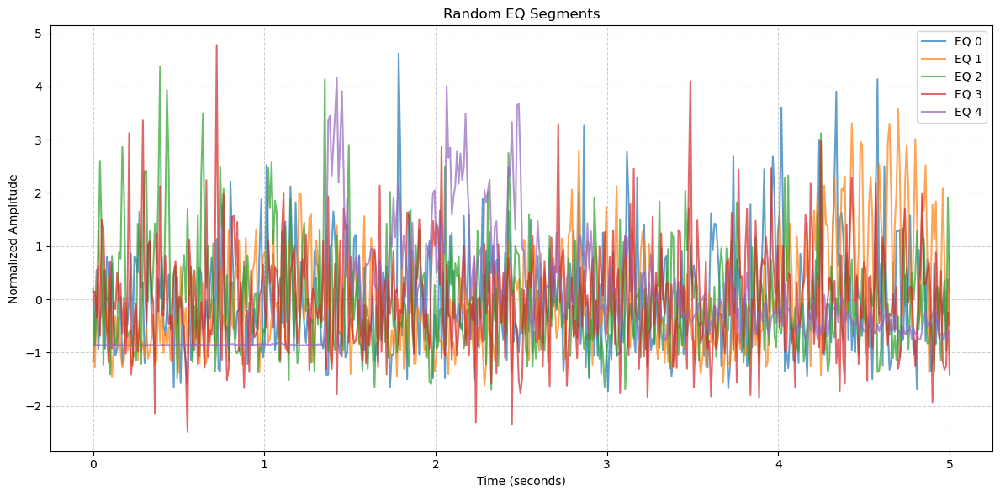

 Saved figure to: figures/Raw_waveforms_EQ.png


In [56]:
# Plot random 5 non-earthquake segments
plt.figure(figsize=(12, 6))
for i in range(5):
    idx = random.randint(0, X_test.shape[0] - 1)
    plt.plot(time_axis, X_test[idx], label=f"Non-EQ {i}", alpha=0.7)
plt.title("Random Non-EQ Segments")
plt.xlabel("Time (seconds)")
plt.ylabel("Normalized Amplitude")
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
save_and_show("Raw_waveforms_NonEQ.png")

# Plot random 5 earthquake segments
plt.figure(figsize=(12, 6))
for i in range(5):
    idx = random.randint(0, all_eq_segments_norm.shape[0] - 1)
    plt.plot(time_axis, all_eq_segments_norm[idx], label=f"EQ {i}", alpha=0.7)
plt.title("Random EQ Segments")
plt.xlabel("Time (seconds)")
plt.ylabel("Normalized Amplitude")
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
save_and_show("Raw_waveforms_EQ.png")

##### Run loop to test thresholds from 0.95 to 1.3 (Guiding Threshold Selection)

In [58]:
# Get non-EQ train reconstruction errors
decoded_train = autoencoder_std.predict(X_train)
train_errors = np.mean((X_train - decoded_train) ** 2, axis=1)

# Sweep thresholds from 0.95 to 1.3
sweep_thresholds = np.linspace(0.95, 1.15, 25)
anomaly_counts = []

# Evaluate on EQ segments
all_eq_errors = []

for fname in earthquake_files:
    path = os.path.join(base_dir, fname)
    data = np.load(path).astype("float32")

    # Normalize each segment
    means = data.mean(axis=1, keepdims=True)
    stds = data.std(axis=1, keepdims=True) + 1e-8
    data_norm = (data - means) / stds

    preds = autoencoder_std.predict(data_norm)
    errors = np.mean((data_norm - preds) ** 2, axis=1)
    all_eq_errors.extend(errors)

all_eq_errors = np.array(all_eq_errors)

# Count anomalies at each threshold
for t in sweep_thresholds:
    count = np.sum(all_eq_errors > t)
    anomaly_counts.append(count)

# Print summary
for t, count in zip(sweep_thresholds, anomaly_counts):
    print(f"Threshold = {t:.4f} → {count} anomalies ({100*count/len(all_eq_errors):.2f}%)")

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━

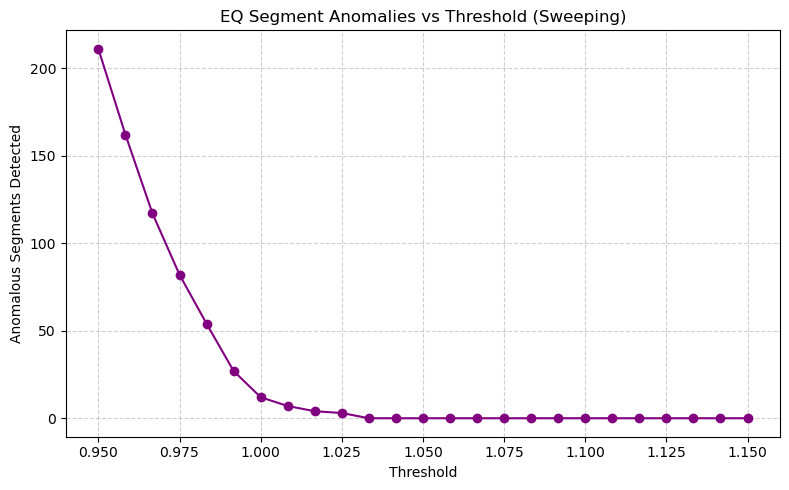

 Saved figure to: figures/EQ_Anomalies_vs_threshold_sweeping.png


In [60]:
# Plot sweep result
plt.figure(figsize=(8, 5))
plt.plot(sweep_thresholds, anomaly_counts, marker='o', color='purple')
plt.title("EQ Segment Anomalies vs Threshold (Sweeping)")
plt.xlabel("Threshold")
plt.ylabel("Anomalous Segments Detected")
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
save_and_show("EQ_Anomalies_vs_threshold_sweeping.png")

##### Save Reconstruction errors for evaluation

In [62]:
# Save the EQ segment reconstruction errors from threshold 0.9404 evaluation
np.save("eq_errors_threshold_0.9404.npy", all_eq_errors)

# Save the Non-EQ reconstruction errors (from X_test predictions)
np.save("non_eq_errors_threshold_0.9404.npy", reconstruction_errors)

print(" EQ and Non-EQ reconstruction error files saved.")

 EQ and Non-EQ reconstruction error files saved.


##### Evaluation of autoencoder’s performance using the saved EQ and Non-EQ reconstruction errors

In [66]:
from sklearn.metrics import roc_curve, auc, precision_recall_fscore_support, confusion_matrix
import seaborn as sns

# Load the saved reconstruction errors
eq_errors = np.load("eq_errors_threshold_0.9404.npy")
non_eq_errors = np.load("non_eq_errors_threshold_0.9404.npy")

# Combine and label
y_true = np.concatenate([np.ones_like(eq_errors), np.zeros_like(non_eq_errors)])  # 1 = EQ, 0 = Non-EQ
y_scores = np.concatenate([eq_errors, non_eq_errors])  # MSE scores from autoencoder

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_true, y_scores)
roc_auc = auc(fpr, tpr)

# Optimal threshold (picking the one that maximizes TPR - FPR)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]

# Predictions using optimal threshold
y_pred = (y_scores > optimal_threshold).astype(int)

# Precision, Recall, F1
precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='binary')

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

# Print metrics
print(" Evaluation Metrics (Autoencoder Anomaly Detection):")
print(f"• ROC-AUC: {roc_auc:.4f}")
print(f"• Optimal Threshold: {optimal_threshold:.4f}")
print(f"• Precision: {precision:.4f}")
print(f"• Recall: {recall:.4f}")
print(f"• F1-Score: {f1:.4f}")

 Evaluation Metrics (Autoencoder Anomaly Detection):
• ROC-AUC: 0.7173
• Optimal Threshold: 0.8497
• Precision: 0.8987
• Recall: 0.7044
• F1-Score: 0.7898


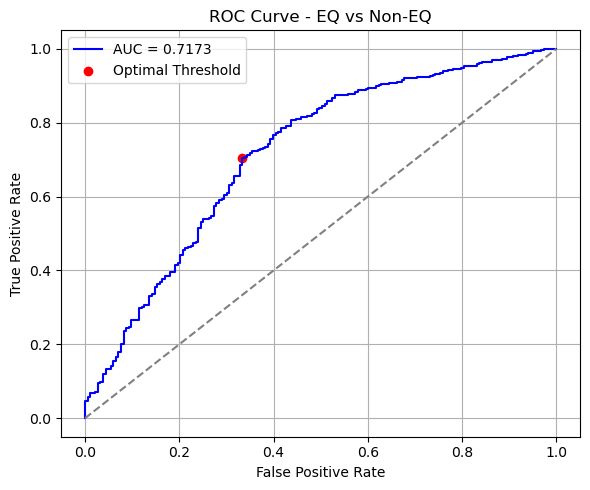

 Saved figure to: figures/ROC_Curve_EQ_vs_NonEQ.png


In [68]:
# Plot ROC Curve
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.4f}", color='blue')
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.scatter(fpr[optimal_idx], tpr[optimal_idx], color="red", label="Optimal Threshold")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - EQ vs Non-EQ")
plt.legend()
plt.grid(True)
plt.tight_layout()
save_and_show("ROC_Curve_EQ_vs_NonEQ.png")

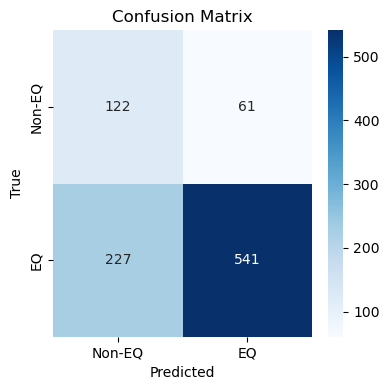

 Saved figure to: figures/Autoencoder_confusion_Matrix_EQ_vs_NonEQ.png


In [70]:
# Plot Confusion Matrix 
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Non-EQ", "EQ"], yticklabels=["Non-EQ", "EQ"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.tight_layout()
save_and_show("Autoencoder_confusion_Matrix_EQ_vs_NonEQ.png")

##### Exploring top 5 thresholds sorted descending by computing TPR - FPR for each threshold

In [72]:
# Compute TPR - FPR for each threshold
separation_scores = tpr - fpr

# Get top 5 best thresholds
top_indices = np.argsort(separation_scores)[-5:][::-1] # Top 5, sorted descending
print("\nTop 5 Thresholds Based on TPR - FPR:")
for i in top_indices:
    print(f"Threshold: {thresholds[i]:.4f} | TPR: {tpr[i]:.3f} | FPR: {fpr[i]:.3f} | TPR - FPR: {separation_scores[i]:.3f}")


Top 5 Thresholds Based on TPR - FPR:
Threshold: 0.8497 | TPR: 0.706 | FPR: 0.333 | TPR - FPR: 0.372
Threshold: 0.7954 | TPR: 0.807 | FPR: 0.437 | TPR - FPR: 0.370
Threshold: 0.8134 | TPR: 0.785 | FPR: 0.415 | TPR - FPR: 0.370
Threshold: 0.8488 | TPR: 0.707 | FPR: 0.339 | TPR - FPR: 0.368
Threshold: 0.8460 | TPR: 0.712 | FPR: 0.344 | TPR - FPR: 0.368


##### Precision-Recall (PR) curve using saved EQ and Non-EQ reconstruction error files.

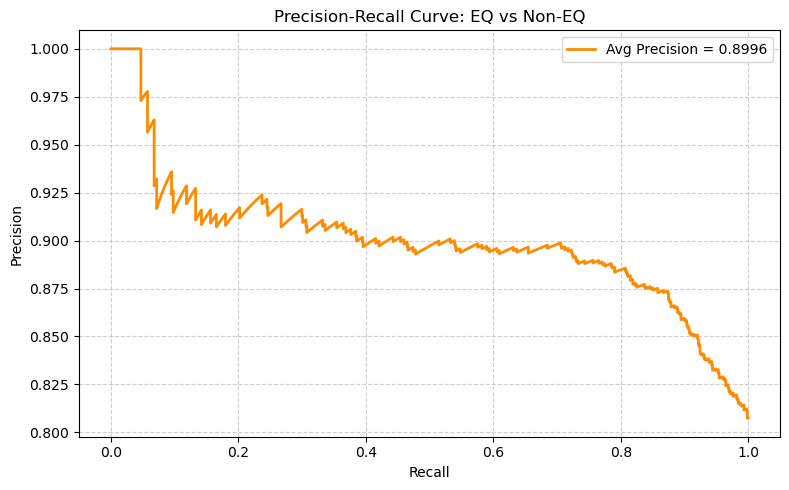

 Saved figure to: figures/Precision_Recall_Curve_EQ_vs_NonEQ.png


In [79]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Load EQ and Non-EQ reconstruction errors
eq_errors = np.load("eq_errors_threshold_0.9404.npy")
non_eq_errors = np.load("non_eq_errors_threshold_0.9404.npy")

# Combine errors and create true labels
all_errors = np.concatenate([non_eq_errors, eq_errors])
labels = np.concatenate([np.zeros_like(non_eq_errors), np.ones_like(eq_errors)])

# Compute precision-recall values
precision, recall, thresholds = precision_recall_curve(labels, all_errors)
avg_precision = average_precision_score(labels, all_errors)

# Plot PR Curve
plt.figure(figsize=(8, 5))
plt.plot(recall, precision, color='darkorange', lw=2, label=f"Avg Precision = {avg_precision:.4f}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve: EQ vs Non-EQ")
plt.legend(loc="best")
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
save_and_show("Precision_Recall_Curve_EQ_vs_NonEQ.png")

#### Re-evaluate EQ Segments with Optimal Threshold

 Evaluating Earthquake Segment Files (Normalized)...

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
R30A2_EQ_20250228T193324_10min_EHE_segments.npy: 21 anomalies out of 24 segments
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
R30A2_EQ_20250228T193324_10min_EHN_segments.npy: 21 anomalies out of 24 segments
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
R30A2_EQ_20250228T193324_10min_EHZ_segments.npy: 20 anomalies out of 24 segments
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
R47BB_EQ_20230722T164652_10min_EHZ_segments.npy: 15 anomalies out of 24 segments
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
R47BB_EQ_20230722T164652_10min_ENE_segments.npy: 24 anomalies out of 24 segments
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
R47BB_EQ_20230722T164652_10min_ENN_segments.npy: 24 anomalies out of 24 segments
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
R47BB_EQ_20230722T164652_10min_ENZ_segments.npy: 24 anomalies out of 24 segments
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
R5156_EQ_20230222T060119_10min_EHE_segments.npy: 8 anomalies out of 24 segm

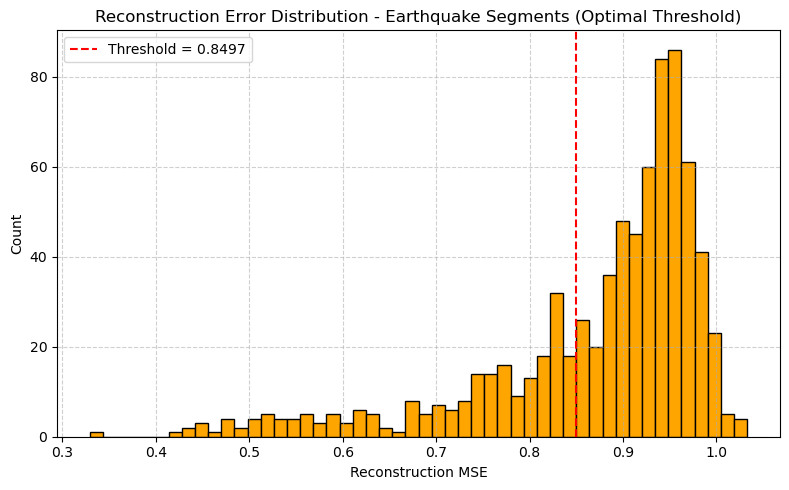

 Saved figure to: figures/Optimal_Reconstruction_error_distri_EQ.png


In [96]:
# Parameters
base_dir = "segments_2500_std"
threshold = 0.8497  # from optimal threshold
model = autoencoder_std  # Trained autoencoder

# List of earthquake file bases
earthquake_bases = [
    "RE992_EQ_20240601T111409_10min",
    "RE992_EQ_20240814T022653_10min",
    "R5C62_EQ_trimmed_10min",
    "R77F9_EQ_trimmed_10min",
    "R853C_EQ_20240712T063946_10min",
    "R74A7_EQ_20220430T090645_10min",
    "R30A2_EQ_20250228T193324_10min",
    "R5156_EQ_20230222T060119_10min",
    "R47BB_EQ_20230722T164652_10min",
    "R5E3B_EQ_20250312T131039_10min"
]

# Find all matching earthquake .npy files
all_files = os.listdir(base_dir)
earthquake_files = []
for base in earthquake_bases:
    matches = [f for f in all_files if f.startswith(base) and f.endswith(".npy")]
    earthquake_files.extend(matches)

earthquake_files = sorted(earthquake_files)

# Evaluate
total_segments = 0
total_anomalies = 0
all_errors = []

# Store binary anomaly flags for all EQ segments
eq_anomaly_flags = []

# keep all normalized EQ segments for later waveform stats
eq_segments_norm_list = []

print(" Evaluating Earthquake Segment Files (Normalized)...\n")

for fname in earthquake_files:
    path = os.path.join(base_dir, fname)
    data = np.load(path).astype("float32")

    #  Per-segment normalization 
    means = data.mean(axis=1, keepdims=True)
    stds = data.std(axis=1, keepdims=True) + 1e-8
    data_norm = (data - means) / stds

    # collect normalized segments
    eq_segments_norm_list.append(data_norm)
    
    # Predict and compute error
    preds = model.predict(data_norm)
    errors = np.mean((data_norm - preds) ** 2, axis=1)
    all_errors.extend(errors)

    # Binary anomaly flags for this file (1 = anomaly, 0 = normal)
    flags = (errors > threshold).astype(int)
    eq_anomaly_flags.extend(flags)

    anomalies = np.sum(errors > threshold)
    total_segments += len(data)
    total_anomalies += anomalies

    print(f"{fname}: {anomalies} anomalies out of {len(data)} segments")

# Convert errors list to array and save it
all_errors = np.asarray(all_errors, dtype=np.float32)
np.save("eq_errors_optimal.npy", all_errors)
print(f"Saved: eq_errors_optimal.npy | Shape: {all_errors.shape}")

# Convert to numpy array and save
eq_anomaly_flags = np.array(eq_anomaly_flags, dtype=int)
np.save("eq_anomaly_flags_optimal.npy", eq_anomaly_flags)
print(f"Saved EQ anomaly flags for optimal threshold. Shape: {eq_anomaly_flags.shape}")

# Stack and save all normalized EQ segments for waveform plots
all_eq_segments_norm = np.vstack(eq_segments_norm_list)  # shape (768, 500)
np.save("all_eq_segments_norm.npy", all_eq_segments_norm)
print(f"Saved: all_eq_segments_norm.npy | Shape: {all_eq_segments_norm.shape}")

# Summary
print("\n Earthquake Detection Summary (Optimal Threshold):")
print(f"• Total segments analyzed: {total_segments}")
print(f"• Total anomalies detected: {total_anomalies}")
print(f"• Detection rate: {(total_anomalies / total_segments) * 100:.2f}%")

# Histogram
plt.figure(figsize=(8, 5))
plt.hist(all_errors, bins=50, color='orange', edgecolor='black')
plt.axvline(threshold, color='red', linestyle='--', label=f"Threshold = {threshold:.4f}")
plt.title("Reconstruction Error Distribution - Earthquake Segments (Optimal Threshold)")
plt.xlabel("Reconstruction MSE")
plt.ylabel("Count")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
save_and_show("Optimal_Reconstruction_error_distri_EQ.png")

##### Re-evaluate Non-EQ Segment with Optimal Threshold

In [98]:
# Predict and compute reconstruction errors
preds_non_eq = model.predict(X_test)
errors_non_eq = np.mean((X_test - preds_non_eq) ** 2, axis=1)

# Binary anomaly flags
non_eq_anomaly_flags = (errors_non_eq > threshold).astype(int)

# Save results
np.save("non_eq_anomaly_flags_optimal.npy", non_eq_anomaly_flags)
np.save("non_eq_errors_optimal.npy", errors_non_eq)

print(f"Saved Non-EQ anomaly flags (shape {non_eq_anomaly_flags.shape})")
print(f"Saved: non_eq_errors_optimal.npy | Shape: {errors_non_eq.shape}")
print(f"Detection rate for Non-EQ: {non_eq_anomaly_flags.mean() * 100:.2f}%")

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Saved Non-EQ anomaly flags (shape (183,))
Saved: non_eq_errors_optimal.npy | Shape: (183,)
Detection rate for Non-EQ: 33.33%


In [74]:
# Save the autoencoder_std model
autoencoder_std.save("final_autoencoder_std.keras")
print(" Saved: final_autoencoder_std.keras")

 Saved: final_autoencoder_std.keras


##### Compare Reconstruction Error Stats

In [100]:
# Load saved reconstruction errors
eq_errors_opt = np.load("eq_errors_optimal.npy")
non_eq_errors_opt = np.load("non_eq_errors_optimal.npy")

# Results
print("\n--- Reconstruction Error Comparison (Optimal Threshold) ---")
print(f"EQ Segments    - Mean MSE: {eq_errors_opt.mean():.4f}, Std: {eq_errors_opt.std():.4f}")
print(f"Non-EQ Segments- Mean MSE: {non_eq_errors_opt.mean():.4f}, Std: {non_eq_errors_opt.std():.4f}")


--- Reconstruction Error Comparison (Optimal Threshold) ---
EQ Segments    - Mean MSE: 0.8709, Std: 0.1225
Non-EQ Segments- Mean MSE: 0.7496, Std: 0.1690


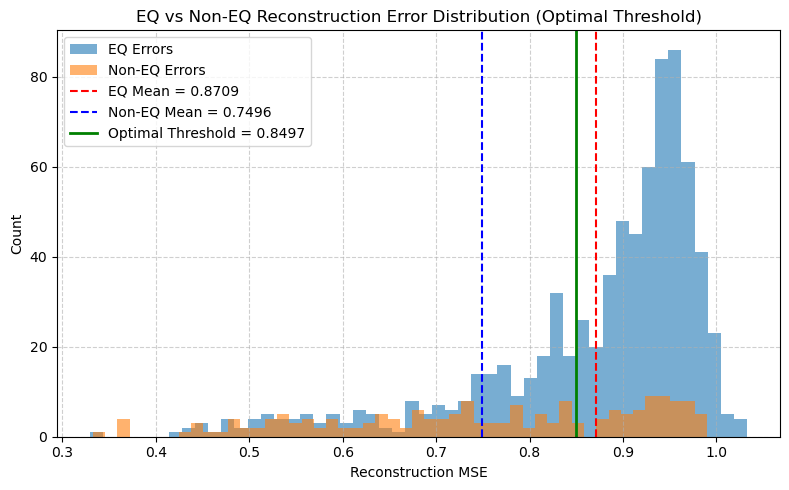

 Saved figure to: figures/EQ vs Non-EQ Reconstruction Error Distribution (Optimal Threshold).png


In [102]:
# Histogram
plt.figure(figsize=(8,5))
plt.hist(eq_errors_opt, bins=50, alpha=0.6, label="EQ Errors")
plt.hist(non_eq_errors_opt, bins=50, alpha=0.6, label="Non-EQ Errors")

# Mean Lines
plt.axvline(eq_errors_opt.mean(), color='r', linestyle='--', label=f"EQ Mean = {eq_errors_opt.mean():.4f}")
plt.axvline(non_eq_errors_opt.mean(), color='b', linestyle='--', label=f"Non-EQ Mean = {non_eq_errors_opt.mean():.4f}")

# Threshold line
plt.axvline(threshold, color='g', linestyle='-', linewidth=2, label=f"Optimal Threshold = {threshold:.4f}")

# Labels
plt.xlabel("Reconstruction MSE")
plt.ylabel("Count")
plt.title("EQ vs Non-EQ Reconstruction Error Distribution (Optimal Threshold)")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()

# save
save_and_show("EQ vs Non-EQ Reconstruction Error Distribution (Optimal Threshold).png")

##### Re_evaluate mean/std waveform plots using optimal thresold

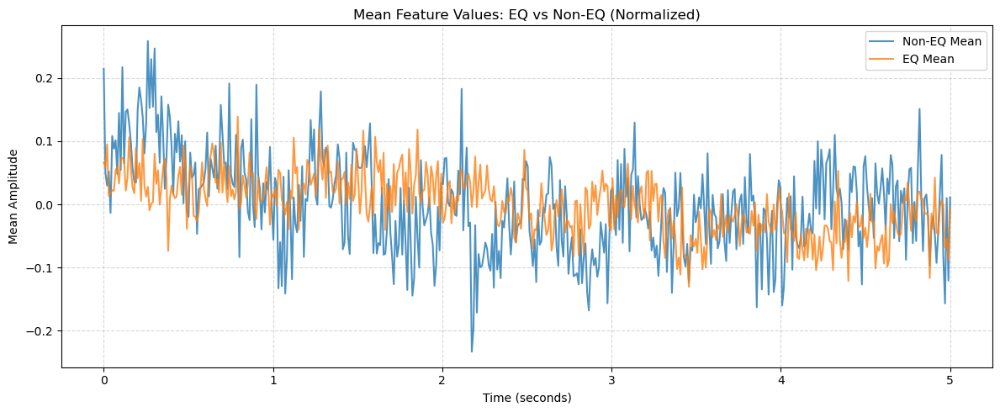

 Saved figure to: figures/Mean_Features_EQ_vs_NonEQ_optimal.png


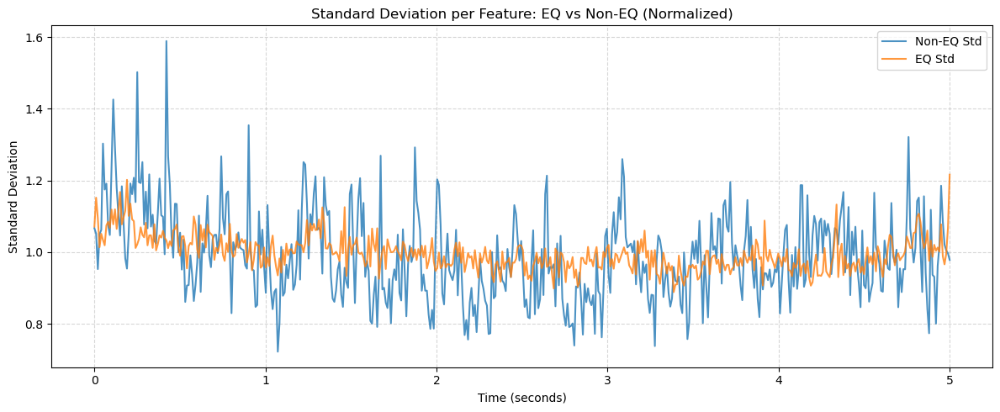

 Saved figure to: figures/STD_Features_EQ_vs_NonEQ_optimal.png


In [104]:
# Load back parameters
all_eq_segments_norm = np.load("all_eq_segments_norm.npy")   # EQ normalized waveforms
X_test = np.load("non_eq_X_test.npy")                        # saved Non-EQ test set

# Mean plot
plt.figure(figsize=(12,5))
plt.plot(time_axis, X_test.mean(axis=0), label="Non-EQ Mean", alpha=0.8)
plt.plot(time_axis, all_eq_segments_norm.mean(axis=0), label="EQ Mean", alpha=0.8)
plt.title("Mean Feature Values: EQ vs Non-EQ (Normalized)")
plt.xlabel("Time (seconds)"); plt.ylabel("Mean Amplitude")
plt.legend(); plt.grid(True, linestyle="--", alpha=0.5); plt.tight_layout()
save_and_show("Mean_Features_EQ_vs_NonEQ_optimal.png")

# Std plot
plt.figure(figsize=(12,5))
plt.plot(time_axis, X_test.std(axis=0), label="Non-EQ Std", alpha=0.8)
plt.plot(time_axis, all_eq_segments_norm.std(axis=0), label="EQ Std", alpha=0.8)
plt.title("Standard Deviation per Feature: EQ vs Non-EQ (Normalized)")
plt.xlabel("Time (seconds)"); plt.ylabel("Standard Deviation")
plt.legend(); plt.grid(True, linestyle="--", alpha=0.5); plt.tight_layout()
save_and_show("STD_Features_EQ_vs_NonEQ_optimal.png")

##### Print anomaly rate

In [107]:
eq_flags      = np.load("eq_anomaly_flags_optimal.npy")        # 1=anomaly
non_eq_flags  = np.load("non_eq_anomaly_flags_optimal.npy")    # 1=anomaly

eq_rate     = eq_flags.mean() * 100
noneq_rate  = non_eq_flags.mean() * 100

print("\n--- Detection Rates (Optimal Threshold) ---")
print(f"EQ anomaly rate:     {eq_rate:.2f}%  (n={len(eq_flags)})")
print(f"Non-EQ anomaly rate: {noneq_rate:.2f}%  (n={len(non_eq_flags)})")


--- Detection Rates (Optimal Threshold) ---
EQ anomaly rate:     70.57%  (n=768)
Non-EQ anomaly rate: 33.33%  (n=183)


##### Inspect high errors in EQ segments and low errors in Non-EQ test segment

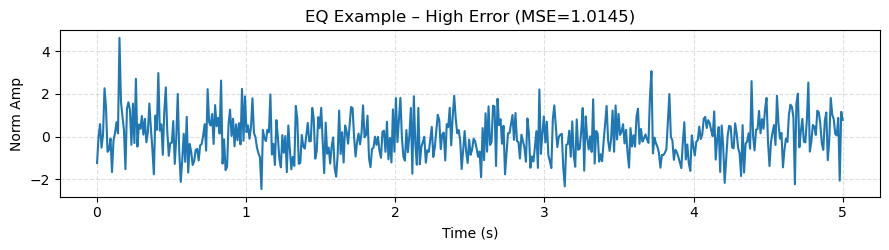

 Saved figure to: figures/EQ_Highest_Error_Opt.png


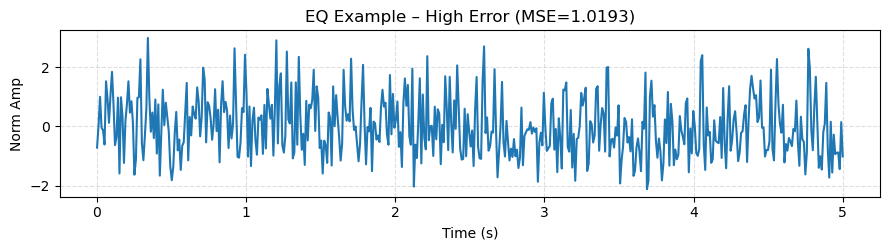

 Saved figure to: figures/EQ_Highest_Error_Opt.png


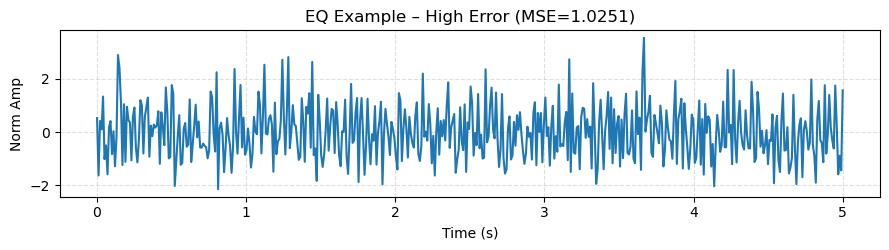

 Saved figure to: figures/EQ_Highest_Error_Opt.png


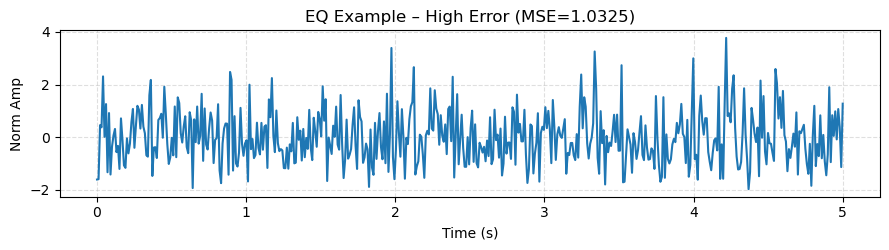

 Saved figure to: figures/EQ_Highest_Error_Opt.png


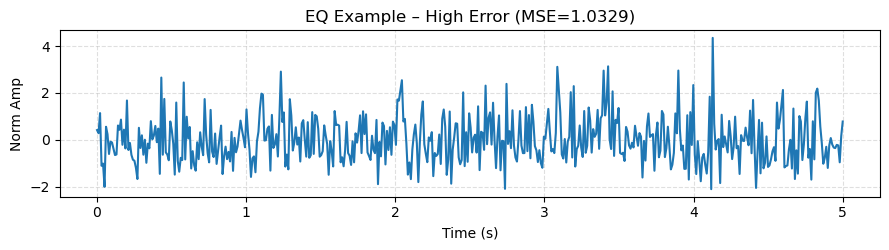

 Saved figure to: figures/EQ_Highest_Error_Opt.png


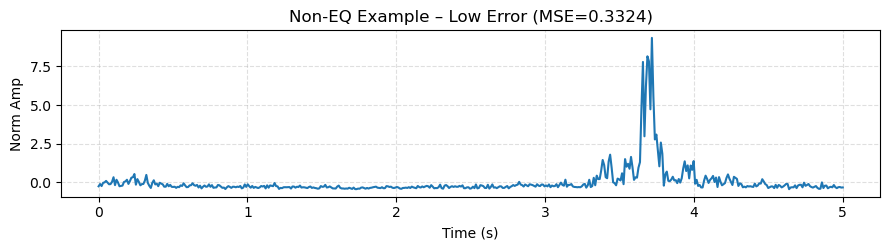

 Saved figure to: figures/Non_EQ_Highest_Error_Opt.png


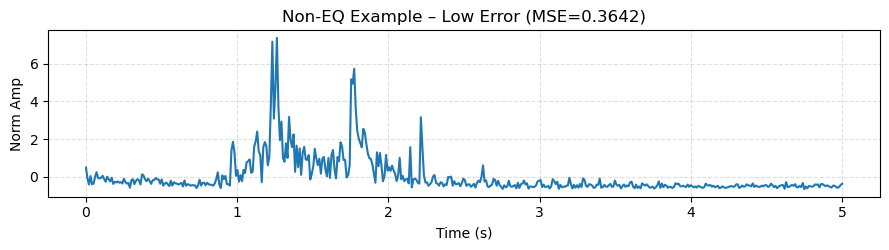

 Saved figure to: figures/Non_EQ_Highest_Error_Opt.png


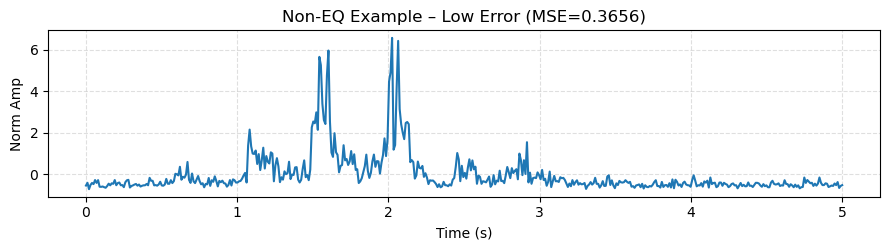

 Saved figure to: figures/Non_EQ_Highest_Error_Opt.png


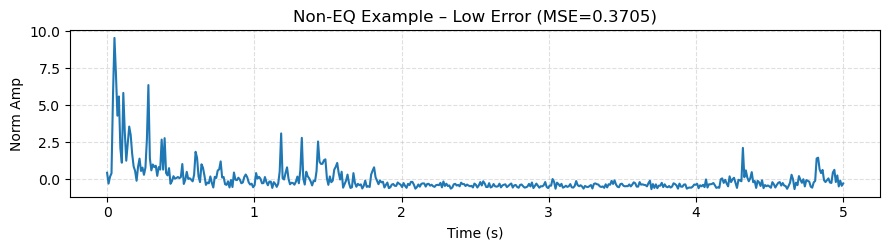

 Saved figure to: figures/Non_EQ_Highest_Error_Opt.png


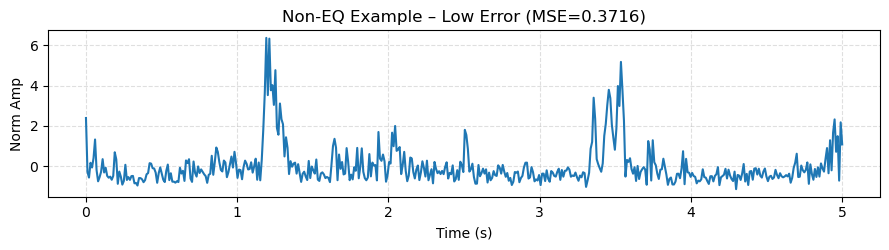

 Saved figure to: figures/Non_EQ_Highest_Error_Opt.png


In [110]:
# Show top-5 highest-error EQ segments
top_eq_idx = np.argsort(eq_errors_opt)[-5:]
for i in top_eq_idx:
    plt.figure(figsize=(9,2.6))
    plt.plot(time_axis, all_eq_segments_norm[i])
    plt.title(f"EQ Example – High Error (MSE={eq_errors_opt[i]:.4f})")
    plt.xlabel("Time (s)"); plt.ylabel("Norm Amp"); plt.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout(); save_and_show("EQ_Highest_Error_Opt.png")

# Show 5 lowest-error Non-EQ test segments
low_noneq_idx = np.argsort(non_eq_errors_opt)[:5]
for i in low_noneq_idx:
    plt.figure(figsize=(9,2.6))
    plt.plot(time_axis, X_test[i])
    plt.title(f"Non-EQ Example – Low Error (MSE={non_eq_errors_opt[i]:.4f})")
    plt.xlabel("Time (s)"); plt.ylabel("Norm Amp"); plt.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout(); save_and_show("Non_EQ_Highest_Error_Opt.png")

Optimal threshold detection revealed clear EQ vs Non-EQ differences, with higher EQ errors and improved event recall.

#### Evaluation of Autoencoder on Non-Earthquake Test Set (Clesn Data Only)

Evaluation on Non-EQ Test Set (Only Clean Data):
• Precision (Clean = 0): 1.0000
• Recall    (Clean = 0): 0.6667
• F1 Score  (Clean = 0): 0.8000


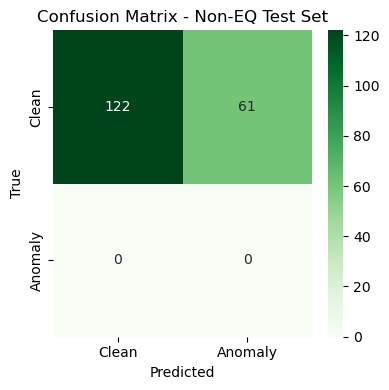

 Saved figure to: figures/Confusion_Matrix_clean_data.png


In [117]:
"""
This script evaluates the performance of the trained autoencoder on the Non-Earthquake (Non-EQ) test set.

Since all segments in this test set are 'clean' (i.e., not earthquake-related), we:
1. Assign dummy ground-truth labels of 0 to all samples.
2. Classify each sample as clean (0) or anomalous (1) using a fixed threshold.
3. Compute Precision, Recall, and F1-score for class 0 (clean).
4. Visualize the confusion matrix.

This helps assess whether the model mistakenly flags normal activity as an anomaly.
"""

# Load Non-EQ reconstruction errors
non_eq_errors_ = np.load("non_eq_errors_optimal.npy")

# Create dummy ground truth labels 
# All are non-earthquake, so ground-truth = 0
y_true = np.zeros_like(non_eq_errors_, dtype=int)

# Predict anomalies based on threshold
threshold = 0.8497
y_pred = (non_eq_errors_ > threshold).astype(int)  # 1 = anomaly, 0 = clean

# Compute evaluation metrics for class 0 
precision, recall, f1, _ = precision_recall_fscore_support(
    y_true, y_pred, average='binary', pos_label=0
)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

# Print results
print("Evaluation on Non-EQ Test Set (Only Clean Data):")
print(f"• Precision (Clean = 0): {precision:.4f}")
print(f"• Recall    (Clean = 0): {recall:.4f}")
print(f"• F1 Score  (Clean = 0): {f1:.4f}")


# Plot Confusion Matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens", xticklabels=["Clean", "Anomaly"], yticklabels=["Clean", "Anomaly"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix - Non-EQ Test Set")
plt.tight_layout()
save_and_show("Confusion_Matrix_clean_data.png")

Optimal threshold prioritised earthquake recall, yielding 100% precision but 33% false alarms on clean data.

### Train Classifier on Bottleneck Features 




#### Define Encoder from Trained Autoencoder

In [121]:
"""
Extract and save 64-dimensional bottleneck features
from the trained autoencoder for:
1. Non-EQ test set (X_test)
2. All EQ segments
"""

# Get encoder model (input to bottleneck layer)
encoder = Sequential(autoencoder_std.layers[:2])  # 500 - 128 - 64 up to bottleneck
encoder.build((None, 500))  # input shape = (batch, 500)

#### Save EQ Bottleneck Features 

In [123]:
"""
Save to eq_bottleneck_64.npy features
"""

# Path and EQ file bases 
base_dir = "segments_2500_std"
earthquake_bases = [
    "RE992_EQ_20240601T111409_10min",
    "RE992_EQ_20240814T022653_10min",
    "R5C62_EQ_trimmed_10min",
    "R77F9_EQ_trimmed_10min",
    "R853C_EQ_20240712T063946_10min",
    "R74A7_EQ_20220430T090645_10min",
    "R30A2_EQ_20250228T193324_10min",
    "R5156_EQ_20230222T060119_10min",
    "R47BB_EQ_20230722T164652_10min",
    "R5E3B_EQ_20250312T131039_10min"
]

# Collect files 
all_files = os.listdir(base_dir)
earthquake_files = []
for base in earthquake_bases:
    matches = [f for f in all_files if f.startswith(base) and f.endswith(".npy")]
    earthquake_files.extend(matches)

# Extract bottlenecks 
all_bottlenecks = []

for fname in sorted(earthquake_files):
    path = os.path.join(base_dir, fname)
    data = np.load(path).astype("float32")

    # Normalize per segment
    means = data.mean(axis=1, keepdims=True)
    stds = data.std(axis=1, keepdims=True) + 1e-8
    data_norm = (data - means) / stds

    # Get bottleneck
    bottlenecks = encoder.predict(data_norm)
    all_bottlenecks.append(bottlenecks)

# Save all
eq_bottlenecks = np.vstack(all_bottlenecks)
np.save("eq_bottleneck_64.npy", eq_bottlenecks)
print("Saved: eq_bottleneck_64.npy")
print("Shape:", eq_bottlenecks.shape)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━

#### Save Non-EQ Bottleneck Features from X_test

In [125]:
"""
Extract and save bottleneck features for the Non-EQ test set (X_test),
which was used in training/validation split of autoencoder.
"""

# Use the encoder 
non_eq_bottlenecks = encoder.predict(X_test)  # Shape: (183, 64)
np.save("non_eq_test_bottleneck_64.npy", non_eq_bottlenecks)
print(" Saved: non_eq_test_bottleneck_64.npy")
print("Shape:", non_eq_bottlenecks.shape)

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
 Saved: non_eq_test_bottleneck_64.npy
Shape: (183, 64)


Dataset shapes -> X:(951, 64), y: (951,)
Class counts -> Non-EQ: 183, EQ: 768
Train/Test -> X_train: (665, 64), X_test: (286, 64)
Train class counts -> Non-EQ:128,EQ:537
Testclass counts-> Non-EQ:55,EQ:231

 Classifier Performance on Test Set (Bottleneck Features):
• Accuracy : 0.8077
• Precision: 0.8077
 • Recall:  1.000000
• F1 Score : 0.8936
• ROC AUC : 0.6741


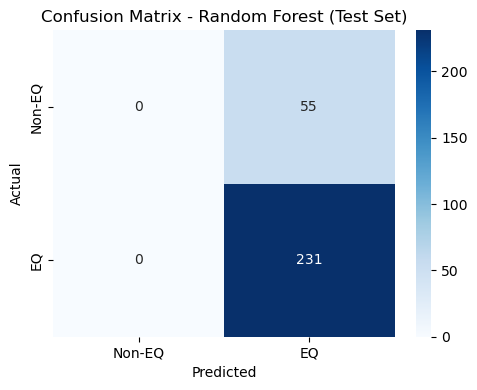

 Saved figure to: figures/Confusion_Matrix_RandForest1.png


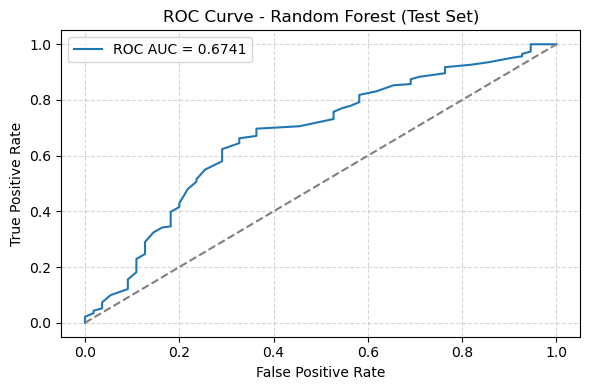

 Saved figure to: figures/ROC_RandomForest1.png


In [348]:
"""
This script trains and evaluate a Random Forest Classifier to differentiate between Earthquake (EQ) and Non-EQ
signals using 64-dimensional bottleneck features from a trained autoencoder, apply train-test split to avoid overfitting.
Steps:
1. Load full EQ bottleneck vectors (768, 64) and Non-EQ test set (183, 64) .
2. Combine and label the data (0 = Non-EQ, 1 = EQ) .
3. Split into training and test sets (stratified) to ensure equal class balance.
4. Train a Random Forest classifier.
5. Evaluate performance using common metrics and visualisations.

Goal:
Assess whether bottleneck features from the autoencoder can distinguish EQ vs Non-EQ patterns.
"""

from sklearn.ensemble import RandomForestClassifier

# Load saved bottleneck features
eq_bottlenecks = np.load ("eq_bottleneck_64.npy")# shape:(768,64) 
non_eq_bottlenecks = np.load ("non_eq_test_bottleneck_64.npy")  # shape: (183,64)

# Combine data and label: 0 = Non-EQ, 1 = EQ
X = np.vstack([non_eq_bottlenecks, eq_bottlenecks])
y = np.concatenate([np.zeros (len(non_eq_bottlenecks) ,dtype=int), np.ones (len(eq_bottlenecks), dtype=int) ])

print(f"Dataset shapes -> X:{X.shape}, y: {y.shape}")
print(f"Class counts -> Non-EQ: {np.sum(y==0)}, EQ: {np.sum (y==1)}")

# Split into train and test sets (stratified for class balance in the split)
X_trainn_, X_testt_, y_trainn_, y_ttest_ = train_test_split(X, y, test_size=0.3, stratify=y, random_state=7)

print(f"Train/Test -> X_train: {X_trainn_.shape}, X_test: {X_testt_.shape}")
print(f"Train class counts -> Non-EQ:{np.sum (y_trainn_==0)},EQ:{np.sum(y_trainn_==1)}")
print(f"Testclass counts-> Non-EQ:{np.sum (y_ttest_==0)},EQ:{np.sum (y_ttest_==1)}")


# Train the Random Forest classifier
clf = RandomForestClassifier(n_estimators=200,max_features="sqrt",class_weight="balanced", random_state=7, n_jobs=-1)
clf. fit(X_trainn_, y_trainn_)

# Predict and evaluate on test set only
y_pred_ = clf.predict (X_testt_)
y_proba_ = clf.predict_proba(X_testt_)[:, 1]

# Evaluation metrics
acc = accuracy_score (y_ttest_, y_pred_)
precision = precision_score(y_ttest_,y_pred_)
recall = recall_score(y_ttest_, y_pred_)
f1 = f1_score(y_ttest_, y_pred_)
roc_auc = roc_auc_score (y_ttest_, y_proba_)

print("\n Classifier Performance on Test Set (Bottleneck Features):")
print(f"• Accuracy : {acc:.4f}")
print(f"• Precision: {precision:.4f}")
print(f" • Recall: {recall: 4f}")
print(f"• F1 Score : {f1:.4f}")
print(f"• ROC AUC : {roc_auc:.4f}")


# Confusion Matrix
cm = confusion_matrix(y_ttest_, y_pred_)
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Non-EQ", "EQ"], yticklabels=["Non-EQ", "EQ"])
plt.title("Confusion Matrix - Random Forest (Test Set)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
save_and_show("Confusion_Matrix_RandForest1.png") 


# ROC Curve
fpr, tpr, _ = roc_curve(y_ttest_, y_proba_)
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, label=f"ROC AUC = {roc_auc:.4f}")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest (Test Set)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
save_and_show("ROC_RandomForest1.png")

### Split EQ into train and test set as well, so it's 

In [416]:
# Load ALL normalized EQ segments saved earlier
all_eq = np.load("all_eq_segments_norm.npy")  # shape (768, 500)

# Make an explicit EQ split (mirrors Non-EQ split)
eq_train, eq_test = train_test_split(all_eq, test_size=0.15, random_state=42)

np.save("eq_train.npy", eq_train)
np.save("eq_test.npy",  eq_test)

print("EQ train/test:", eq_train.shape, eq_test.shape)

EQ train/test: (652, 500) (116, 500)


#### Load autoencoder and data

In [418]:
from tensorflow.keras.models import load_model

ae = load_model("final_autoencoder_std.keras", compile=False)
print("Loaded AE.")

X_non_test = np.load("non_eq_X_test.npy")   # shape (≈183, 500)
eq_test    = np.load("eq_test.npy")         # shape (≈116, 500)

print("Shapes -> Non-EQ test:", X_non_test.shape, " | EQ test:", eq_test.shape)

Loaded AE.
Shapes -> Non-EQ test: (183, 500)  | EQ test: (116, 500)


#### Compute reconstruction error (view min nad max error)

In [423]:
# AE reconstructions
recon_non = ae.predict(X_non_test, verbose=0)
recon_eq  = ae.predict(eq_test,     verbose=0)

# Per-segment MSE 
err_non = ((X_non_test - recon_non)**2).mean(axis=1)
err_eq  = ((eq_test    - recon_eq )**2).mean(axis=1)

# Evaluation pool
errs_val = np.concatenate([err_non, err_eq])
y_val    = np.concatenate([np.zeros_like(err_non, dtype=int), np.ones_like(err_eq,  dtype=int)])

print(f"errors range: [{errs_val.min():.4f}, {errs_val.max():.4f}] "
      f"| Non-EQ n={len(err_non)}  EQ n={len(err_eq)}  total={len(errs_val)}")

errors range: [0.3324, 1.0044] | Non-EQ n=183  EQ n=116  total=299


#### Threshold sweep to select best threshold 

In [425]:
def metrics_at_tau(tau):
    y_pred = (errs_val >= tau).astype(int)   # error ≥ tau -> call it EQ
    p = precision_score(y_val, y_pred, zero_division=0)
    r = recall_score(y_val, y_pred,    zero_division=0)
    f = f1_score(y_val, y_pred,       zero_division=0)
    return p, r, f

taus = np.linspace(errs_val.min(), errs_val.max(), 41) 

rows = []
for t in taus:
    p, r, f = metrics_at_tau(t)
    rows.append((t, p, r, f))

df = pd.DataFrame(rows, columns=["Threshold", "Precision", "Recall", "F1"])
print(df.to_string(index=False, formatters={"Threshold":lambda v:f"{v:.4f}", "Precision":lambda v:f"{v:.3f}",
                               "Recall":lambda v:f"{v:.3f}", "F1":lambda v:f"{v:.3f}"}))

Threshold Precision Recall    F1
   0.3324     0.388  1.000 0.559
   0.3492     0.389  1.000 0.560
   0.3660     0.392  1.000 0.563
   0.3828     0.395  1.000 0.566
   0.3996     0.395  1.000 0.566
   0.4164     0.395  1.000 0.566
   0.4332     0.396  1.000 0.567
   0.4500     0.396  0.983 0.564
   0.4668     0.395  0.974 0.562
   0.4836     0.398  0.974 0.565
   0.5004     0.403  0.966 0.569
   0.5172     0.404  0.957 0.568
   0.5340     0.412  0.948 0.574
   0.5508     0.416  0.940 0.577
   0.5676     0.424  0.940 0.584
   0.5844     0.425  0.931 0.584
   0.6012     0.434  0.931 0.592
   0.6180     0.437  0.931 0.595
   0.6348     0.444  0.931 0.602
   0.6516     0.456  0.931 0.612
   0.6684     0.466  0.931 0.621
   0.6852     0.471  0.914 0.622
   0.7020     0.479  0.905 0.627
   0.7188     0.486  0.888 0.628
   0.7356     0.502  0.888 0.642
   0.7524     0.518  0.871 0.650
   0.7692     0.516  0.828 0.636
   0.7860     0.520  0.784 0.625
   0.8028     0.521  0.750 0.615
   0.8196 

##### Set threshold

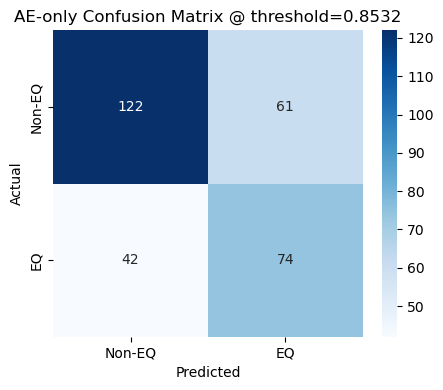

In [429]:
# set choice 
tau = 0.8532

y_pred = (errs_val >= tau).astype(int)
cm = confusion_matrix(y_val, y_pred)

plt.figure(figsize=(4.6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Non-EQ","EQ"], yticklabels=["Non-EQ","EQ"])
plt.title(f"AE-only Confusion Matrix @ threshold={tau:.4f}")
plt.xlabel("Predicted"); plt.ylabel("Actual")
plt.tight_layout(); plt.show()

##### Make 64-D EQ-TEST bottlenecks 

In [439]:
# Load trained AE and slice the encoder at the 64-D bottleneck
ae = load_model("final_autoencoder_std.keras", compile=False)
ae.summary()

inp = layers.Input(shape=(500,), name="enc_input_500")
h1  = ae.layers[0](inp)          # dense_64
z   = ae.layers[1](h1)           # dense_65  <-- bottleneck
encoder = Model(inp, z, name="encoder_from_finalae")

# Load already normalized EQ test set (116, 500)
eq_test = np.load("eq_test.npy").astype("float32")

# Extract 64-D features and save
eq_bott_test_64 = encoder.predict(eq_test, verbose=0)       # (116, 64)
np.save("eq_bott_test_64.npy", eq_bott_test_64)
print("Saved: eq_bott_test_64.npy", eq_bott_test_64.shape)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_64 (Dense)                │ (None, 128)            │        64,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 500)            │        64,500 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 145,204 (567.20 KB)

 Trainable params: 145,204 (567.20 KB)

 Non-trainable params: 0 (0.00 B)

Saved: eq_bott_test_64.npy (116, 64)


##### Train Random Forest again with this 64 bottlenecks of Eq and Non-Eq

Dataset shapes -> X: (299, 64), y: (299,)
Class counts -> Non-EQ: 183, EQ: 116
Train/Test -> X_train: (209, 64), X_test: (90, 64)
Train class counts -> Non-EQ: 128, EQ: 81
Test  class counts -> Non-EQ: 55,  EQ: 35

Classifier Performance on Test Set:
• Accuracy : 0.6444
• Precision: 0.6154
• Recall   : 0.2286
• F1 Score : 0.3333
• ROC AUC  : 0.7039


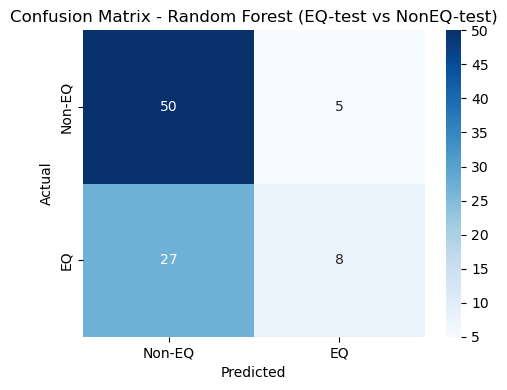

 Saved figure to: figures/Cm116.png


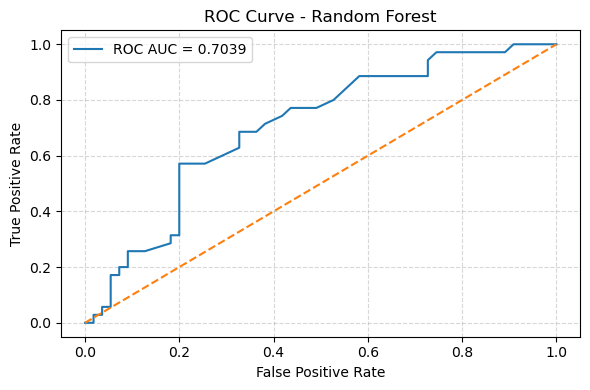

 Saved figure to: figures/ROC116.png


In [443]:
# Load bottlenecks
noneq_bott = np.load("non_eq_test_bottleneck_64.npy")  # (183, 64)
eq_bott    = np.load("eq_bott_test_64.npy")            # (116, 64)

# Build dataset 0 = Non-EQ, 1 = EQ
X_ = np.vstack([noneq_bott, eq_bott])
y_ = np.concatenate([np.zeros(len(noneq_bott), dtype=int), np.ones(len(eq_bott), dtype=int)])

print(f"Dataset shapes -> X: {X_.shape}, y: {y_.shape}")
print(f"Class counts -> Non-EQ: {(y_==0).sum()}, EQ: {(y_==1).sum()}")

# Train/test split (stratified)
X_tr, X_te, y_tr, y_te = train_test_split(X_, y_, test_size=0.3, stratify=y_, random_state=7)

print(f"Train/Test -> X_train: {X_tr.shape}, X_test: {X_te.shape}")
print(f"Train class counts -> Non-EQ: {(y_tr==0).sum()}, EQ: {(y_tr==1).sum()}")
print(f"Test  class counts -> Non-EQ: {(y_te==0).sum()},  EQ: {(y_te==1).sum()}")

# Train RF
clf_ = RandomForestClassifier(n_estimators=200, max_features="sqrt", class_weight="balanced", random_state=7, n_jobs=-1)
clf_.fit(X_tr, y_tr)

# Evaluate on test set
y_pred  = clf_.predict(X_te)
y_proba = clf_.predict_proba(X_te)[:, 1]

acc      = accuracy_score(y_te, y_pred)
precision= precision_score(y_te, y_pred)
recall   = recall_score(y_te, y_pred)
f1       = f1_score(y_te, y_pred)
roc_auc  = roc_auc_score(y_te, y_proba)

print("\nClassifier Performance on Test Set:")
print(f"• Accuracy : {acc:.4f}")
print(f"• Precision: {precision:.4f}")
print(f"• Recall   : {recall:.4f}")
print(f"• F1 Score : {f1:.4f}")
print(f"• ROC AUC  : {roc_auc:.4f}")

# Confusion Matrix
cm = confusion_matrix(y_te, y_pred)
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Non-EQ","EQ"], yticklabels=["Non-EQ","EQ"])
plt.title("Confusion Matrix - Random Forest (EQ-test vs NonEQ-test)")
plt.xlabel("Predicted"); plt.ylabel("Actual")
plt.tight_layout()
save_and_show("Cm116.png")

# ROC Curve
fpr, tpr, _ = roc_curve(y_te, y_proba)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, label=f"ROC AUC = {roc_auc:.4f}")
plt.plot([0,1],[0,1],'--')
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Random Forest")
plt.legend(); plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
save_and_show("ROC116.png")

##### Load and prepare encoder

In [447]:
# Load autoencoder 
ae = load_model("final_autoencoder_std.keras", compile=False)

# Slice out the 64-D bottleneck ("dense_65")
inp = layers.Input(shape=(500,), name="enc_input_500")
h1  = ae.layers[0](inp)   # dense_64
z   = ae.layers[1](h1)    # dense_65  <-- bottleneck (64)
encoder = Model(inp, z, name="encoder_from_finalae")
print("Encoder ready.")

Encoder ready.


##### Extract 64 bottleneck features of both Eq trainset and Non-Eq trainset

In [449]:
# Load already normalized TRAIN sets
non_eq_X_train = np.load("non_eq_X_train.npy").astype("float32")   # (729, 500)
eq_train       = np.load("eq_train.npy").astype("float32")         # (652, 500)

# Extract 64-D bottlenecks
non_eq_train_bott_64 = encoder.predict(non_eq_X_train, verbose=0)  # (729, 64)
eq_bott_train_64     = encoder.predict(eq_train,       verbose=0)  # (652, 64)

# Save
np.save("non_eq_train_bottleneck_64.npy", non_eq_train_bott_64)
np.save("eq_bott_train_64.npy",           eq_bott_train_64)

print("Saved:", "non_eq_train_bottleneck_64.npy", non_eq_train_bott_64.shape, "|",
      "eq_bott_train_64.npy",  eq_bott_train_64.shape)

Saved: non_eq_train_bottleneck_64.npy (729, 64) | eq_bott_train_64.npy (652, 64)


##### Train Rf again on both train and test bottleneck features of Eq and Non-Eq

TRAIN -> X:(1381, 64), y:(1381,) | Non-EQ:729 EQ:652
TEST  -> X:(299, 64),  y:(299,)  | Non-EQ:183  EQ:116

RF on AE bottlenecks — TEST performance:
• Accuracy : 0.6589
• Precision: 0.5486
• Recall   : 0.6810
• F1 Score : 0.6077
• ROC AUC  : 0.7055


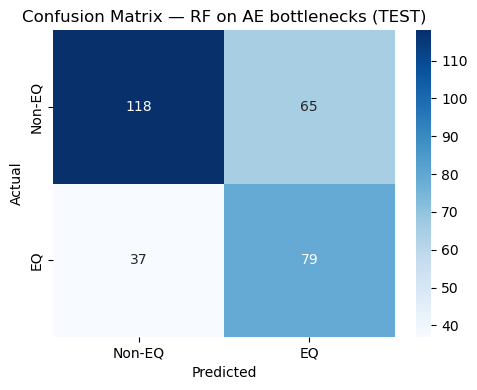

 Saved figure to: figures/CMTr_Te.png


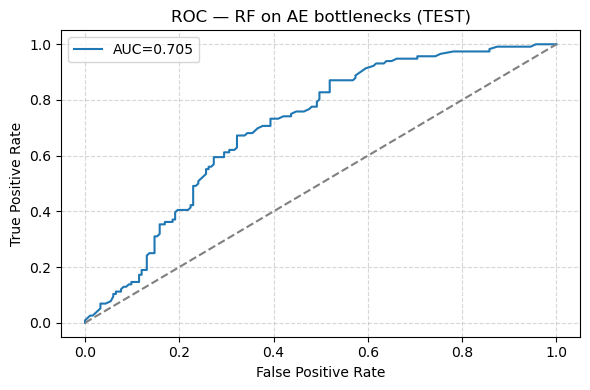

 Saved figure to: figures/ROCTR_Te.png


In [455]:
# Load TRAIN bottlenecks
noneq_tr = np.load("non_eq_train_bottleneck_64.npy")   # (729, 64)
eq_tr    = np.load("eq_bott_train_64.npy")            # (652, 64)

# Load TEST bottlenecks
noneq_te = np.load("non_eq_test_bottleneck_64.npy")   # (183, 64)
eq_te    = np.load("eq_bott_test_64.npy")             # (116, 64)

# Build labeled TRAIN/TEST sets (0= Non-EQ, 1 =EQ)
X_train = np.vstack([noneq_tr, eq_tr])
y_train = np.concatenate([np.zeros(len(noneq_tr), dtype=int), np.ones(len(eq_tr),    dtype=int)])

X_test  = np.vstack([noneq_te, eq_te])
y_test  = np.concatenate([np.zeros(len(noneq_te), dtype=int), np.ones(len(eq_te),     dtype=int)])

print(f"TRAIN -> X:{X_train.shape}, y:{y_train.shape} | Non-EQ:{(y_train==0).sum()} EQ:{(y_train==1).sum()}")
print(f"TEST  -> X:{X_test.shape},  y:{y_test.shape}  | Non-EQ:{(y_test==0).sum()}  EQ:{(y_test==1).sum()}")

# Train RF on TRAIN only, evaluate on TEST only
_clf = RandomForestClassifier( n_estimators=400, max_features="sqrt", class_weight="balanced", random_state=42, n_jobs=-1)
_clf.fit(X_train, y_train)

_y_pred  = _clf.predict(X_test)
_y_proba = _clf.predict_proba(X_test)[:, 1]

acc  = accuracy_score(y_test, _y_pred)
prec = precision_score(y_test, _y_pred)
rec  = recall_score(y_test, _y_pred)
f1   = f1_score(y_test, _y_pred)
auc  = roc_auc_score(y_test, _y_proba)

print("\nRF on AE bottlenecks — TEST performance:")
print(f"• Accuracy : {acc:.4f}")
print(f"• Precision: {prec:.4f}")
print(f"• Recall   : {rec:.4f}")
print(f"• F1 Score : {f1:.4f}")
print(f"• ROC AUC  : {auc:.4f}")

# Confusion matrix
cm = confusion_matrix(y_test, _y_pred)
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',xticklabels=["Non-EQ","EQ"], yticklabels=["Non-EQ","EQ"])
plt.title("Confusion Matrix — RF on AE bottlenecks (TEST)")
plt.xlabel("Predicted"); plt.ylabel("Actual")
plt.tight_layout()
save_and_show("CMTr_Te.png")

# ROC curve
fpr, tpr, _ = roc_curve(y_test, _y_proba)
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, label=f"AUC={auc:.3f}")
plt.plot([0,1],[0,1],'--', color='gray')
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.title("ROC — RF on AE bottlenecks (TEST)")
plt.legend(); plt.grid(True, ls='--', alpha=0.5)
plt.tight_layout()
save_and_show("ROCTR_Te.png")

In [529]:
import joblib

# Save model
joblib.dump(_clf, "rf_model.pkl")
print("Saved full RF model → rf_model.pkl")

Saved full RF model → rf_model.pkl


#### t-SNE Visualization of Bottleneck Features (EQ vs Non-EQ) 

t-SNE input: (1680, 64) | Non-EQ: 912  EQ: 768
Running t-SNE (perplexity=5, lr=200) ...


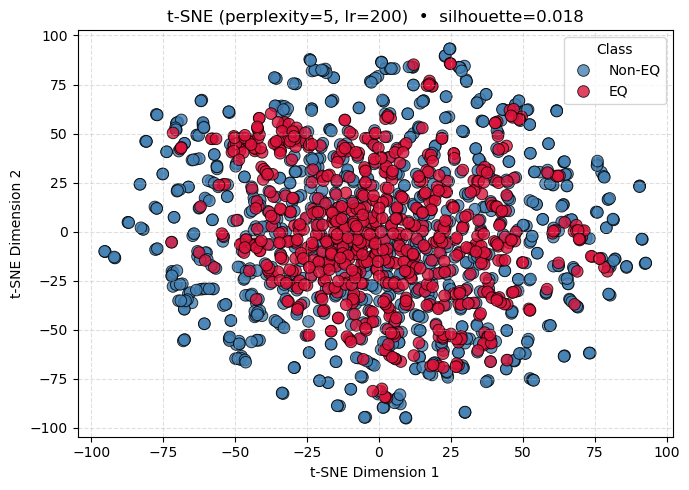

 Saved figure to: figures/tsne_perplexity_5_lr200.png
Running t-SNE (perplexity=10, lr=200) ...


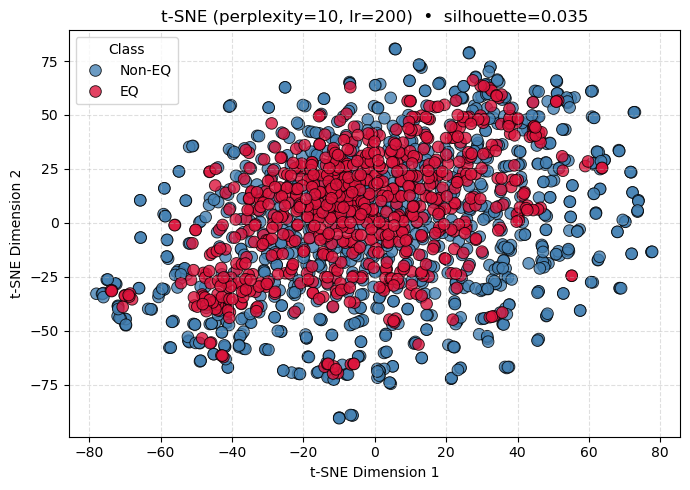

 Saved figure to: figures/tsne_perplexity_10_lr200.png
Running t-SNE (perplexity=15, lr=200) ...


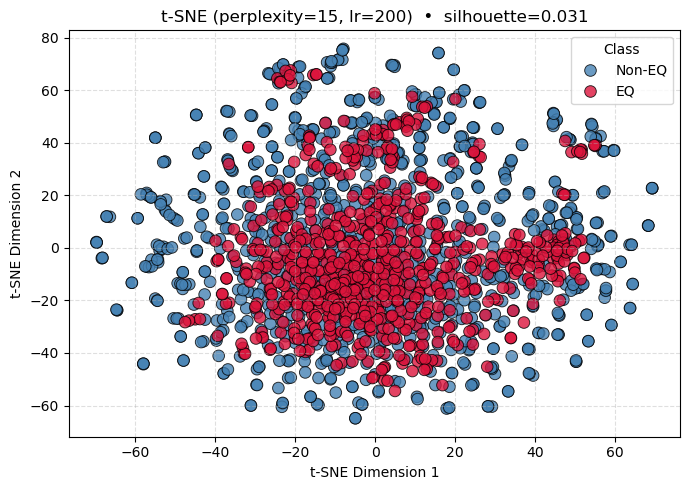

 Saved figure to: figures/tsne_perplexity_15_lr200.png
Running t-SNE (perplexity=30, lr=200) ...


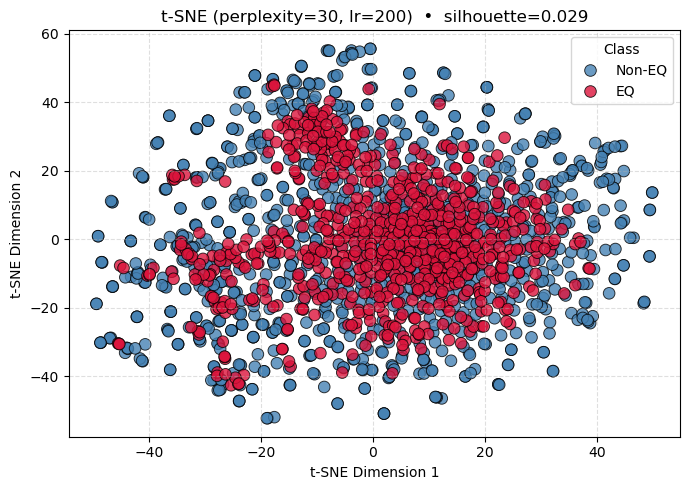

 Saved figure to: figures/tsne_perplexity_30_lr200.png
Running t-SNE (perplexity=40, lr=200) ...


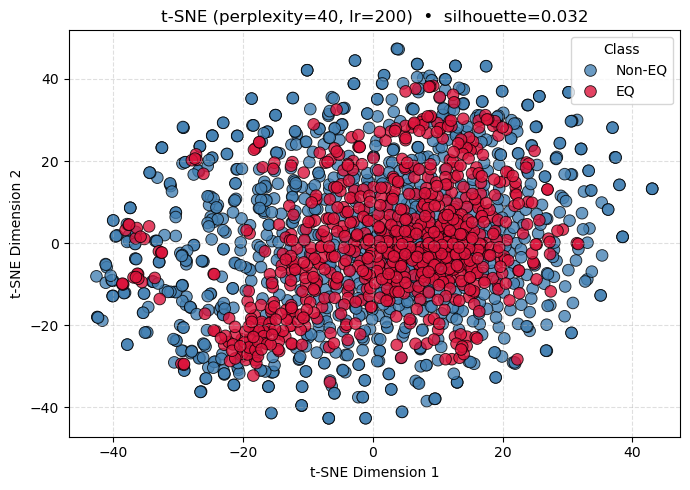

 Saved figure to: figures/tsne_perplexity_40_lr200.png
Running t-SNE (perplexity=50, lr=200) ...


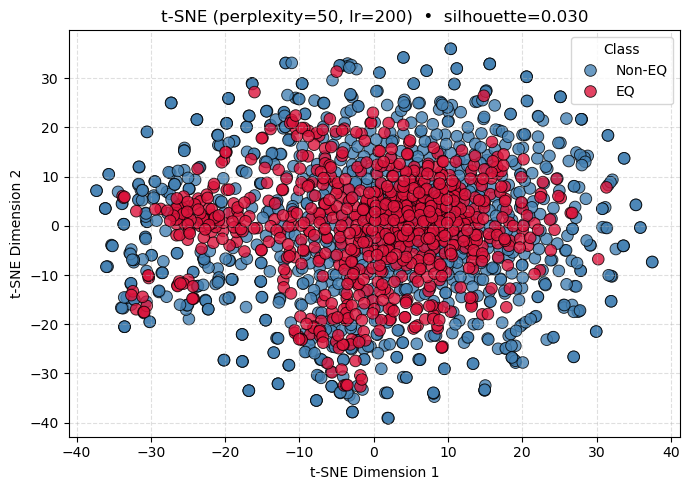

 Saved figure to: figures/tsne_perplexity_50_lr200.png

Silhouette summary:
 Perplexity  Silhouette
          5      0.0175
         10      0.0347
         15      0.0314
         30      0.0286
         40      0.0322
         50      0.0295


/var/folders/16/26q27jps42b4fpx1_sg178840000gn/T/ipykernel_65266/217297629.py:77: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_tsne, x="Perplexity", y="Silhouette", palette="viridis")


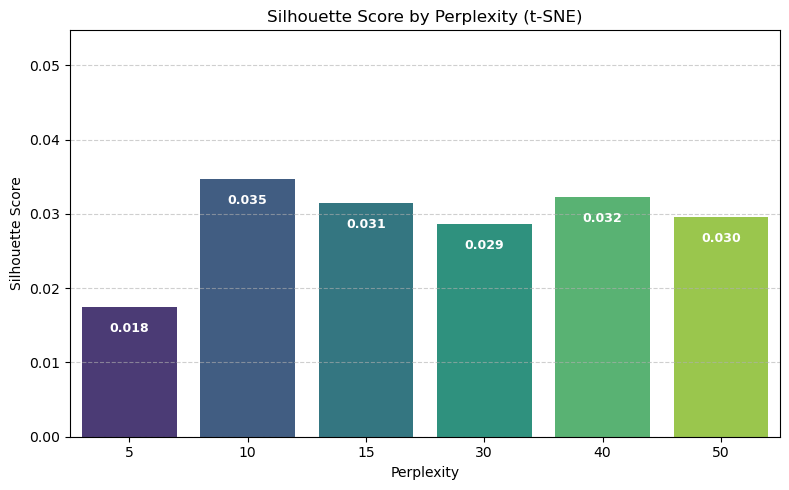

 Saved figure to: figures/tsne_perplexity_silhouette_scores.png


In [476]:
"""
t-SNE sweep over perplexity with silhouette scores (EQ vs Non-EQ)

Inputs (64-D bottlenecks from the final AE encoder):
- non_eq_train_bottleneck_64.npy   (729, 64)
- eq_bott_train_64.npy             (652, 64)
- non_eq_test_bottleneck_64.npy    (183, 64)
- eq_bott_test_64.npy              (116, 64)

Outputs:
- One scatter plot per perplexity with silhouette in the title
- A pandas dataframe + bar chart: perplexity → silhouette score
"""

from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

# Load bottlenecks
noneq_bott_train = np.load("non_eq_train_bottleneck_64.npy")   # (729, 64)
eq_bott_train    = np.load("eq_bott_train_64.npy")              # (652, 64)
noneq_bott_test  = np.load("non_eq_test_bottleneck_64.npy")     # (183, 64)
eq_bott_test     = np.load("eq_bott_test_64.npy")               # (116, 64)

# Use ALL (train + test) so we see the full structure
X = np.vstack([noneq_bott_train, noneq_bott_test, eq_bott_train, eq_bott_test]).astype("float32")
y = np.array([0]*len(noneq_bott_train) + [0]*len(noneq_bott_test) +
             [1]*len(eq_bott_train)    + [1]*len(eq_bott_test))

print("t-SNE input:", X.shape, "| Non-EQ:", (y==0).sum(), " EQ:", (y==1).sum())

# Feature whitening (standardize each dim) 
WHITEN = True
if WHITEN:
    X = (X - X.mean(axis=0, keepdims=True)) / (X.std(axis=0, keepdims=True) + 1e-8)

# Light PCA before t-SNE
use_pca = True
if use_pca:
    pca = PCA(n_components=20, random_state=42)
    X_in = pca.fit_transform(X)
else:
    X_in = X

# Sweep t-SNE perplexities 
perplexities = [5, 10, 15, 30, 40, 50]
lr = 200
results = []

for p in perplexities:
    print(f"Running t-SNE (perplexity={p}, lr={lr}) ...")
    tsne = TSNE(n_components=2, perplexity=p, learning_rate=lr, init="pca", random_state=42)
    X_tsne = tsne.fit_transform(X)

    # Silhouette on the 2D embedding
    sil = silhouette_score(X_tsne, y, metric="euclidean")
    results.append((p, sil))

    # Plot
    labels = np.where(y == 0, "Non-EQ", "EQ")
    plt.figure(figsize=(7, 5))
    sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1],
                    hue=labels, palette={"Non-EQ": "steelblue", "EQ": "crimson"},
                    edgecolor="black", alpha=0.8, s=70)
    plt.title(f"t-SNE (perplexity={p}, lr={lr})  •  silhouette={sil:.3f}")
    plt.xlabel("t-SNE Dimension 1"); plt.ylabel("t-SNE Dimension 2")
    plt.legend(title="Class"); plt.grid(True, linestyle='--', alpha=0.4)
    plt.tight_layout()
    save_and_show(f"tsne_perplexity_{p}_lr{lr}.png")

# Summary table + bar chart 
df_tsne = pd.DataFrame(results, columns=["Perplexity", "Silhouette"])
print("\nSilhouette summary:")
print(df_tsne.round(4).to_string(index=False))

plt.figure(figsize=(8, 5))
sns.barplot(data=df_tsne, x="Perplexity", y="Silhouette", palette="viridis")
plt.title("Silhouette Score by Perplexity (t-SNE)")
plt.xlabel("Perplexity")
plt.ylabel("Silhouette Score")
plt.ylim(0, df_tsne["Silhouette"].max() + 0.02)
plt.grid(axis='y', linestyle='--', alpha=0.6)
# Add labels on bars
for i, v in enumerate(df_tsne["Silhouette"]):
    plt.text(i, v - 0.002, f"{v:.3f}", ha='center', va='top', fontsize=9, color="white", fontweight="bold")
plt.tight_layout()
save_and_show("tsne_perplexity_silhouette_scores.png")

##### t-SNE Visualization of Bottleneck Features

The Plot above is a 2D t-SNE embedding of the 64-dimensional bottleneck output from the trained autoencoder. Each point represents a seismic segment, which is coloure coded by its true class, (EQ) or Non-EQ.

The t-SNE is a non-linear dimensionality reduction algorithm that is locally structure preserving, so nearby points in 64D are likely to be nearby in 2D. If the autoencoder had learned structure-relevant seismic activity in its bottleneck, then we would expect to see some level of separation between EQ and Non-EQ clusters.

##### Observations:
There is no clear clustering between EQ and Non-EQ, With low sil_score

##### Using UMAP on 64 bottleneck features

/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


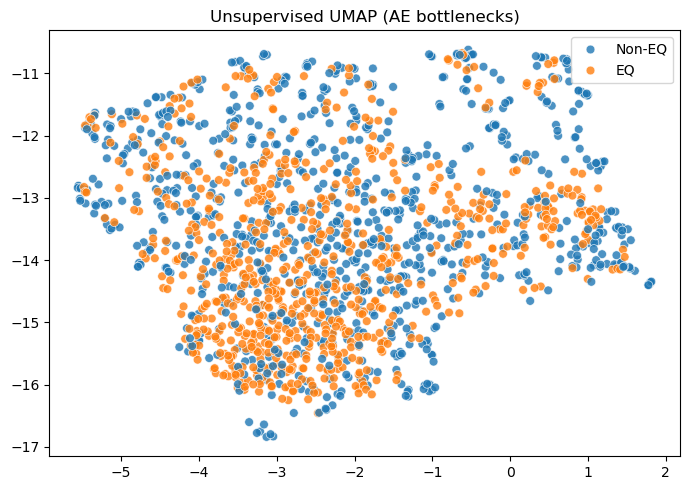

 Saved figure to: figures/Unsupervised silhouette (all).png
Unsupervised silhouette (all): 0.023999985307455063


/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


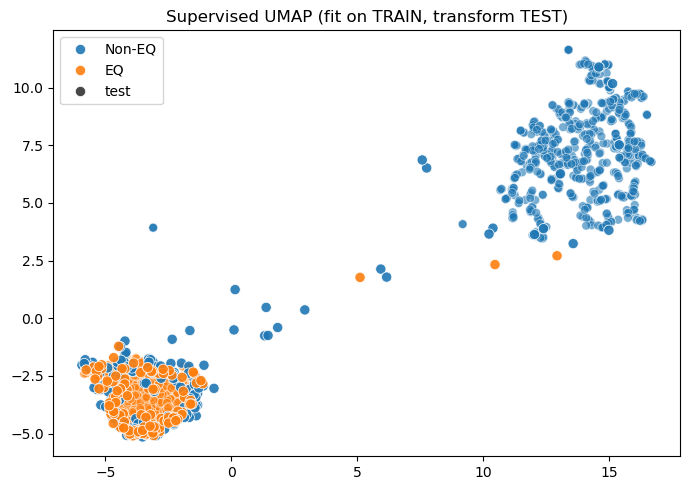

 Saved figure to: figures/Supervised UMAP silhouette on TEST only.png
Supervised UMAP silhouette on TEST only: -0.04150145500898361


In [484]:
import numpy as np, umap.umap_ as umap
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# Load AE bottlenecks 
non_eq_tr = np.load("non_eq_train_bottleneck_64.npy")   # (729, 64)
eq_tr     = np.load("eq_bott_train_64.npy")             # (652, 64)
non_eq_te = np.load("non_eq_test_bottleneck_64.npy")    # (183, 64)
eq_te     = np.load("eq_bott_test_64.npy")              # (116, 64)

X_train = np.vstack([non_eq_tr, eq_tr])
y_train = np.r_[np.zeros(len(non_eq_tr), dtype=int), np.ones(len(eq_tr), dtype=int)]

X_test  = np.vstack([non_eq_te, eq_te])
y_test  = np.r_[np.zeros(len(non_eq_te), dtype=int), np.ones(len(eq_te), dtype=int)]

# whiten each feature
scaler = StandardScaler().fit(X_train)
Xtr = scaler.transform(X_train)
Xte = scaler.transform(X_test)

# UNSUPERVISED UMAP on ALL (for honesty check)
unsup = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
Z_unsup = unsup.fit_transform(np.vstack([Xtr, Xte]))
y_all = np.r_[y_train, y_test]
labels_all = np.where(y_all==0, "Non-EQ", "EQ")
plt.figure(figsize=(7,5))
sns.scatterplot(x=Z_unsup[:,0], y=Z_unsup[:,1], hue=labels_all, s=40, alpha=0.8)
plt.title("Unsupervised UMAP (AE bottlenecks)")
plt.tight_layout()
save_and_show("Unsupervised silhouette (all).png")
print("Unsupervised silhouette (all):", silhouette_score(Z_unsup, y_all))

# SUPERVISED UMAP fit on TRAIN, transform TEST 
sup = umap.UMAP(n_neighbors=15, min_dist=0.05, random_state=42)
Ztr = sup.fit_transform(Xtr, y=y_train)   # supervised fit on TRAIN only
Zte = sup.transform(Xte)                  # transform TEST with learned embedding

# Plot: mark train vs test so see generalization
plt.figure(figsize=(7,5))
sns.scatterplot(x=Ztr[:,0], y=Ztr[:,1], hue=np.where(y_train==0,"Non-EQ","EQ"),
                style=["train"]*len(Ztr), s=40, alpha=0.6, legend=False)
sns.scatterplot(x=Zte[:,0], y=Zte[:,1], hue=np.where(y_test==0,"Non-EQ","EQ"),
                style=["test"]*len(Zte), s=55, alpha=0.9)
plt.title("Supervised UMAP (fit on TRAIN, transform TEST)")
plt.tight_layout()
save_and_show("Supervised UMAP silhouette on TEST only.png")

print("Supervised UMAP silhouette on TEST only:",
      silhouette_score(Zte, y_test))

#### Visualise Mean Feature Difference in Bottleneck

In [486]:
# load saved bottlenecks 
non_eq_tr = np.load("non_eq_train_bottleneck_64.npy")   # (729, 64)
eq_tr     = np.load("eq_bott_train_64.npy")             # (652, 64)
non_eq_te = np.load("non_eq_test_bottleneck_64.npy")    # (183, 64)
eq_te     = np.load("eq_bott_test_64.npy")              # (116, 64)

# ALL data (train+test)
_X_all = np.vstack([non_eq_tr, non_eq_te, eq_tr, eq_te]).astype("float32")
_y_all = np.r_[np.zeros(len(non_eq_tr)+len(non_eq_te), dtype=int),
              np.ones (len(eq_tr)+len(eq_te),         dtype=int)]

print("ALL   -> X_all:", _X_all.shape, "| Non-EQ:", (y_all==0).sum(), " EQ:", (_y_all==1).sum())

# TEST-only (for honest comparisons) 
_X_test = np.vstack([non_eq_te, eq_te]).astype("float32")
_y_test = np.r_[np.zeros(len(non_eq_te), dtype=int), np.ones(len(eq_te), dtype=int)]

print("TEST  -> X_test:", _X_test.shape, "| Non-EQ:", (_y_test==0).sum(), " EQ:", (_y_test==1).sum())

ALL   -> X_all: (1680, 64) | Non-EQ: 912  EQ: 768
TEST  -> X_test: (299, 64) | Non-EQ: 183  EQ: 116


In [495]:
_X = _X_all
_y = _y_all

/var/folders/16/26q27jps42b4fpx1_sg178840000gn/T/ipykernel_65266/3133887294.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_diff, x="Feature", y="Difference", palette="coolwarm")


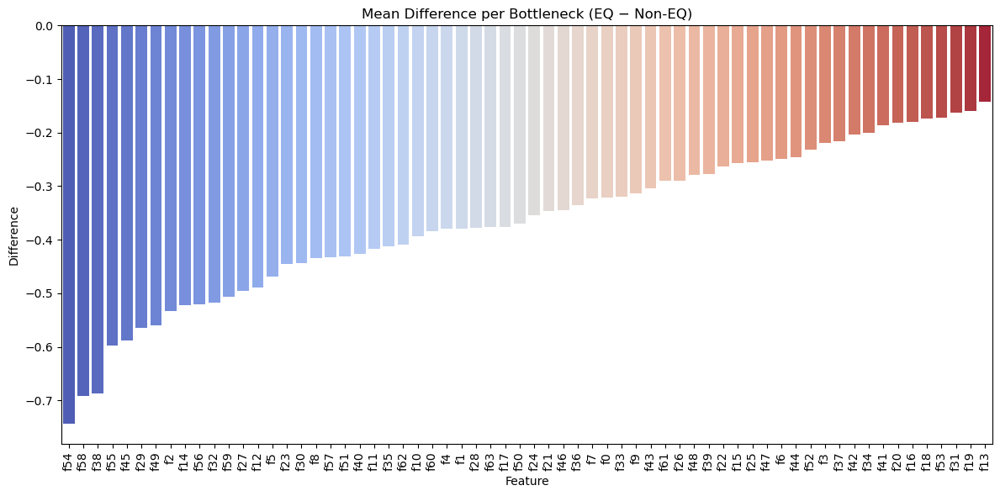

 Saved figure to: figures/Mean Difference per Bottleneck (EQ − Non-EQ).png


/var/folders/16/26q27jps42b4fpx1_sg178840000gn/T/ipykernel_65266/3133887294.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=_y, y=_X[:, j], palette=["steelblue","crimson"])
/var/folders/16/26q27jps42b4fpx1_sg178840000gn/T/ipykernel_65266/3133887294.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=_y, y=_X[:, j], palette=["steelblue","crimson"])
/var/folders/16/26q27jps42b4fpx1_sg178840000gn/T/ipykernel_65266/3133887294.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=_y, y=_X[:, j], palette=["steelblue","crimson"])
/var/fo

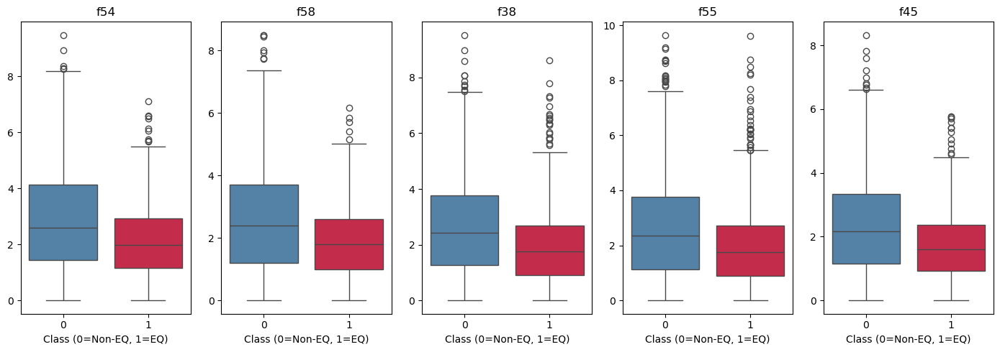

 Saved figure to: figures/Mean Difference Boxplot (EQ − Non-EQ).png


In [501]:
# 0 = Non-EQ, 1 = EQ
mean_eq    = _X[_y==1].mean(axis=0)      # shape (64,)
mean_noneq = _X[_y==0].mean(axis=0)      # shape (64,)
diff       = mean_eq - mean_noneq      # EQ - NonEQ for each bottleneck dim

df_diff = pd.DataFrame({
    "Feature": [f"f{i}" for i in range(_X.shape[1])],
    "Mean_EQ": mean_eq,
    "Mean_NonEQ": mean_noneq,
    "Difference": diff
}).sort_values("Difference", key=lambda s: s.abs(), ascending=False)

# bar chart of differences (sorted by |difference|)
plt.figure(figsize=(12,6))
sns.barplot(data=df_diff, x="Feature", y="Difference", palette="coolwarm")
plt.xticks(rotation=90)
plt.title("Mean Difference per Bottleneck (EQ − Non-EQ)")
plt.tight_layout()
save_and_show("Mean Difference per Bottleneck (EQ − Non-EQ).png")

# boxplots for the top 5 most different features
top5_idx = [int(f[1:]) for f in df_diff["Feature"].head(5)]
plt.figure(figsize=(14,5))
for i, j in enumerate(top5_idx, 1):
    plt.subplot(1,5,i)
    sns.boxplot(x=_y, y=_X[:, j], palette=["steelblue","crimson"])
    plt.xlabel("Class (0=Non-EQ, 1=EQ)")
    plt.title(f"f{j}")
plt.tight_layout()
save_and_show("Mean Difference Boxplot (EQ − Non-EQ).png")

/var/folders/16/26q27jps42b4fpx1_sg178840000gn/T/ipykernel_65266/1554197375.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=_y, y=_X[:, j], palette=["steelblue","crimson"])
/var/folders/16/26q27jps42b4fpx1_sg178840000gn/T/ipykernel_65266/1554197375.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=_y, y=_X[:, j], palette=["steelblue","crimson"])
/var/folders/16/26q27jps42b4fpx1_sg178840000gn/T/ipykernel_65266/1554197375.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=_y, y=_X[:, j], palette=["steelblue","crimson"])
/var/fo

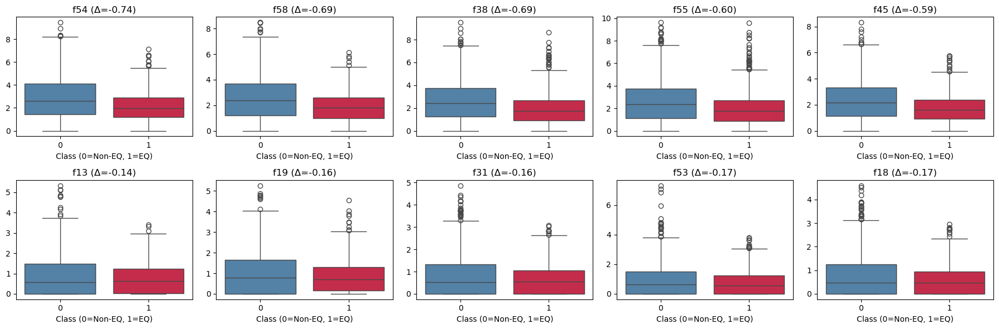

 Saved figure to: figures/Top5 EQ vs NOn-EQ Differences.png


In [503]:
# Top 5 where Non-EQ > EQ (negative differences)
top5_noneq = df_diff.nsmallest(5, "Difference")

# Top 5 where EQ > Non-EQ (positive differences)
top5_eq = df_diff.nlargest(5, "Difference")

# Combine into one DataFrame for plotting
selected = pd.concat([top5_noneq, top5_eq])

plt.figure(figsize=(18, 6))
for i, row in enumerate(selected.itertuples(), 1):
    f = row.Feature          
    j = int(f[1:])            
    delta = row.Difference    # mean difference for this feature
    plt.subplot(2, 5, i)
    sns.boxplot(x=_y, y=_X[:, j], palette=["steelblue","crimson"])
    plt.xlabel("Class (0=Non-EQ, 1=EQ)")
    plt.title(f"{f} (Δ={delta:.2f})")
plt.tight_layout()
save_and_show("Top5 EQ vs NOn-EQ Differences.png")

Box plot to show distribution between both classes

#### Visualize Feature Importances from Random Forest Classifier 


Top 20 RF feature importances:
Feature  Importance
    f54    0.037270
    f56    0.033017
    f40    0.032787
    f58    0.028039
    f45    0.024199
    f30    0.023309
     f8    0.023091
    f29    0.022979
    f24    0.022825
    f32    0.021694
    f59    0.021576
     f4    0.021019
     f2    0.020936
    f21    0.020792
    f10    0.019917
    f57    0.019764
     f5    0.019365
    f38    0.018882
    f15    0.018578
    f17    0.018173


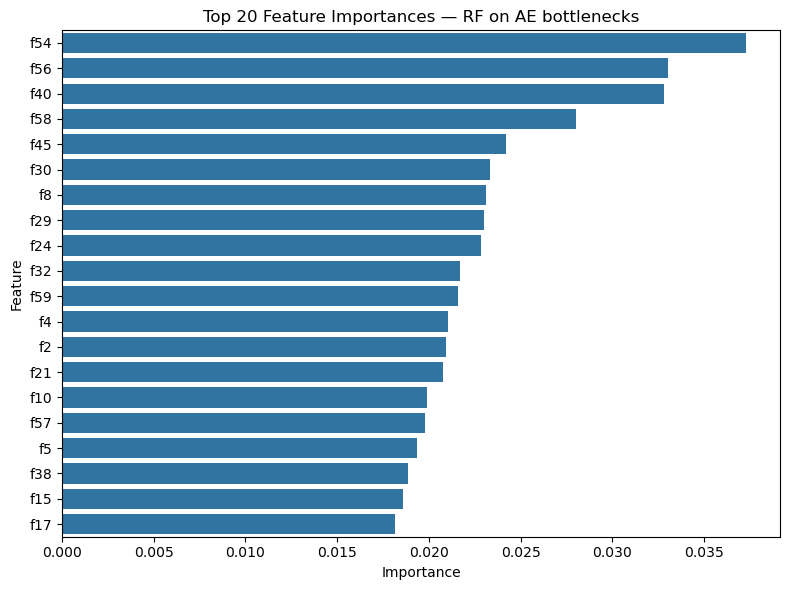

 Saved figure to: figures/rf_feature_importances_top20.png


In [506]:
# Grab importances from trained RF
importances = _clf.feature_importances_    
feat_names  = [f"f{i}" for i in range(X_train.shape[1])]

# Make a sorted DataFrame
df_imp = pd.DataFrame({"Feature": feat_names, "Importance": importances})
df_imp = df_imp.sort_values("Importance", ascending=False).reset_index(drop=True)

# Print the top 20 in a neat table
print("\nTop 20 RF feature importances:")
print(df_imp.head(20).to_string(index=False))

# Plot the top 20 as a horizontal bar chart
topN = 20
plt.figure(figsize=(8, 6))
sns.barplot(data=df_imp.head(topN), x="Importance", y="Feature", orient="h")
plt.title("Top 20 Feature Importances — RF on AE bottlenecks")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.tight_layout()
save_and_show("rf_feature_importances_top20.png")

##### Mean-difference ranking vs RF-importance ranking in a single comparison plot

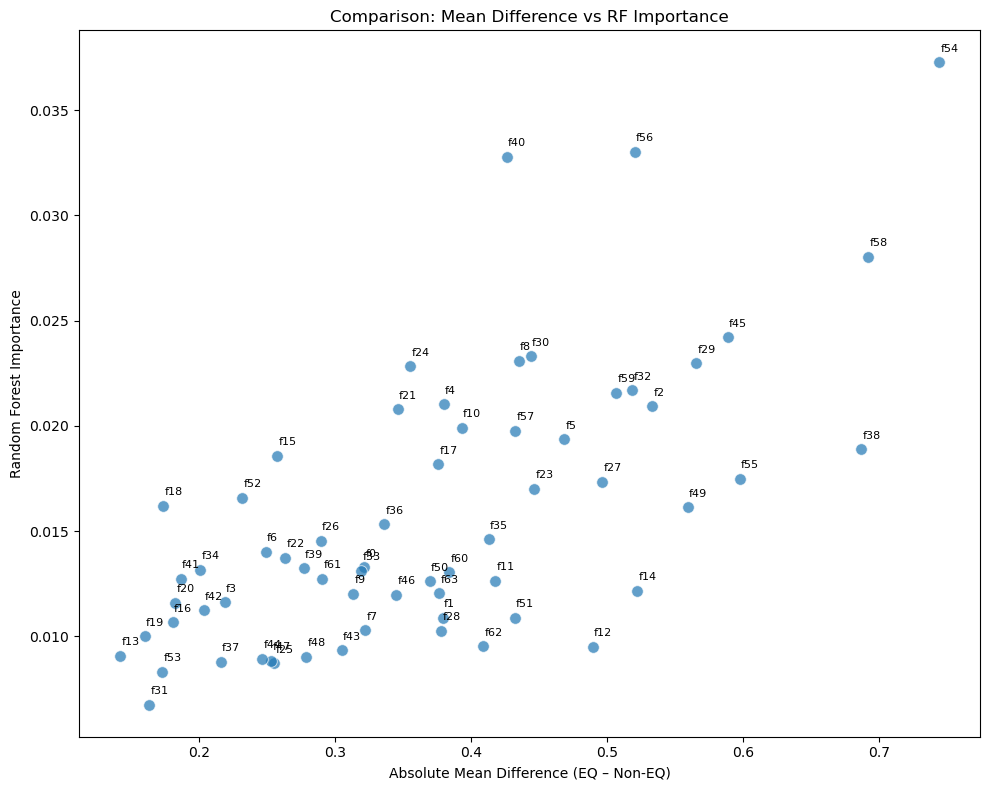

In [509]:
# Merge Mean Difference and RF Importance
df_compare = df_diff.merge(df_imp, on="Feature")  
df_compare["AbsDifference"] = df_compare["Difference"].abs()

# Scatter Plot 
plt.figure(figsize=(10,8))
sns.scatterplot(
    data=df_compare, 
    x="AbsDifference", 
    y="Importance", 
    s=70, alpha=0.7
)

# Add text labels for all features
for _, row in df_compare.iterrows():
    plt.text(row["AbsDifference"]+0.001, row["Importance"]+0.0005, row["Feature"],
             fontsize=8)

plt.title("Comparison: Mean Difference vs RF Importance")
plt.xlabel("Absolute Mean Difference (EQ – Non-EQ)")
plt.ylabel("Random Forest Importance")
plt.tight_layout()
plt.show()

##### Highlighting colour code

Pearson r = 0.668  (p=1.62e-09)
Spearman r = 0.645 (p=8.61e-09)


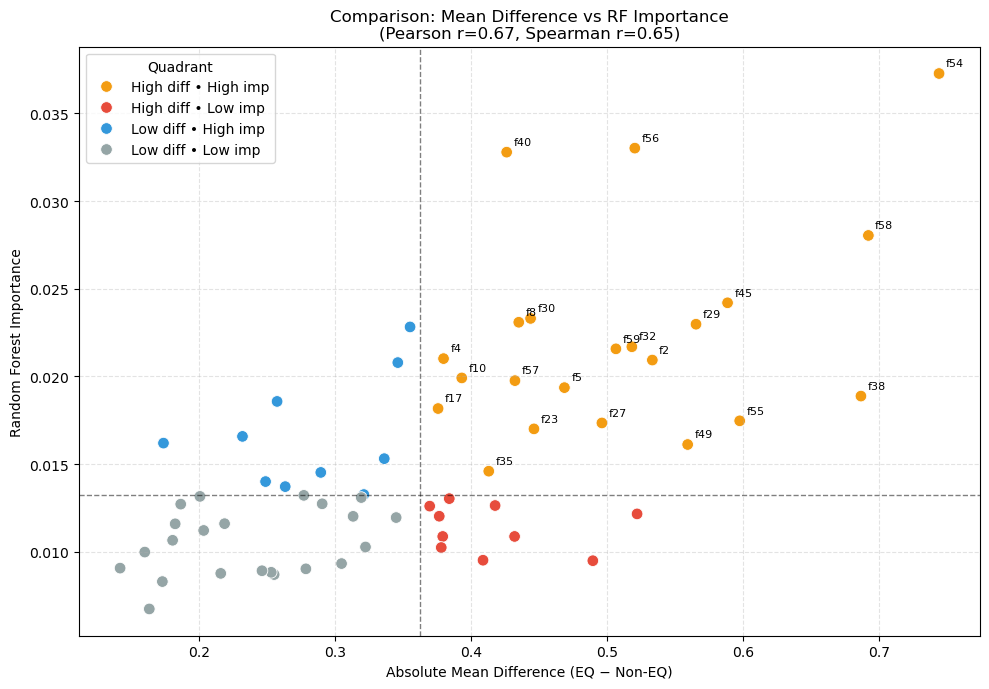

 Saved figure to: figures/diff_vs_importance_quadrants.png


In [517]:
from scipy.stats import pearsonr, spearmanr

# Ensure we have absolute differences and importances in one table
df_diff = df_diff.copy()
df_diff["AbsDiff"] = df_diff["Difference"].abs()

df_join = (df_diff[["Feature","AbsDiff"]]
           .merge(df_imp[["Feature","Importance"]], on="Feature", how="inner"))

# Define quadrant thresholds (medians keep things robust)
x_thr = df_join["AbsDiff"].median()
y_thr = df_join["Importance"].median()

def cat_row(r):
    if r["AbsDiff"] >= x_thr and r["Importance"] >= y_thr:
        return "High diff • High imp"      # GOLD
    elif r["AbsDiff"] >= x_thr and r["Importance"] < y_thr:
        return "High diff • Low imp"       # STAT-ONLY
    elif r["AbsDiff"] < x_thr and r["Importance"] >= y_thr:
        return "Low diff • High imp"       # MODEL-ONLY
    else:
        return "Low diff • Low imp"        # LOW-LOW

df_join["Category"] = df_join.apply(cat_row, axis=1)

palette = {
    "High diff • High imp":  "#f39c12",  # amber (golden features)
    "High diff • Low imp":   "#e74c3c",  # red
    "Low diff • High imp":   "#3498db",  # blue
    "Low diff • Low imp":    "#95a5a6",  # gray
}

# Correlation between stats and RF importance
pear_r, pear_p = pearsonr(df_join["AbsDiff"], df_join["Importance"])
spear_r, spear_p = spearmanr(df_join["AbsDiff"], df_join["Importance"])
print(f"Pearson r = {pear_r:.3f}  (p={pear_p:.3g})")
print(f"Spearman r = {spear_r:.3f} (p={spear_p:.3g})")

# Plot with quadrant lines + labels on the most interesting points
plt.figure(figsize=(10, 7))
sns.scatterplot(
    data=df_join, x="AbsDiff", y="Importance",
    hue="Category", palette=palette, s=70, edgecolor="white", linewidth=0.6
)

# quadrant lines
plt.axvline(x_thr, ls="--", lw=1, color="k", alpha=0.5)
plt.axhline(y_thr, ls="--", lw=1, color="k", alpha=0.5)

plt.title("Comparison: Mean Difference vs RF Importance\n"
          f"(Pearson r={pear_r:.2f}, Spearman r={spear_r:.2f})")
plt.xlabel("Absolute Mean Difference (EQ − Non-EQ)")
plt.ylabel("Random Forest Importance")
plt.legend(title="Quadrant", loc="upper left", frameon=True)
plt.grid(True, ls="--", alpha=0.35)

# label: ALL amber points 
amber = df_join[df_join["Category"]=="High diff • High imp"]

for _, r in amber.iterrows():
    plt.text(r["AbsDiff"]+0.005, r["Importance"]+0.0003, r["Feature"],
             fontsize=8, ha="left", va="bottom")

plt.tight_layout()
save_and_show("diff_vs_importance_quadrants.png")

#### Identification of Neurons that Capture Seismic Signals for Full Dataset

##### Mean Activation Per Bottleneck Neuron

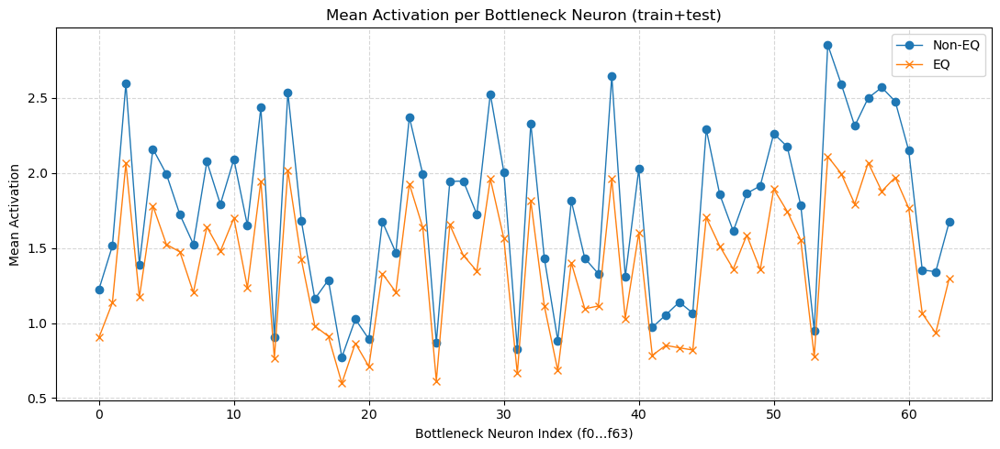

 Saved figure to: figures/bottleneck_mean_activation_train_plus_test.png
Top 10 neurons by |EQ−NonEQ| diff:
f54: diff=-0.7438  (EQ=2.1112, NonEQ=2.8551)
f58: diff=-0.6919  (EQ=1.8785, NonEQ=2.5704)
f38: diff=-0.6864  (EQ=1.9599, NonEQ=2.6463)
f55: diff=-0.5973  (EQ=1.9957, NonEQ=2.5930)
f45: diff=-0.5883  (EQ=1.7037, NonEQ=2.2921)
f29: diff=-0.5651  (EQ=1.9618, NonEQ=2.5269)
f49: diff=-0.5590  (EQ=1.3551, NonEQ=1.9141)
f02: diff=-0.5330  (EQ=2.0633, NonEQ=2.5963)
f14: diff=-0.5218  (EQ=2.0167, NonEQ=2.5385)
f56: diff=-0.5201  (EQ=1.7935, NonEQ=2.3136)


In [522]:
"""
This plot compares the average activation across each of the 64 bottleneck neurons, between Earthquake (EQ) and Non-EQ bottleneck vectors.

It is useful for Spotting which neurons activate more for EQs, and also showing if the encoder captures earthquake-specific features.
"""

# Load current bottlenecks (64-D)
non_eq_tr = np.load("non_eq_train_bottleneck_64.npy")   # (729, 64)
non_eq_te = np.load("non_eq_test_bottleneck_64.npy")    # (183, 64)
eq_tr     = np.load("eq_bott_train_64.npy")             # (652, 64)
eq_te     = np.load("eq_bott_test_64.npy")              # (116, 64)

# Use ALL available samples per class (train+test)
non_eq_all = np.vstack([non_eq_tr, non_eq_te])          # (912, 64)
eq_all     = np.vstack([eq_tr, eq_te])                  # (768, 64)

# Compute mean activation for each neuron
non_eq_mean = non_eq_all.mean(axis=0)                   # (64,)
eq_mean     = eq_all.mean(axis=0)                       # (64,)

# Plot 
plt.figure(figsize=(11, 5))
plt.plot(non_eq_mean, label="Non-EQ", marker='o', linewidth=1)
plt.plot(eq_mean,     label="EQ",     marker='x', linewidth=1)
plt.title("Mean Activation per Bottleneck Neuron (train+test)")
plt.xlabel("Bottleneck Neuron Index (f0…f63)")
plt.ylabel("Mean Activation")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
save_and_show("bottleneck_mean_activation_train_plus_test.png")

# Print which neurons differ most on average
diff = eq_mean - non_eq_mean
top = np.argsort(np.abs(diff))[::-1][:10]
print("Top 10 neurons by |EQ−NonEQ| diff:")
for j in top:
    print(f"f{j:02d}: diff={diff[j]:+.4f}  (EQ={eq_mean[j]:.4f}, NonEQ={non_eq_mean[j]:.4f})")

The figure shows the average bottleneck activation per neuron between EQ and Non-EQ inputs. Neurons are selected which have different responses for the seismic event

##### Statistical significant test

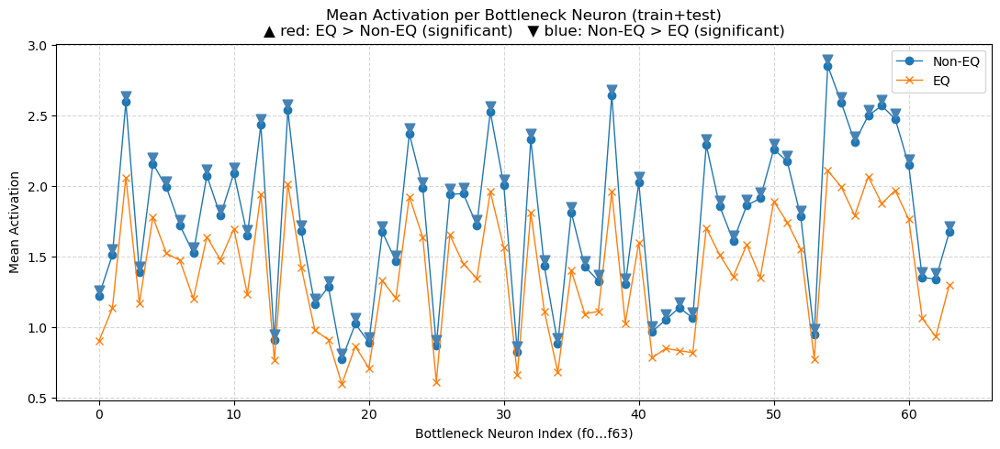

 Saved figure to: figures/bottleneck_mean_activation_comparison_full_significance.png

Significant neurons (p < 0.05) — EQ mean > Non-EQ mean:

Significant neurons (p < 0.05) — Non-EQ mean > EQ mean:
  f54: diff=-0.7438  (EQ=2.111, NonEQ=2.855, p=6.26e-20)
  f58: diff=-0.6919  (EQ=1.879, NonEQ=2.570, p=1.51e-21)
  f38: diff=-0.6864  (EQ=1.960, NonEQ=2.646, p=5.04e-17)
  f55: diff=-0.5973  (EQ=1.996, NonEQ=2.593, p=2.42e-12)
  f45: diff=-0.5883  (EQ=1.704, NonEQ=2.292, p=4.87e-19)
  f29: diff=-0.5651  (EQ=1.962, NonEQ=2.527, p=3.30e-15)
  f49: diff=-0.5590  (EQ=1.355, NonEQ=1.914, p=8.85e-17)
  f02: diff=-0.5330  (EQ=2.063, NonEQ=2.596, p=2.76e-12)
  f14: diff=-0.5218  (EQ=2.017, NonEQ=2.538, p=4.67e-11)
  f56: diff=-0.5201  (EQ=1.793, NonEQ=2.314, p=1.16e-11)
  f32: diff=-0.5180  (EQ=1.813, NonEQ=2.331, p=9.40e-14)
  f59: diff=-0.5062  (EQ=1.971, NonEQ=2.478, p=1.29e-11)


In [524]:
from scipy.stats import ttest_ind

# Mean activation per neuron (64,)
non_eq_mean = non_eq_all.mean(axis=0)
eq_mean     = eq_all.mean(axis=0)
diff        = eq_mean - non_eq_mean              # positive -> EQ higher

# Welch t-test per neuron
p_values = np.empty(64, dtype=float)
for j in range(64):
    _, p = ttest_ind(eq_all[:, j], non_eq_all[:, j], equal_var=False)
    p_values[j] = p

alpha = 0.05  # significance level

# Plot means + significance markers with direction
plt.figure(figsize=(11, 5))
plt.plot(non_eq_mean, label="Non-EQ", marker='o', linewidth=1)
plt.plot(eq_mean,     label="EQ",     marker='x', linewidth=1)

for j in range(64):
    if p_values[j] < alpha:
        y = max(eq_mean[j], non_eq_mean[j]) + 0.04  # place marker slightly above
        if diff[j] > 0:
            # EQ mean > Non-EQ mean  -> up-triangle, red
            plt.scatter(j, y, marker='^', color='crimson', s=60, zorder=5)
        else:
            # Non-EQ mean > EQ mean -> down-triangle, blue
            plt.scatter(j, y, marker='v', color='steelblue', s=60, zorder=5)

plt.title("Mean Activation per Bottleneck Neuron (train+test)\n"
          "▲ red: EQ > Non-EQ (significant)   ▼ blue: Non-EQ > EQ (significant)")
plt.xlabel("Bottleneck Neuron Index (f0…f63)")
plt.ylabel("Mean Activation")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
save_and_show("bottleneck_mean_activation_comparison_full_significance.png")

# Print summary lists 
sig_idx = np.where(p_values < alpha)[0]
eq_up   = [j for j in sig_idx if diff[j] > 0]   # EQ-sensitive (higher for EQ)
eq_down = [j for j in sig_idx if diff[j] <= 0]  # higher for Non-EQ

# Sort each list by absolute effect size |diff|
eq_up   = sorted(eq_up,   key=lambda j: abs(diff[j]), reverse=True)
eq_down = sorted(eq_down, key=lambda j: abs(diff[j]), reverse=True)

print("\nSignificant neurons (p < 0.05) — EQ mean > Non-EQ mean:")
for j in eq_up[:12]:
    print(f"  f{j:02d}: diff={diff[j]:+.4f}  (EQ={eq_mean[j]:.3f}, NonEQ={non_eq_mean[j]:.3f}, p={p_values[j]:.2e})")

print("\nSignificant neurons (p < 0.05) — Non-EQ mean > EQ mean:")
for j in eq_down[:12]:
    print(f"  f{j:02d}: diff={diff[j]:+.4f}  (EQ={eq_mean[j]:.3f}, NonEQ={non_eq_mean[j]:.3f}, p={p_values[j]:.2e})")

##### Neuron-Level Comparison of Activation Differences vs Random Forest Feature Importance

Saved combined table → neuron_stats_vs_RF.csv


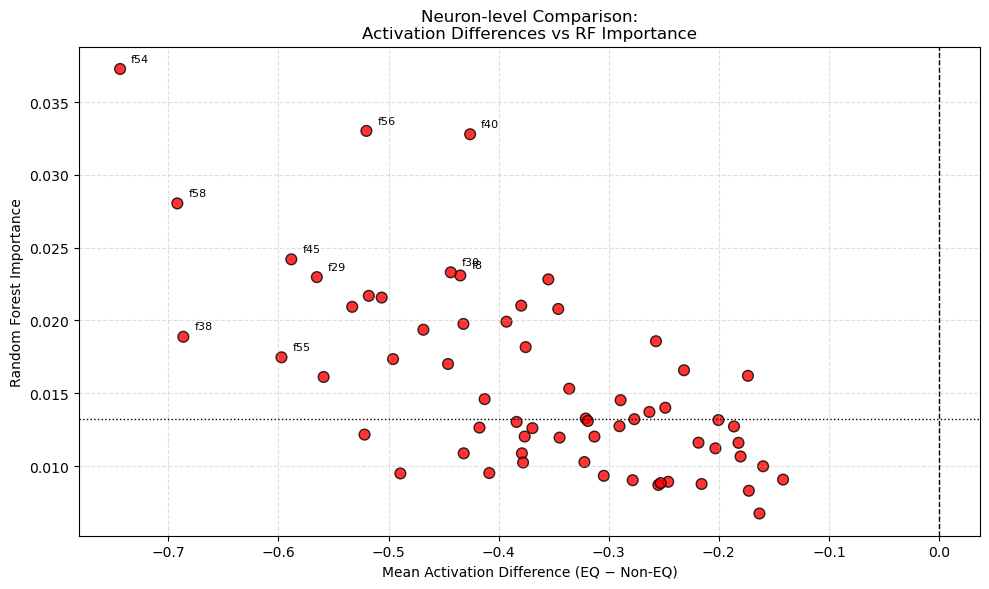

 Saved figure to: figures/neuron_diff_vs_RFimportance.png


In [544]:
# Mean activations
non_eq_mean = non_eq_all.mean(axis=0)
eq_mean     = eq_all.mean(axis=0)
diff        = eq_mean - non_eq_mean

# t-tests per neuron
p_values = []
for i in range(eq_all.shape[1]):
    _, p = ttest_ind(eq_all[:, i], non_eq_all[:, i], equal_var=False)
    p_values.append(p)
p_values = np.array(p_values)

alpha = 0.05
significant = p_values < alpha

# reload the trained RF
clf = joblib.load("rf_model.pkl")

# importances as a 64-length array
importances = clf.feature_importances_


# Put everything in a table
df = pd.DataFrame({
    "Neuron": [f"f{i}" for i in range(64)],
    "EQ_mean": eq_mean,
    "NonEQ_mean": non_eq_mean,
    "Diff(EQ-NonEQ)": diff,
    "p_value": p_values,
    "Significant": significant,
    "RF_importance": importances
})

# Sort by RF importance (highest first)
df_sorted = df.sort_values("RF_importance", ascending=False)

# Save table 
df_sorted.to_csv("neuron_stats_vs_RF.csv", index=False)
print("Saved combined table → neuron_stats_vs_RF.csv")

# Plot: importance vs mean-diff significance 
plt.figure(figsize=(10,6))
colors = ["red" if sig else "gray" for sig in significant]

plt.scatter(diff, importances, c=colors, alpha=0.8, s=60, edgecolor="k")

plt.axvline(0, color="k", linestyle="--", lw=1)
plt.axhline(np.median(importances), color="k", linestyle=":", lw=1)

plt.xlabel("Mean Activation Difference (EQ − Non-EQ)")
plt.ylabel("Random Forest Importance")
plt.title("Neuron-level Comparison:\nActivation Differences vs RF Importance")
plt.grid(ls="--", alpha=0.4)

# Label top neurons by importance or by large diff
top_imp  = df_sorted.head(8)
top_diff = df.reindex(np.argsort(np.abs(diff))[-5:])
to_label = pd.concat([top_imp, top_diff]).drop_duplicates(subset=["Neuron"])

for _, r in to_label.iterrows():
    plt.text(r["Diff(EQ-NonEQ)"] + 0.01, r["RF_importance"] + 0.0005,
        r["Neuron"],
        fontsize=8)
    
plt.tight_layout()
save_and_show("neuron_diff_vs_RFimportance.png")

This analysis compares the raw statistical behaviour of bottleneck neurons with the way the Random Forest classifier utilised them. 
On the x-axis, the mean activation difference (EQ − Non-EQ) highlights neurons that are more responsive to earthquakes at a global level. 
On the y-axis, the Random Forest feature importance quantifies how strongly each neuron contributed to classification decisions. 
The combined scatter plot therefore reveals whether neurons that show large statistical differences are also the ones prioritised by the classifier. 
Of note, some neurons are high on both axes (e.g., f54, f56, f40), suggesting that they contain information that is specific to the earthquake class and used by the model. Some neurons have a statistical separation but were assigned low importance, suggesting the Random Forest model ignored them. 
This joint analysis is useful to identify the most important bottleneck neurons and also where the statistical and model-based perspectives agree or not.

Understanding which bottleneck neurons are both statistically different and influential in classification is crucial for anomaly detection. 
It ensures that the model is not simply picking up spurious differences but is instead relying on features that genuinely separate earthquake signals from background activity. 
This alignment between statistical and classifier-driven perspectives strengthens the interpretability and reliability of the anomaly detection framework.

##### Ranked Shortlist of Bottleneck Neurons

In [554]:
"""
Neuron Ranking: Combining Classifier Importance, Activation Differences, and Significance
----------------------------------------------------------------------------------------
This step merges three perspectives to create a ranked shortlist of the most informative 
bottleneck neurons:

1. RF_importance — how much the Random Forest relied on each neuron for classification 
   (higher = more useful to the model).
2. AbsDiff — the absolute difference in mean activation between EQ and Non-EQ samples 
   (higher = stronger class separation in the data).
3. Significance — whether that difference is statistically significant (Welch’s t-test, 
   p < 0.05).

Method:
- Convert RF importance and AbsDiff into percentile ranks (0..1 scale).
- Average the two ranks equally (50% each).
- Add a small bonus (+0.10) for neurons that were statistically significant.
- The resulting RankScore highlights neurons that are both important to the classifier
and show clear statistical separation.

Output:
- A ranked table of neurons with columns for RF_importance, Diff(EQ–NonEQ), AbsDiff, 
  p-value, significance flag, and the combined RankScore.
- The top rows represent the most consistent and defensible neurons. 
"""


# Build base table
df = pd.DataFrame({
    "Neuron": [f"f{i}" for i in range(64)],
    "EQ_mean": eq_mean,
    "NonEQ_mean": non_eq_mean,
    "Diff(EQ-NonEQ)": diff,
    "AbsDiff": np.abs(diff),
    "p_value": p_values,
    "Significant": (p_values < 0.05),
    "RF_importance": importances
})

# Percentile ranks (0..1). Higher = better.
# With ascending=True, larger values get ranks near 1.0 already.
r_imp  = df["RF_importance"].rank(pct=True, ascending=True)   # high importance -> appx. 1.0
r_diff = df["AbsDiff"].rank(pct=True, ascending=True)         # large separation -> appx. 1.0

# Small bonus for statistically significant neurons
sig_bonus = df["Significant"].astype(float) * 0.10   # +0.10 if Significant else +0.00

# Final combined score (equal weights)
df["RankScore"] = 0.5 * r_imp + 0.5 * r_diff + sig_bonus

# Save the full table (sorted by the final score)
df_final = df.sort_values("RankScore", ascending=False)
df_final.to_csv("neuron_stats_ranked.csv", index=False)
print("Saved full ranked table → neuron_stats_ranked.csv")

# Shortlist top 20
shortlist = df_final.head(20).copy()
shortlist.to_csv("neuron_shortlist_ranked.csv", index=False)
print("Saved shortlist → neuron_shortlist_ranked.csv")

# Quick peek
display_cols = ["Neuron","RF_importance","Diff(EQ-NonEQ)","AbsDiff","p_value","Significant","RankScore"]
print(shortlist[display_cols].to_string(index=False, float_format=lambda v: f"{v:.4f}"))

Saved full ranked table → neuron_stats_ranked.csv
Saved shortlist → neuron_shortlist_ranked.csv
Neuron  RF_importance  Diff(EQ-NonEQ)  AbsDiff  p_value  Significant  RankScore
   f54         0.0373         -0.7438   0.7438   0.0000         True     1.1000
   f58         0.0280         -0.6919   0.6919   0.0000         True     1.0688
   f45         0.0242         -0.5883   0.5883   0.0000         True     1.0375
   f56         0.0330         -0.5201   0.5201   0.0000         True     1.0219
   f29         0.0230         -0.5651   0.5651   0.0000         True     1.0063
   f32         0.0217         -0.5180   0.5180   0.0000         True     0.9516
    f2         0.0209         -0.5330   0.5330   0.0000         True     0.9516
   f38         0.0189         -0.6864   0.6864   0.0000         True     0.9516
   f30         0.0233         -0.4435   0.4435   0.0000         True     0.9359
   f59         0.0216         -0.5062   0.5062   0.0000         True     0.9359
   f40         0.0328   

##### Random Forest Classifier perspective

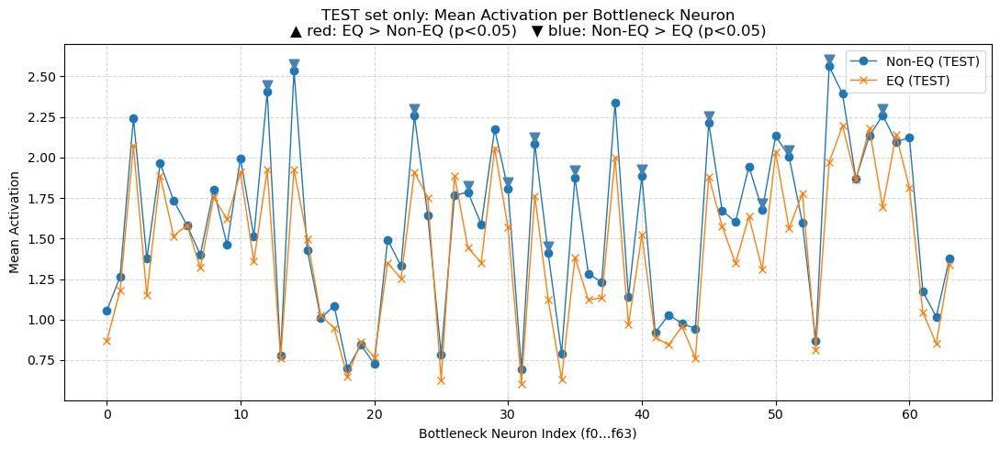

 Saved figure to: figures/test_mean_activation_significance.png

RF top-20 neurons (by importance) and TEST-set stats:
Neuron  RF_imp    Diff(EQ-NonEQ)   AbsDiff   p-value   Significant
f54  0.0373    -0.5910    0.5910    1.12e-03   True
f56  0.0330    -0.0031    0.0031    9.85e-01   False
f40  0.0328    -0.3619    0.3619    1.59e-02   True
f58  0.0280    -0.5656    0.5656    1.32e-04   True
f45  0.0242    -0.3312    0.3312    2.31e-02   True
f30  0.0233    -0.2382    0.2382    3.96e-02   True
f08  0.0231    -0.0464    0.0464    7.26e-01   False
f29  0.0230    -0.1187    0.1187    4.48e-01   False
f24  0.0228    +0.1101    0.1101    4.31e-01   False
f32  0.0217    -0.3223    0.3223    4.42e-02   True
f59  0.0216    +0.0428    0.0428    7.89e-01   False
f04  0.0210    -0.0770    0.0770    5.91e-01   False
f02  0.0209    -0.1718    0.1718    3.34e-01   False
f21  0.0208    -0.1433    0.1433    2.71e-01   False
f10  0.0199    -0.0870    0.0870    5.76e-01   False
f57  0.0198    +0.0452   

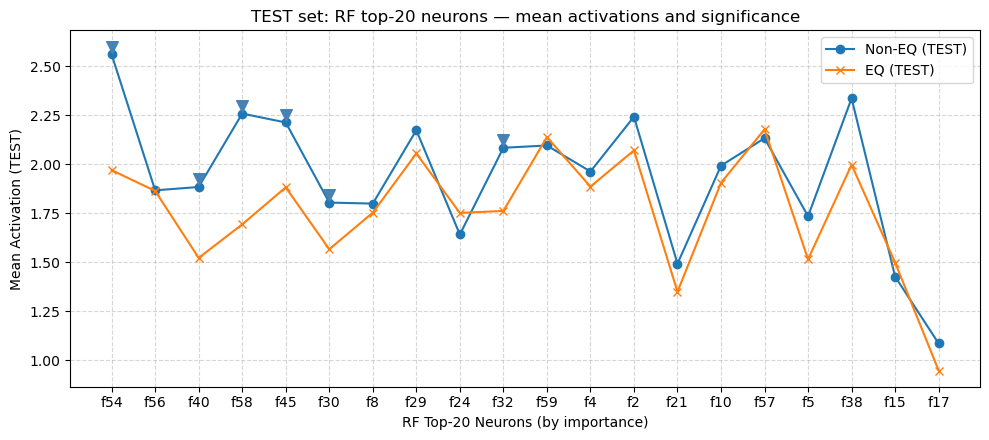

 Saved figure to: figures/test_mean_activation_RFtop20.png

Significant (TEST) — EQ mean > Non-EQ mean:

Significant (TEST) — Non-EQ mean > EQ mean:
  f14: diff=-0.6134 (EQ=1.924, NonEQ=2.537), p=7.27e-04
  f54: diff=-0.5910 (EQ=1.971, NonEQ=2.562), p=1.12e-03
  f58: diff=-0.5656 (EQ=1.694, NonEQ=2.259), p=1.32e-04
  f35: diff=-0.4946 (EQ=1.383, NonEQ=1.877), p=6.35e-04
  f12: diff=-0.4814 (EQ=1.923, NonEQ=2.405), p=4.28e-03
  f51: diff=-0.4449 (EQ=1.561, NonEQ=2.006), p=2.67e-03
  f49: diff=-0.3670 (EQ=1.309, NonEQ=1.676), p=1.13e-02
  f40: diff=-0.3619 (EQ=1.523, NonEQ=1.885), p=1.59e-02
  f23: diff=-0.3482 (EQ=1.909, NonEQ=2.257), p=4.13e-02
  f27: diff=-0.3437 (EQ=1.443, NonEQ=1.786), p=2.67e-02
  f45: diff=-0.3312 (EQ=1.883, NonEQ=2.214), p=2.31e-02
  f32: diff=-0.3223 (EQ=1.762, NonEQ=2.085), p=4.42e-02


In [561]:
"""
EQ vs Non-EQ mean activations on the RF TEST SET only,
with significance (Welch t-test) and Random Forest top-features highlighted.
Outputs:
- figures/test_mean_activation_significance.png       (all 64 neurons)
- figures/test_mean_activation_RFtop10.png            (RF top-20 only, sorted)
- prints lists of significant neurons (p < 0.05) with effect sizes
"""

import joblib

# Load TEST bottlenecks (what RF was scored on)
non_eq_te = np.load("non_eq_test_bottleneck_64.npy")   # (183, 64)
eq_te     = np.load("eq_bott_test_64.npy")             # (116, 64)

# Load trained RF and its importances
clff = joblib.load("rf_model.pkl")
rf_imp = clff.feature_importances_                      # (64,)

# Mean activations + Welch t-tests on TEST only 
non_eq_mean = non_eq_te.mean(axis=0)                   # (64,)
eq_mean     = eq_te.mean(axis=0)                       # (64,)
diff        = eq_mean - non_eq_mean                    # >0 means EQ higher

p_values = np.empty(64, dtype=float)
for j in range(64):
    # Welch t-test (unequal variances) on TEST samples only
    _, p = ttest_ind(eq_te[:, j], non_eq_te[:, j], equal_var=False)
    p_values[j] = p

alpha = 0.05
sig_idx = np.where(p_values < alpha)[0]
eq_higher  = [j for j in sig_idx if diff[j] > 0]   # EQ > Non-EQ (TEST)
noneq_higher = [j for j in sig_idx if diff[j] <= 0] # Non-EQ > EQ (TEST)

# Plot ALL 64 neurons (TEST only) with significance markers 
plt.figure(figsize=(11, 5))
plt.plot(non_eq_mean, label="Non-EQ (TEST)", marker='o', linewidth=1)
plt.plot(eq_mean,     label="EQ (TEST)",     marker='x', linewidth=1)

# significance markers above the higher mean
for j in range(64):
    if p_values[j] < alpha:
        y = max(eq_mean[j], non_eq_mean[j]) + 0.04
        if diff[j] > 0:
            plt.scatter(j, y, marker='^', color='crimson', s=60, zorder=5)   # EQ higher
        else:
            plt.scatter(j, y, marker='v', color='steelblue', s=60, zorder=5) # Non-EQ higher

plt.title("TEST set only: Mean Activation per Bottleneck Neuron\n"
          "▲ red: EQ > Non-EQ (p<0.05)   ▼ blue: Non-EQ > EQ (p<0.05)")
plt.xlabel("Bottleneck Neuron Index (f0…f63)")
plt.ylabel("Mean Activation")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
save_and_show("test_mean_activation_significance.png")

# Focused view: RF top-20 neurons on TEST
top_k = 20
top_idx = np.argsort(rf_imp)[-top_k:][::-1]  # indices of RF-most-important features (desc)

# build a small table for printing and to sort by RF importance
print("\nRF top-20 neurons (by importance) and TEST-set stats:")
print("Neuron  RF_imp    Diff(EQ-NonEQ)   AbsDiff   p-value   Significant")
rows = []
for j in top_idx:
    rows.append((f"f{j}", rf_imp[j], diff[j], abs(diff[j]), p_values[j], p_values[j] < alpha))
    print(f"f{j:02d}  {rf_imp[j]:.4f}    {diff[j]:+.4f}    {abs(diff[j]):.4f}    {p_values[j]:.2e}   {p_values[j]<alpha}")

# plot only these neurons, sorted by RF importance
plt.figure(figsize=(10, 4.5))
x = np.arange(len(top_idx))
plt.plot(x, [non_eq_mean[j] for j in top_idx], marker='o', label="Non-EQ (TEST)")
plt.plot(x, [eq_mean[j]     for j in top_idx], marker='x', label="EQ (TEST)")

# significance markers for those top features
for k, j in enumerate(top_idx):
    if p_values[j] < alpha:
        y = max(eq_mean[j], non_eq_mean[j]) + 0.04
        color = 'crimson' if diff[j] > 0 else 'steelblue'
        mark  = '^' if diff[j] > 0 else 'v'
        plt.scatter(k, y, marker=mark, color=color, s=70, zorder=5)

plt.xticks(x, [f"f{j}" for j in top_idx])
plt.xlabel("RF Top-20 Neurons (by importance)")
plt.ylabel("Mean Activation (TEST)")
plt.title("TEST set: RF top-20 neurons — mean activations and significance")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
save_and_show("test_mean_activation_RFtop20.png")


# Brief textual summary 
eq_up   = sorted(eq_higher,   key=lambda j: abs(diff[j]), reverse=True)
noneq_up= sorted(noneq_higher,key=lambda j: abs(diff[j]), reverse=True)

print("\nSignificant (TEST) — EQ mean > Non-EQ mean:")
for j in eq_up[:12]:
    print(f"  f{j:02d}: diff={diff[j]:+.4f} (EQ={eq_mean[j]:.3f}, NonEQ={non_eq_mean[j]:.3f}), p={p_values[j]:.2e}")

print("\nSignificant (TEST) — Non-EQ mean > EQ mean:")
for j in noneq_up[:12]:
    print(f"  f{j:02d}: diff={diff[j]:+.4f} (EQ={eq_mean[j]:.3f}, NonEQ={non_eq_mean[j]:.3f}), p={p_values[j]:.2e}")

##### RF t-SNE and UMAP Plot to spot any clear separation

TEST  -> X: (299, 64)  | y: (299,) | Non-EQ: 183  EQ: 116
Using top-20 neurons by RF importance: [54, 56, 40, 58, 45, 30, 8, 29, 24, 32, 59, 4, 2, 21, 10, 57, 5, 38, 15, 17]
t-SNE silhouette (top-20): -0.015


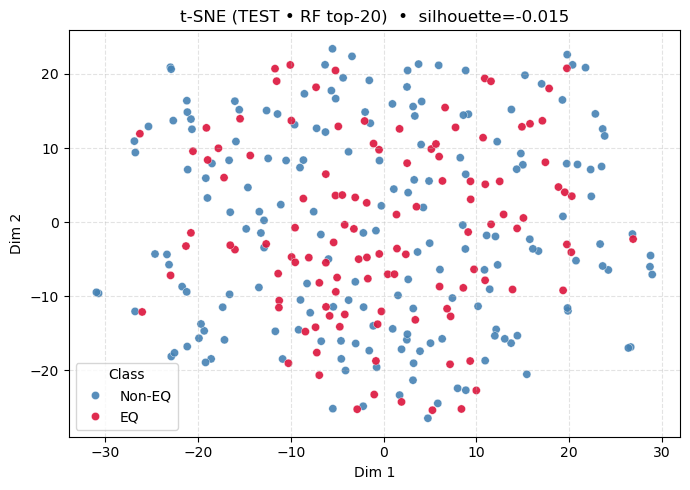

 Saved figure to: figures/RFtop20_t-SNE.png


In [578]:
"""
Local structure on TEST using RF top-20 neurons (exact same TEST as RF eval).

Rebuilds X_test, y_test exactly :
X_test = [non_eq_test_bottleneck_64; eq_bott_test_64]
y_test = [0...0 (183), 1...1 (116)]

Then selects RF top-k neurons, standardizes, and runs t-SNE + UMAP, and  Plots both embeddings 
colored by class and prints silhouette scores.

Why:
If EQ has a subtle but real signature in the bottleneck, it can show up
as a small separation in these local (top-k) embeddings even when global views look messy.
"""

# Rebuild TEST exactly like RF eval
noneq_te = np.load("non_eq_test_bottleneck_64.npy")   # (183, 64)
eq_te    = np.load("eq_bott_test_64.npy")             # (116, 64)

X_test = np.vstack([noneq_te, eq_te]).astype("float32")      # (299, 64)
y_test = np.r_[np.zeros(len(noneq_te), dtype=int),
               np.ones(len(eq_te), dtype=int)]               # (299,)
print("TEST  -> X:", X_test.shape, " | y:", y_test.shape,
      f"| Non-EQ: {(y_test==0).sum()}  EQ: {(y_test==1).sum()}")

# Load the exact RF trained
clf = joblib.load("rf_model.pkl")
rf_importances = clf.feature_importances_   # shape (64,)

# Select top-k neurons (cap at 64)
k = min(20, X_test.shape[1])               # = 64 here
top_idx = np.argsort(rf_importances)[-k:][::-1]
print(f"Using top-{k} neurons by RF importance:", top_idx.tolist())

X_top = X_test[:, top_idx]

# Standardize features (for visualization geometry only)
scaler = StandardScaler().fit(X_top)
X_top_std = scaler.transform(X_top)

#  t-SNE 
tsne = TSNE(n_components=2, random_state=7, perplexity=15, init="pca")
X_tsne = tsne.fit_transform(X_top_std)
sil_tsne = silhouette_score(X_tsne, y_test)
print(f"t-SNE silhouette (top-{k}): {sil_tsne:.3f}")

plt.figure(figsize=(7,5))
sns.scatterplot(x=X_tsne[:,0], y=X_tsne[:,1],
                hue=np.where(y_test==0,"Non-EQ","EQ"), palette={"Non-EQ":"steelblue","EQ":"crimson"},
                s=35, alpha=0.9, edgecolor="white", linewidth=0.3)
plt.title(f"t-SNE (TEST • RF top-{k})  •  silhouette={sil_tsne:.3f}")
plt.xlabel("Dim 1"); plt.ylabel("Dim 2")
plt.legend(title="Class"); plt.grid(True, ls="--", alpha=0.35)
plt.tight_layout()
plt.savefig(f"figures/tsne_TEST_rf_top{k}.png", dpi=200, bbox_inches="tight")
save_and_show("RFtop20_t-SNE.png")

/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP silhouette (top-20): 0.008


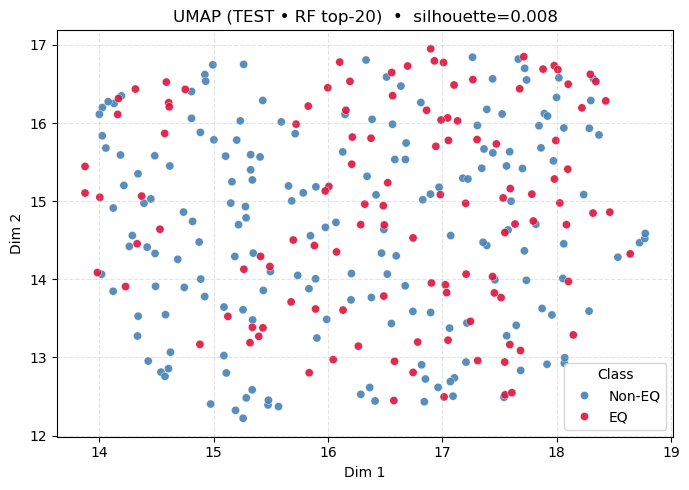

 Saved figure to: figures/RFtop20_UMAP.png


In [580]:
# UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_umap = reducer.fit_transform(X_top_std)
sil_umap = silhouette_score(X_umap, y_test)
print(f"UMAP silhouette (top-{k}): {sil_umap:.3f}")

plt.figure(figsize=(7,5))
sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1],
                hue=np.where(y_test==0,"Non-EQ","EQ"),
                palette={"Non-EQ":"steelblue","EQ":"crimson"},
                s=35, alpha=0.9, edgecolor="white", linewidth=0.3)
plt.title(f"UMAP (TEST • RF top-{k})  •  silhouette={sil_umap:.3f}")
plt.xlabel("Dim 1"); plt.ylabel("Dim 2")
plt.legend(title="Class"); plt.grid(True, ls="--", alpha=0.35)
plt.tight_layout()
plt.savefig(f"figures/umap_TEST_rf_top{k}.png", dpi=200, bbox_inches="tight")
save_and_show("RFtop20_UMAP.png")

No Separation in the latent space from UMAP and t-SNE

##### Distribution Plots for Top 5 Interesting Neurons

Top-5 neurons by RF importance: ['f54', 'f56', 'f40', 'f58', 'f45']


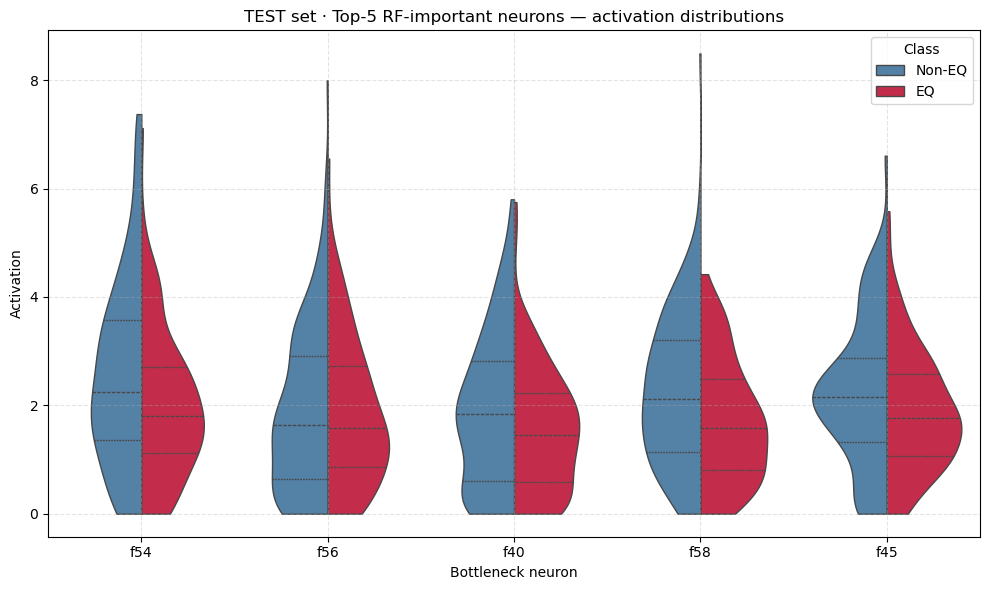

 Saved figure to: figures/violin_RF_top5_test.png


In [583]:
"""
This script plots top-5 RF-important bottleneck neurons (TEST set) — violin plots of activations.

What it does:
1) Load TEST bottlenecks and labels (Non-EQ=0, EQ=1).
2) Load saved RandomForest model and get feature importances.
3) Select top-5 neurons by RF importance.
4) Plot split violin distributions (EQ vs Non-EQ) for those neurons.
"""

# Load TEST bottlenecks + labels
noneq_te = np.load("non_eq_test_bottleneck_64.npy")   # (183, 64)
eq_te    = np.load("eq_bott_test_64.npy")             # (116, 64)

X_test = np.vstack([noneq_te, eq_te]).astype("float32")     # (299, 64)
y_test = np.r_[np.zeros(len(noneq_te), dtype=int),
               np.ones(len(eq_te),  dtype=int)]             # (299,)

# Load RF and get top-5 feature indices
clf = joblib.load("rf_model.pkl")
rf_importances = clf.feature_importances_                 # (64,)
top_k = 5
top_idx = np.argsort(rf_importances)[::-1][:top_k]        # most important first
top_labels = [f"f{j}" for j in top_idx]
print("Top-5 neurons by RF importance:", top_labels)

# Build DataFrame for seaborn
rows = []
for j in top_idx:
    # Non-EQ (0)
    rows += [(f"f{j}", "Non-EQ", v) for v in X_test[y_test == 0, j]]
    # EQ (1)
    rows += [(f"f{j}", "EQ",     v) for v in X_test[y_test == 1, j]]

df = pd.DataFrame(rows, columns=["Neuron", "Class", "Activation"])

# Plot split violins
plt.figure(figsize=(10, 6))
sns.violinplot(
    data=df, x="Neuron", y="Activation", hue="Class",
    order=top_labels, hue_order=["Non-EQ", "EQ"],
    split=True, inner="quartile", cut=0, linewidth=1,
    palette={"Non-EQ":"steelblue", "EQ":"crimson"}
)
plt.title("TEST set · Top-5 RF-important neurons — activation distributions")
plt.xlabel("Bottleneck neuron")
plt.ylabel("Activation")
plt.grid(True, linestyle='--', alpha=0.35)
plt.tight_layout()
save_and_show("violin_RF_top5_test.png")

The violin plots show top bottleneck neurons with distinct EQ vs Non-EQ activations.

In [585]:
# Print Dataframe
tbl = pd.DataFrame({
    "Neuron": top_labels,
    "RF_importance": rf_importances[top_idx]}).sort_values("RF_importance", ascending=False)
print("\nTop-5 by RF importance (TEST):")
print(tbl.to_string(index=False))


Top-5 by RF importance (TEST):
Neuron  RF_importance
   f54       0.037270
   f56       0.033017
   f40       0.032787
   f58       0.028039
   f45       0.024199


## Visualize The Waveforms Associated With Top Features

Top RF-important neurons: ['f54', 'f56', 'f40', 'f58', 'f45']


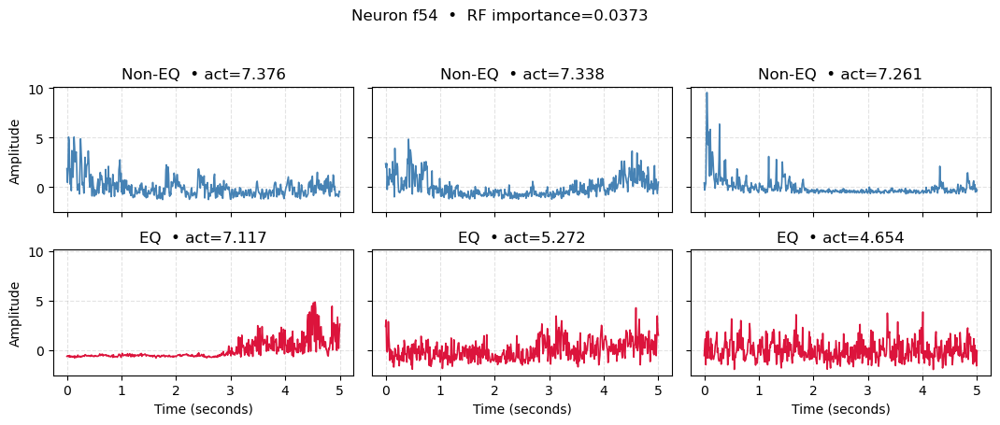

Saved figure to: figures/waveforms_topRF_f54.png


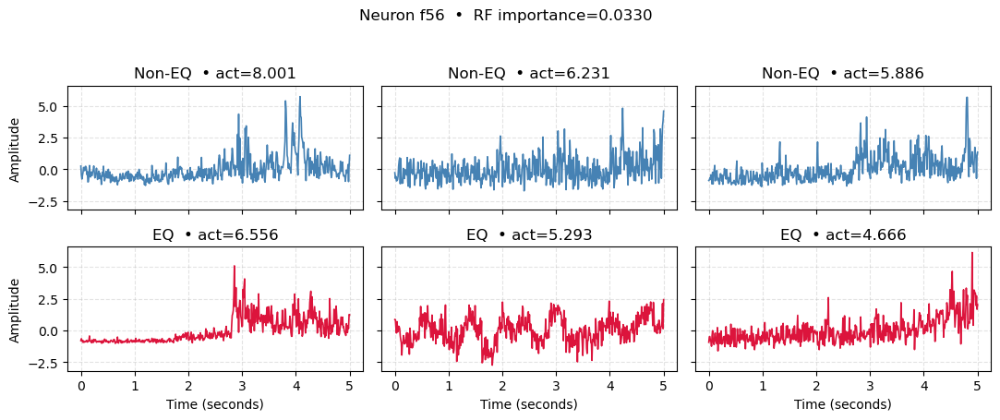

Saved figure to: figures/waveforms_topRF_f56.png


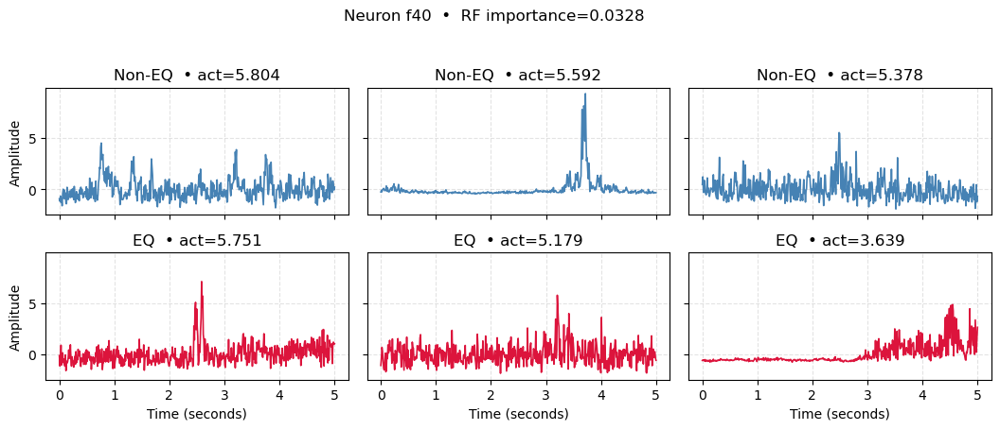

Saved figure to: figures/waveforms_topRF_f40.png


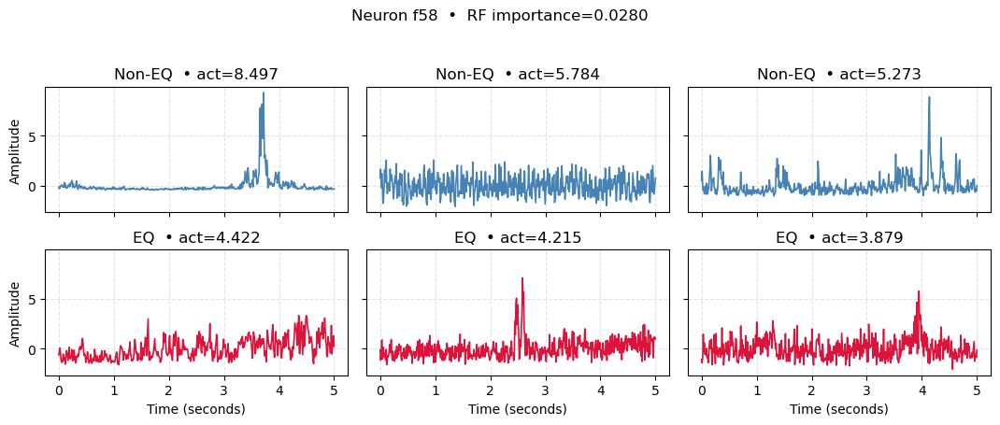

Saved figure to: figures/waveforms_topRF_f58.png


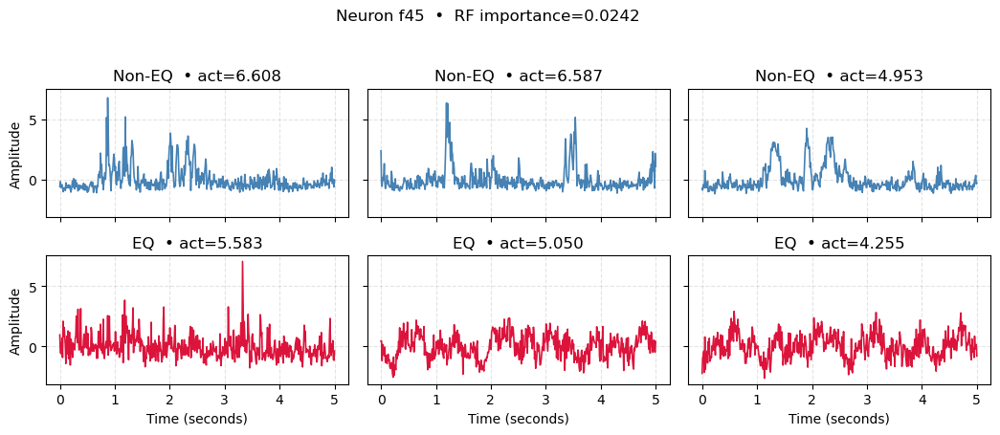

Saved figure to: figures/waveforms_topRF_f45.png


In [589]:
"""
Waveform views for top RF-important bottleneck neurons (TEST set)

What this does
--------------
1) Load TEST bottlenecks and matching raw TEST waveforms.
2) Load saved RF model and pick the top-K neurons by feature importance.
3) For each chosen neuron j, find the top-M TEST samples with the largest activation
   separately for Non-EQ and EQ.
4) Plot the raw 500-sample waveforms for those top-M samples per class.

Outputs
-------
- figures/waveforms_topRF_f{j}.png  (one figure per neuron)
"""

# params 
TOP_K_NEURONS = 5          # how many RF-important neurons to visualize
TOP_M_WAVEFORMS = 3        # how many waveforms per class to show
SAVE_DIR = "figures"
os.makedirs(SAVE_DIR, exist_ok=True)

# load data
# TEST bottlenecks (64-D)
non_eq_bott = np.load("non_eq_test_bottleneck_64.npy")   # (183, 64)
eq_bott     = np.load("eq_bott_test_64.npy")             # (116, 64)

# Matching raw TEST waveforms (length 500 each)
non_eq_raw = np.load("non_eq_X_test.npy")                # (183, 500)
eq_raw     = np.load("eq_test.npy")                      # (116, 500)

assert non_eq_bott.shape[0] == non_eq_raw.shape[0], "Non-EQ counts mismatch."
assert eq_bott.shape[0]     == eq_raw.shape[0],     "EQ counts mismatch."
assert non_eq_bott.shape[1] == 64 and eq_bott.shape[1] == 64, "Expected 64-D bottlenecks."

# RF: top-K neurons
clf = joblib.load("rf_model.pkl")
rf_imp = clf.feature_importances_      # (64,)
top_idx = np.argsort(rf_imp)[::-1][:TOP_K_NEURONS]
print("Top RF-important neurons:", [f"f{i}" for i in top_idx])

# helper function to plot a panel for one neuron
def plot_waveform_panel(j, top_m=3):
    """
    For neuron j, plot top-M Non-EQ and top-M EQ TEST waveforms by activation.
    """
    # activations for neuron j
    a_noneq = non_eq_bott[:, j]   # (183,)
    a_eq    = eq_bott[:, j]       # (116,)

    # indices of top-M activations per class
    idx_noneq = np.argsort(a_noneq)[::-1][:top_m]
    idx_eq    = np.argsort(a_eq)[::-1][:top_m]

    # pull raw waveforms
    w_noneq = non_eq_raw[idx_noneq]     # (M, 500)
    w_eq    = eq_raw[idx_eq]            # (M, 500)

    # figure
    ncols = max(top_m, 1)
    fig, axes = plt.subplots(2, ncols, figsize=(3.6*ncols, 4.6), sharex=True, sharey=True)
    if ncols == 1:
        axes = np.array([[axes[0]], [axes[1]]])  # ensures 2x1 array shape

    # Non-EQ (top row)
    for k in range(ncols):
        ax = axes[0, k]
        ax.plot(time_axis, w_noneq[k], lw=1.2, color="steelblue")
        ax.set_title(f"Non-EQ  • act={a_noneq[idx_noneq[k]]:.3f}")
        ax.grid(True, ls="--", alpha=0.35)

    # EQ (bottom row)
    for k in range(ncols):
        ax = axes[1, k]
        ax.plot(time_axis, w_eq[k], lw=1.2, color="crimson")
        ax.set_title(f"EQ  • act={a_eq[idx_eq[k]]:.3f}")
        ax.grid(True, ls="--", alpha=0.35)

    fig.suptitle(f"Neuron f{j}  •  RF importance={rf_imp[j]:.4f}", y=0.98, fontsize=12)
    for ax in axes[-1]:
        ax.set_xlabel("Time (seconds)")
    for ax in axes[:, 0]:
        ax.set_ylabel("Amplitude")

    plt.tight_layout(rect=[0, 0, 1, 0.94])
    out = os.path.join(SAVE_DIR, f"waveforms_topRF_f{j}.png")
    plt.savefig(out, dpi=200, bbox_inches="tight")
    plt.show()
    print(f"Saved figure to: {out}")

# generate figures 
for j in top_idx:
    plot_waveform_panel(j, top_m=TOP_M_WAVEFORMS)

## Map Anomalies Over Space and Time


Human Activity Trend Analysis (guided by RF-important bottleneck neurons)

What it does
------------
1) Load AE bottlenecks (train+test), raw waveforms (500 samples), and the trained RF.
2) Pick top-K neurons by RF feature importance (e.g., f54,f56,f40,f58,f45).
3) For every segment (train+test), compute:
   - Simple vibration features from raw waveform (mean|x|, RMS, dominant freq, band energies).
   - Activations of the selected neurons + an 'EQ-like score' (mean of those activations).
4) Build one tidy DataFrame (one row per segment) with labels and optional metadata.
5) If timestamps exist, aggregate by hour/day/month, run STL decomposition (optional), and plot.
   If timestamps don’t exist yet, still produce station/class summaries and histograms.

Required files available
-------------------------------
- Bottlenecks (64-D): 
    non_eq_train_bottleneck_64.npy, non_eq_test_bottleneck_64.npy,
    eq_bott_train_64.npy, eq_bott_test_64.npy
- Raw normalized waveforms (500 samples):
    non_eq_X_train.npy, non_eq_X_test.npy, eq_train.npy, eq_test.npy
- Trained RF model:
    rf_model.pkl

In [597]:
"""
This script ;
- Defines timing (100 Hz, 2500-sample segments → 25 s/segment)
- Lists the Non-EQ station bases to scan
- Provides EQ times (t0) per station (for absolute segment times)
- Channels per station
"""

from datetime import datetime
import os, re, glob

# Timing constants 
SAMPLE_RATE_HZ   = 100
SEG_LEN_SAMPLES  = 2500
HOP_SAMPLES      = SEG_LEN_SAMPLES   # no hop/overlap -> hop == seg length
SEC_PER_SEG      = SEG_LEN_SAMPLES / SAMPLE_RATE_HZ  # 25.0 seconds

# where the 2500-sample segment files live
segment_dir = "segments_2500_std"

# Non-EQ file bases (without channel suffix)
non_eq_bases = [
    "RCC8D_EQ_trimmed_10min",
    "RD9D6_EQ_trimmed_10min",
    "R76F0_EQ_trimmed_10min",
    "R0CEC_EQ_trimmed_10min",
    "R5B93_EQ_trimmed_10min",
    "R119F_EQ_20230921T132653_10min",
    "R119F_EQ_20231017T080517_10min",
    "R1906_EQ_20230924T205322_10min",
    "R3949_EQ_20230721T031559_10min",
    "R9F13_EQ_20190410T161508_10min",
    "R7000_EQ_20250528T124439_10min",
    "R57CE_EQ_20240918T101939_10min",
]

# Reference/event times for bases that don't include a timestamp in their name
# (Used only to derive absolute segment times; if missing, we’ll try to read from the filename)
eq_times = {
    "RCC8D": datetime(2025, 4, 1, 13, 10, 0),
    "RD9D6": datetime(2023, 10, 13, 8, 56, 40),
    "R76F0": datetime(2023, 5, 24, 22, 22, 40),
    "R0CEC": datetime(2024, 4, 10, 20, 26, 11),
    "R5B93": datetime(2023, 5, 23, 23, 28, 54),
}

# channels per station (3 & 4 components)
station_channels = {
    "RCC8D": ["EHZ", "EHE", "EHN"],
    "RD9D6": ["EHZ", "EHE", "EHN"],
    "R76F0": ["EHZ", "EHE", "EHN"],
    "R0CEC": ["EHZ", "EHE", "EHN"],
    "R5B93": ["EHZ", "EHE", "EHN"],
    "R119F": ["EHZ", "EHE", "EHN"],
    "R1906": ["EHZ", "EHE", "EHN"],
    "R3949": ["EHZ", "EHE", "EHN"],
    "R9F13": ["EHZ", "EHE", "EHN"],
      # 4D stations
    "R7000": ["EHZ", "ENE", "ENN", "ENZ"],
    "R57CE": ["EHZ", "ENE", "ENN", "ENZ"],
}

##### Parse time from filename, segment index -> absolute time

In [599]:
"""
This script is a helper script that ;
- Try to parse an 8-digit date + 'T' + 6-digit time from the filename
- Convert segment index to absolute time (t0 + seg_idx * 25s), if t0 is known
"""

# look for patterns like "..._20250729T232450_..."
ts_pat = re.compile(r".*_(\d{8}T\d{6})_")

def parse_t0_from_name(basename: str):
    """Return a datetime if pattern 'YYYYMMDDTHHMMSS' is found in the base name; else None."""
    m = ts_pat.match(basename + "_")  # add underscore to help pattern at end
    if m:
        return datetime.strptime(m.group(1), "%Y%m%dT%H%M%S")
    return None

def seg_index_to_time(t0: datetime, seg_idx: int):
    """Absolute start time for segment seg_idx (25s each), or None if t0 is None."""
    if t0 is None:
        return None
    return pd.to_datetime(t0) + pd.to_timedelta(seg_idx * SEC_PER_SEG, unit="s")

##### Scan Non-EQ bases & channels → build metadata

In [605]:
"""
  This script builds a tidy metadata table for Non-EQ segments
- Restrict to the provided base names and station channels
- For each matching file, count segments and create one row per segment
- Derive absolute seg_time if we have a t0 (from filename or eq_times)
"""

rows = []

for base in non_eq_bases:
    # station code = text before first underscore (e.g., "RCC8D" from "RCC8D_EQ_trimmed_10min")
    station = base.split("_")[0]
    
    # look up exact channels from manual dictionary
    if station not in station_channels:
        print(f"[WARN] {station} not found in station_channels, skipping...")
        continue

    chans = station_channels[station]

    # try t0: prefer timestamp embedded in base; fallback to eq_times mapping; else None
    t0 = parse_t0_from_name(base)
    if t0 is None:
        t0 = eq_times.get(station, None)

    for ch in chans:
        # most common pattern:
        pattern = os.path.join(segment_dir, f"{base}_{ch}_segments.npy")
        matches = glob.glob(pattern)

        # be tolerant if the naming varies a bit
        if not matches:
            matches = glob.glob(os.path.join(segment_dir, f"{base}*{ch}*segments.npy"))

        if not matches:
            print(f"[WARN] no file for {base} {ch}")
            continue

        for fpath in matches:
            try:
                X = np.load(fpath, allow_pickle=False)
            except Exception as e:
                print(f"[ERROR] could not load {fpath}: {e}")
                continue

            # One row per segment
            nseg = X.shape[0]
            for i in range(nseg):
                rows.append({
                    "source_file": os.path.basename(fpath),
                    "base": base,
                    "station": station,
                    "channel": ch,
                    "seg_idx": i,
                    "t0_event": t0,                               # reference time (if known)
                    "seg_time": seg_index_to_time(t0, i),         # absolute time (if t0 known)
                })

md_non_eq = pd.DataFrame(rows)
print("Non-EQ segment metadata:", md_non_eq.shape)
md_non_eq

Non-EQ segment metadata: (912, 7)


,source_file,base,station,channel,seg_idx,t0_event,seg_time
0,RCC8D_EQ_trimmed_10min_EHZ_segments.npy,RCC8D_EQ_trimmed_10min,RCC8D,EHZ,0,2025-04-01 13:10:00,2025-04-01 13:10:00
1,RCC8D_EQ_trimmed_10min_EHZ_segments.npy,RCC8D_EQ_trimmed_10min,RCC8D,EHZ,1,2025-04-01 13:10:00,2025-04-01 13:10:25
2,RCC8D_EQ_trimmed_10min_EHZ_segments.npy,RCC8D_EQ_trimmed_10min,RCC8D,EHZ,2,2025-04-01 13:10:00,2025-04-01 13:10:50
3,RCC8D_EQ_trimmed_10min_EHZ_segments.npy,RCC8D_EQ_trimmed_10min,RCC8D,EHZ,3,2025-04-01 13:10:00,2025-04-01 13:11:15
4,RCC8D_EQ_trimmed_10min_EHZ_segments.npy,RCC8D_EQ_trimmed_10min,RCC8D,EHZ,4,2025-04-01 13:10:00,2025-04-01 13:11:40
...,...,...,...,...,...,...,...
907,R57CE_EQ_20240918T101939_10min_ENZ_segments.npy,R57CE_EQ_20240918T101939_10min,R57CE,ENZ,19,2024-09-18 10:19:39,2024-09-18 10:27:34
908,R57CE_EQ_20240918T101939_10min_ENZ_segments.npy,R57CE_EQ_20240918T101939_10min,R57CE,ENZ,20,2024-09-18 10:19:39,2024-09-18 10:27:59
909,R57CE_EQ_20240918T101939_10min_ENZ_segments.npy,R57CE_EQ_20240918T101939_10min,R57CE,ENZ,21,2024-09-18 10:19:39,2024-09-18 10:28:24
910,R57CE_EQ_20240918T101939_10min_ENZ_segments.npy,R57CE_EQ_20240918T101939_10min,R57CE,ENZ,22,2024-09-18 10:19:39,2024-09-18 10:28:49


##### Build encoder from AE, load RF, and define 2500→500 + z-norm

In [616]:
"""
 Models & preprocessing
- Load AE and slice the encoder at the 64-D bottleneck
- Load saved Random Forest
- Define: per-segment z-score 
"""

from tensorflow.keras.models import load_model, Model
from tensorflow.keras import layers
import joblib

# Encoder from final AE (first two Dense layers are the encoder)
ae = load_model("final_autoencoder_std.keras", compile=False)
inp = layers.Input(shape=(500,), name="enc_input_500")
h1  = ae.layers[0](inp)   # dense_64
z   = ae.layers[1](h1)    # dense_65 -> 64-D latent
encoder = Model(inp, z, name="encoder_from_finalae")

# RF classifier
rf = joblib.load("rf_model.pkl")

# Per-segment z-score (inputs are already (N,500) std-binned)
def per_segment_z(x_500: np.ndarray) -> np.ndarray:
    """
    For each segment (row): (x - mean) / std.
    Keeps focus on shape/pattern rather than absolute level.
    Expects x_500 of shape (N, 500).
    """
    assert x_500.ndim == 2 and x_500.shape[1] == 500, "Expected (N, 500)."
    m = x_500.mean(axis=1, keepdims=True)
    s = x_500.std(axis=1, keepdims=True) + 1e-8
    return (x_500 - m) / s

##### Score each file: RF p(EQ) for every segment, and add to metadata

In [618]:
"""
Score each segment with RF probability of EQ (p_eq_rf)
- For each file listed in md_non_eq:
  - load (N,500) std-binned segments
  - per-segment z-score → encoder (64-D) → RF → p(EQ)
- Attach p_eq_rf back to the *same rows* in md_non_eq (order-safe)
"""


# output array aligned to md_non_eq's original row order
p_out = np.full(len(md_non_eq), np.nan, dtype=float)

# iterate groups without sorting to preserve row order
for fname, g in md_non_eq.groupby("source_file", sort=False):
    fpath = os.path.join(segment_dir, fname)
    try:
        X500_raw = np.load(fpath, allow_pickle=False)   # expected shape (N, 500)
        assert X500_raw.ndim == 2 and X500_raw.shape[1] == 500, \
            f"Expected (N,500), got {X500_raw.shape} in {fname}"
    except Exception as e:
        print(f"[ERROR] could not load {fpath}: {e}")
        # leave NaNs for these rows
        continue

    # per-segment z-score 
    X500 = per_segment_z(X500_raw).astype("float32")

    # encode → (N,64), RF → p(EQ)
    Z    = encoder.predict(X500, verbose=0)           # (N,64)
    p_eq = rf.predict_proba(Z)[:, 1]                  # (N,)

    # safety: align lengths to metadata rows for this file
    if len(p_eq) != len(g):
        print(f"[WARN] length mismatch in {fname}: md rows={len(g)} vs p={len(p_eq)}; truncating to min")
    n = min(len(p_eq), len(g))
    p_out[g.index[:n]] = p_eq[:n]

# attach to dataframe
md_non_eq = md_non_eq.copy()
md_non_eq["p_eq_rf"] = p_out

print("Scored metadata:", md_non_eq.shape)
md_non_eq

Scored metadata: (912, 8)


,source_file,base,station,channel,seg_idx,t0_event,seg_time,p_eq_rf
0,RCC8D_EQ_trimmed_10min_EHZ_segments.npy,RCC8D_EQ_trimmed_10min,RCC8D,EHZ,0,2025-04-01 13:10:00,2025-04-01 13:10:00,0.1200
1,RCC8D_EQ_trimmed_10min_EHZ_segments.npy,RCC8D_EQ_trimmed_10min,RCC8D,EHZ,1,2025-04-01 13:10:00,2025-04-01 13:10:25,0.2700
2,RCC8D_EQ_trimmed_10min_EHZ_segments.npy,RCC8D_EQ_trimmed_10min,RCC8D,EHZ,2,2025-04-01 13:10:00,2025-04-01 13:10:50,0.1350
3,RCC8D_EQ_trimmed_10min_EHZ_segments.npy,RCC8D_EQ_trimmed_10min,RCC8D,EHZ,3,2025-04-01 13:10:00,2025-04-01 13:11:15,0.0725
4,RCC8D_EQ_trimmed_10min_EHZ_segments.npy,RCC8D_EQ_trimmed_10min,RCC8D,EHZ,4,2025-04-01 13:10:00,2025-04-01 13:11:40,0.0550
...,...,...,...,...,...,...,...,...
907,R57CE_EQ_20240918T101939_10min_ENZ_segments.npy,R57CE_EQ_20240918T101939_10min,R57CE,ENZ,19,2024-09-18 10:19:39,2024-09-18 10:27:34,0.1250
908,R57CE_EQ_20240918T101939_10min_ENZ_segments.npy,R57CE_EQ_20240918T101939_10min,R57CE,ENZ,20,2024-09-18 10:19:39,2024-09-18 10:27:59,0.1075
909,R57CE_EQ_20240918T101939_10min_ENZ_segments.npy,R57CE_EQ_20240918T101939_10min,R57CE,ENZ,21,2024-09-18 10:19:39,2024-09-18 10:28:24,0.1225
910,R57CE_EQ_20240918T101939_10min_ENZ_segments.npy,R57CE_EQ_20240918T101939_10min,R57CE,ENZ,22,2024-09-18 10:19:39,2024-09-18 10:28:49,0.0850


##### Save scored metadata and plots

Saved: non_eq_scored_rf.csv  | shape: (912, 8)


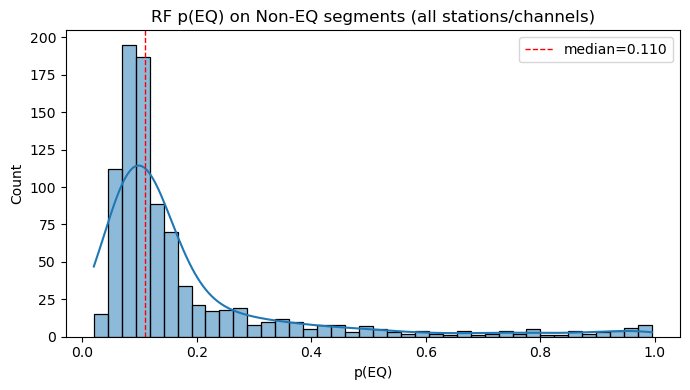

 Saved figure to: figures/non_eq_pEQ_hist.png


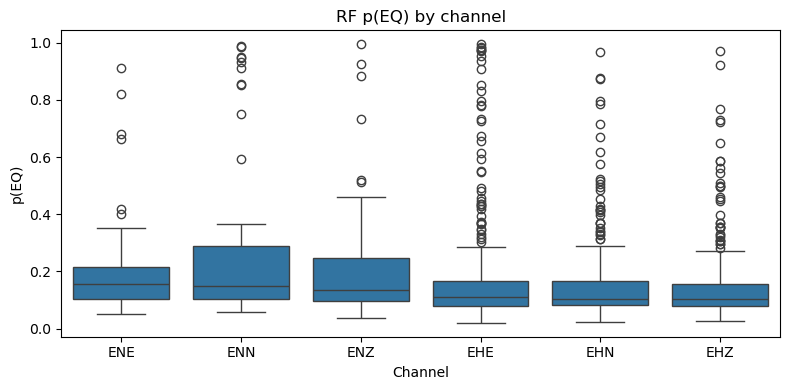

 Saved figure to: figures/non_eq_pEQ_by_channel.png

Per-channel counts:
channel
EHZ    288
EHE    240
EHN    240
ENE     48
ENN     48
ENZ     48


In [621]:
"""
This script persist the scored table and plot visuals
- Save CSV
- Histogram of p(EQ)
- Boxplot of p(EQ) by channel (sorted by median)
"""

md_non_eq.to_csv("non_eq_scored_rf.csv", index=False)
print("Saved: non_eq_scored_rf.csv  | shape:", md_non_eq.shape)

# Histogram: overall p(EQ) 
vals = md_non_eq["p_eq_rf"].dropna().values
med = np.median(vals)

plt.figure(figsize=(7,4))
sns.histplot(vals, bins=40, kde=True)
plt.axvline(med, color="red", ls="--", lw=1, label=f"median={med:.3f}")
plt.title("RF p(EQ) on Non-EQ segments (all stations/channels)")
plt.xlabel("p(EQ)")
plt.ylabel("Count")
plt.legend()
plt.tight_layout()
save_and_show("non_eq_pEQ_hist.png")

# Boxplot: p(EQ) by channel (sorted by median)
ch_order = (md_non_eq
            .dropna(subset=["p_eq_rf"])
            .groupby("channel")["p_eq_rf"]
            .median()
            .sort_values(ascending=False)
            .index.tolist())

plt.figure(figsize=(8,4))
sns.boxplot(data=md_non_eq, x="channel", y="p_eq_rf", order=ch_order)
plt.title("RF p(EQ) by channel")
plt.xlabel("Channel")
plt.ylabel("p(EQ)")
plt.tight_layout()
save_and_show("non_eq_pEQ_by_channel.png")

# per-channel counts 
print("\nPer-channel counts:")
print(md_non_eq["channel"].value_counts().to_string())

*Figure: RF p(EQ) by channel. Note that EH\* channels (n≈240–288 segments each) provide stable medians, while EN\* channels (n=48 each) have higher uncertainty due to much smaller sample sizes.*

### How RF `p(EQ)` was computed

**Pipeline**
1. **Segments**: Each `*_segments.npy` file has *N* non-EQ segments of length 500. Each row of `md_non_eq` represents one segment and stores its origin (`source_file`, `station`, `channel`, `seg_idx`, `seg_time`).
2. **Normalization**: Independently z-scored each segment: \((x-\mu)/\sigma\). This emphasizes shape rather than amplitude and matches training.
3. **Features via AE encoder**: Load `final_autoencoder_std.keras` and slice out the first two Dense layers (the bottleneck). Each 500-sample segment → **64-D latent** vector.
4. **Probability via Random Forest**: A trained RF (`rf_model.pkl`) takes the 64-D vector and returns **`p_eq_rf` = P(EQ)**. We align predictions back to the same rows in `md_non_eq`.

**How the probability is produced** - 
The Random Forest is an ensemble of many decision trees. Each tree is trained on labeled EQ vs non-EQ examples in the 64-D latent space. Every tree produces a vote for a new segment by calculating the ratio of EQ training samples in leaf where the segmeent falls. The RF averages these votes across all trees.     
- The result is a **probability score between 0 and 1**:
  - Values close to **0** = the RF is confident the segment looks non-EQ.  
  - Values close to **1** = the RF is confident the segment looks EQ-like.  
- This averaged probability is exactly what was stored as `p_eq_rf`.

**What the plots show**
- **Histogram of `p_eq_rf` (all segments)**: Most non-EQ segments have low EQ-probability (left-skewed); the red dashed line marks the median (≈0.11). The long right tail highlights segments the RF finds EQ-like.
- **Boxplot by channel**: Channels are ordered by median `p_eq_rf`. In the run, **EN\*** channels tend to have higher medians than **EH\*** channels (consistent with higher AE reconstruction error for EN\*).  
  *Note the counts are imbalanced (EHZ=288, EHE=240, EHN=240 vs ENE/ENN/ENZ=48 each), so EN\* medians have wider uncertainty.*

**To interpret**
- These summaries don’t claim real human-activity timing patterns (timestamps were not collected to represent local daily cycles).  
- They **do** provide a comparative view of how “EQ-like” each sensor component and station *appear to the classifier*, complementing the AE error analysis.

### Interpreting channel counts and uncertainty

**Per-channel counts**  
From the scored metadata, the number of non-EQ segments per channel type was:

- **EHZ** = 288 segments  
- **EHE** = 240 segments  
- **EHN** = 240 segments  
- **ENE** = 48 segments  
- **ENN** = 48 segments  
- **ENZ** = 48 segments  

Each “segment” is a 5-second slice of waveform. These counts reflect how many slices survived preprocessing and were scored by the Random Forest (`p_eq_rf`).

---

**Why lower counts means higher uncertainty**  
- With only **48 EN\*** segments, a few unusual ones (e.g., with high p(EQ)) can shift the median and spread quite strongly.  
- With **hundreds of EH\*** segments, the same effect is dampened: the median and distribution are much more stable.  
- Statistically, larger sample sizes give **narrower confidence intervals**, while small sample sizes give **wider uncertainty** around estimates like the median.

---

**Connection to the plots**  
- The **overall histogram** combined all 912 segments, so the distribution is well-supported.  
- The **boxplot by channel** separates them:  
  - EHZ, EHE, and EHN (n≈240–288 each) show stable distributions.  
  - ENE, ENN, and ENZ (n=48 each) show medians and spreads that may be less reliable, because they rest on much smaller sample sizes.

---

**What to takeaway from this**  
The differences that emerge between EN\* and EH\* channels require cautious interpretation. EH\* is good, EN\* is less certain because of the low number of segments.

##### RF p(EQ) Hour-of-day and weekday trends

In [777]:
# Local-time RF p(EQ) trends with split stations kept (R119F_a / R119F_b) 

from zoneinfo import ZoneInfo

# Map each base station (no _a/_b) to its IANA timezone
station_tz = {
    "R0CEC":  "Europe/London",       # UK
    "R119F":  "Europe/Berlin",       # Germany
    "R1906":  "Europe/Berlin",       # Germany
    "R3949":  "America/Mexico_City", # Mexico
    "R57CE":  "Asia/Colombo",        # Sri Lanka (UTC+5:30)
    "R5B93":  "America/New_York",    # USA (Eastern)
    "R7000":  "Africa/Cairo",        # Egypt
    "R76F0":  "Europe/London",       # UK
    "R9F13":  "Europe/Warsaw",       # Poland
    "RCC8D":  "Europe/Brussels",     # Belgium/NE France region
    "RD9D6":  "Europe/London",       # UK
}

# Build local-time fields without collapsing split stations
df = md_non_eq.copy()

# Ensure seg_time is timezone-aware UTC
# (seg_time is naive, we assume it's already in UTC and localize; if tz-aware, we convert to UTC.)
seg = pd.to_datetime(df["seg_time"], errors="coerce")
if getattr(seg.dt.tz, "key", None) is None:
    seg = seg.dt.tz_localize("UTC")
else:
    seg = seg.dt.tz_convert("UTC")
df["seg_time_utc"] = seg

# Base station for timezone lookup (strip "_a"/"_b" suffix)
df["base_station"] = df["station2"].str.replace(r"_(a|b)$", "", regex=True)

# Prepare columns for local fields
df["local_hour"] = np.nan
df["local_weekday"] = pd.Categorical(
    values=[np.nan]*len(df),
    categories=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"],
    ordered=True
)

# Per base station conversion 
for base in df["base_station"].dropna().unique():
    tzname = station_tz.get(base, "UTC")
    idx = df["base_station"] == base
    # Convert that subset to the station's local time
    ts_local = df.loc[idx, "seg_time_utc"].dt.tz_convert(ZoneInfo(tzname))
    df.loc[idx, "local_hour"] = ts_local.dt.hour.astype(float)
    df.loc[idx, "local_weekday"] = pd.Categorical(
        ts_local.dt.day_name(),
        categories=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"],
        ordered=True
    )

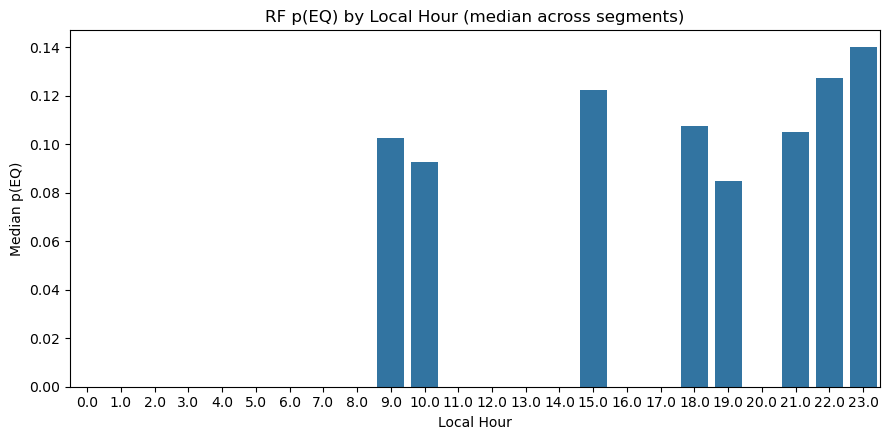

 Saved figure to: figures/rf_pEQ_by_local_hour.png


In [779]:
# Hour-of-day trend (median p(EQ) per local hour)
hourly = (df.dropna(subset=["local_hour","p_eq_rf"])
            .groupby("local_hour", as_index=False)["p_eq_rf"]
            .median()
            .rename(columns={"p_eq_rf":"median_pEQ"}))

# Make sure all 24 hours appear (even if missing)
all_hours = pd.DataFrame({"local_hour": np.arange(24, dtype=float)})
hourly = all_hours.merge(hourly, on="local_hour", how="left")

plt.figure(figsize=(9,4.5))
sns.barplot(data=hourly, x="local_hour", y="median_pEQ")
plt.title("RF p(EQ) by Local Hour (median across segments)")
plt.xlabel("Local Hour")
plt.ylabel("Median p(EQ)")
plt.tight_layout()
save_and_show("rf_pEQ_by_local_hour.png")

/var/folders/16/26q27jps42b4fpx1_sg178840000gn/T/ipykernel_65266/4182202303.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("local_weekday", as_index=False)["p_eq_rf"]


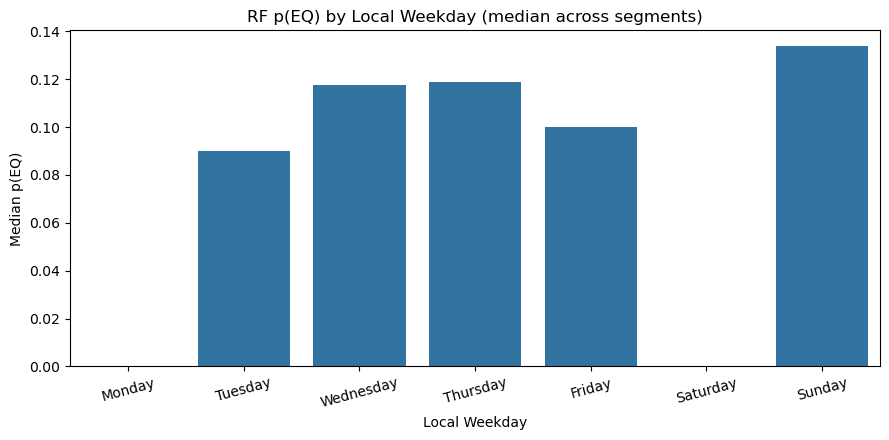

 Saved figure to: figures/rf_pEQ_by_local_weekday.png


In [781]:
# Weekday trend (median p(EQ) per local weekday)
weekday_order = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
wkd = (df.dropna(subset=["local_weekday","p_eq_rf"])
         .groupby("local_weekday", as_index=False)["p_eq_rf"]
         .median()
         .rename(columns={"p_eq_rf":"median_pEQ"})
         .sort_values("local_weekday"))

plt.figure(figsize=(9,4.5))
sns.barplot(data=wkd, x="local_weekday", y="median_pEQ", order=weekday_order)
plt.title("RF p(EQ) by Local Weekday (median across segments)")
plt.xlabel("Local Weekday")
plt.ylabel("Median p(EQ)")
plt.xticks(rotation=15)
plt.tight_layout()
save_and_show("rf_pEQ_by_local_weekday.png")

In [783]:
# Quick check
print("\nMedian p(EQ) by local hour:")
print(hourly.fillna({"median_pEQ": np.nan}).to_string(index=False))

print("\nMedian p(EQ) by local weekday:")
print(wkd.to_string(index=False))


Median p(EQ) by local hour:
 local_hour  median_pEQ
        0.0         NaN
        1.0         NaN
        2.0         NaN
        3.0         NaN
        4.0         NaN
        5.0         NaN
        6.0         NaN
        7.0         NaN
        8.0         NaN
        9.0      0.1025
       10.0      0.0925
       11.0         NaN
       12.0         NaN
       13.0         NaN
       14.0         NaN
       15.0      0.1225
       16.0         NaN
       17.0         NaN
       18.0      0.1075
       19.0      0.0850
       20.0         NaN
       21.0      0.1050
       22.0      0.1275
       23.0      0.1400

Median p(EQ) by local weekday:
local_weekday  median_pEQ
       Monday         NaN
      Tuesday     0.09000
    Wednesday     0.11750
     Thursday     0.11875
       Friday     0.10000
     Saturday         NaN
       Sunday     0.13375


##### Per-station dsitribution box plots

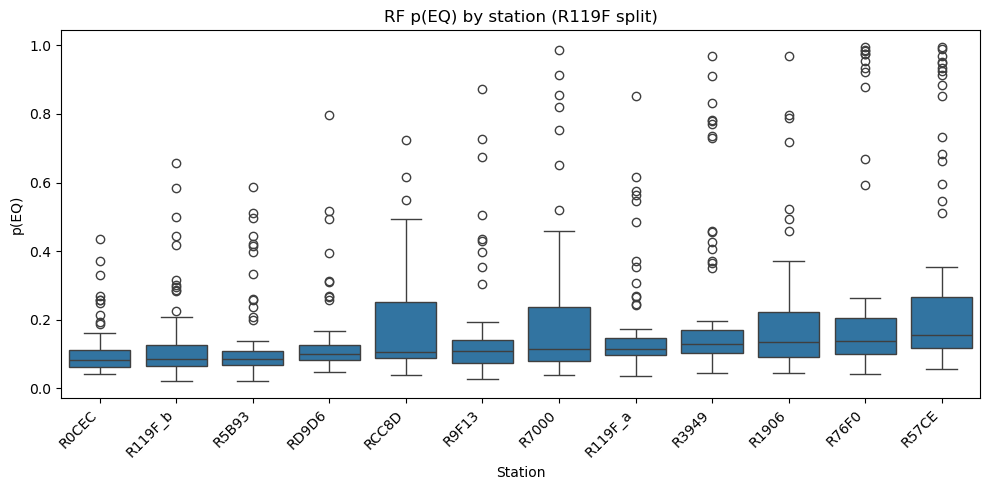

 Saved figure to: figures/non_eq_pEQ_by_station_.png
Per-station counts:
 station2
R0CEC      72
R119F_a    72
R119F_b    72
R1906      72
R3949      72
R57CE      96
R5B93      72
R7000      96
R76F0      72
R9F13      72
RCC8D      72
RD9D6      72


In [662]:
"""
Per-station diagnostics:
- Boxplot of p(EQ) per station
- Count of segments per station (helps interpret box widths/outliers)
"""
plt.figure(figsize=(10,5))
order = md_non_eq.groupby("station2")["p_eq_rf"].median().sort_values().index
sns.boxplot(data=md_non_eq, x="station2", y="p_eq_rf", order=order)
plt.title("RF p(EQ) by station (R119F split)")
plt.xlabel("Station"); plt.ylabel("p(EQ)")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
save_and_show("non_eq_pEQ_by_station_.png")

print("Per-station counts:\n", md_non_eq["station2"].value_counts().sort_index().to_string())

##### Top-scoring segments table (From waveform list)

In [664]:
"""
Top-scoring non-EQ segments by RF probability.
Keep columns needed to locate the segment in the file.
"""
topN = 40  
cols = ["p_eq_rf","station2","channel","source_file","seg_idx","seg_time"]
top_hits = (md_non_eq.sort_values("p_eq_rf", ascending=False)
                      .loc[:, cols]
                      .head(topN)
                      .reset_index(drop=True))
print(top_hits.to_string(index=False))
top_hits.to_csv("top_nonEQ_segments_by_RF.csv", index=False)
print("Saved: top_nonEQ_segments_by_RF.csv")

 p_eq_rf station2 channel                                     source_file  seg_idx            seg_time
  0.9950    R76F0     EHE         R76F0_EQ_trimmed_10min_EHE_segments.npy       17 2023-05-24 22:29:45
  0.9950    R57CE     ENZ R57CE_EQ_20240918T101939_10min_ENZ_segments.npy       11 2024-09-18 10:24:14
  0.9900    R57CE     ENN R57CE_EQ_20240918T101939_10min_ENN_segments.npy       22 2024-09-18 10:28:49
  0.9850    R76F0     EHE         R76F0_EQ_trimmed_10min_EHE_segments.npy        6 2023-05-24 22:25:10
  0.9850    R7000     ENN R7000_EQ_20250528T124439_10min_ENN_segments.npy        9 2025-05-28 12:48:24
  0.9825    R76F0     EHE         R76F0_EQ_trimmed_10min_EHE_segments.npy       21 2023-05-24 22:31:25
  0.9750    R76F0     EHE         R76F0_EQ_trimmed_10min_EHE_segments.npy       16 2023-05-24 22:29:20
  0.9750    R76F0     EHE         R76F0_EQ_trimmed_10min_EHE_segments.npy        0 2023-05-24 22:22:40
  0.9700    R3949     EHE R3949_EQ_20230721T031559_10min_EHE_segments.npy

##### Derive hour/weekday once

In [639]:
# Per-station temporal prep
df_time = md_non_eq.copy()

# Keep rows that have segment timestamps
df_time = df_time[pd.notna(df_time["seg_time"])].copy()

# Derive hour & weekday
df_time["hour"] = df_time["seg_time"].dt.hour
weekday_order = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
df_time["weekday"] = pd.Categorical(df_time["seg_time"].dt.day_name(),categories=weekday_order, ordered=True)

stations = sorted(df_time["station"].unique())
print(f"{len(stations)} stations with timestamps:", stations)

11 stations with timestamps: ['R0CEC', 'R119F', 'R1906', 'R3949', 'R57CE', 'R5B93', 'R7000', 'R76F0', 'R9F13', 'RCC8D', 'RD9D6']


##### split station R119F to its two waveforms (R119F was the non-eq station that gave two waveform data)

In [647]:
# build a split station label: station2
df_time = md_non_eq.copy()

# create a base -> pseudo-station mapping just for the two R119F bases
r119f_map = {
    "R119F_EQ_20230921T132653_10min": "R119F_a",
    "R119F_EQ_20231017T080517_10min": "R119F_b",
}

# start with the original station label
df_time["station2"] = df_time["station"]

# overwrite just those rows where base matches one of the two R119F bases
mask_r119f = df_time["station"].eq("R119F") & df_time["base"].isin(r119f_map.keys())
df_time.loc[mask_r119f, "station2"] = df_time.loc[mask_r119f, "base"].map(r119f_map)

# derive hour/weekday (keep only rows with timestamps)
df_time = df_time[pd.notna(df_time["seg_time"])].copy()
df_time["hour"] = df_time["seg_time"].dt.hour
weekday_order = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
df_time["weekday"] = pd.Categorical(df_time["seg_time"].dt.day_name(),
                                    categories=weekday_order, ordered=True)

print("Unique stations:", sorted(df_time["station"].unique()))
print("Unique pseudo-stations:", sorted(df_time["station2"].unique()))

Unique stations: ['R0CEC', 'R119F', 'R1906', 'R3949', 'R57CE', 'R5B93', 'R7000', 'R76F0', 'R9F13', 'RCC8D', 'RD9D6']
Unique pseudo-stations: ['R0CEC', 'R119F_a', 'R119F_b', 'R1906', 'R3949', 'R57CE', 'R5B93', 'R7000', 'R76F0', 'R9F13', 'RCC8D', 'RD9D6']


In [660]:
# add station2 to md_non_eq (split R119F into two pseudo stations)
r119f_map = {
    "R119F_EQ_20230921T132653_10min": "R119F_a",
    "R119F_EQ_20231017T080517_10min": "R119F_b",
}

md_non_eq = md_non_eq.copy()
md_non_eq["station2"] = md_non_eq["station"]  # default: same as station

mask = md_non_eq["station"].eq("R119F") & md_non_eq["base"].isin(r119f_map)
md_non_eq.loc[mask, "station2"] = md_non_eq.loc[mask, "base"].map(r119f_map)

print("Unique station2 values:", sorted(md_non_eq["station2"].unique()))

Unique station2 values: ['R0CEC', 'R119F_a', 'R119F_b', 'R1906', 'R3949', 'R57CE', 'R5B93', 'R7000', 'R76F0', 'R9F13', 'RCC8D', 'RD9D6']


##### Station × Channel heatmap (which stations/channels run “EQ-like”)

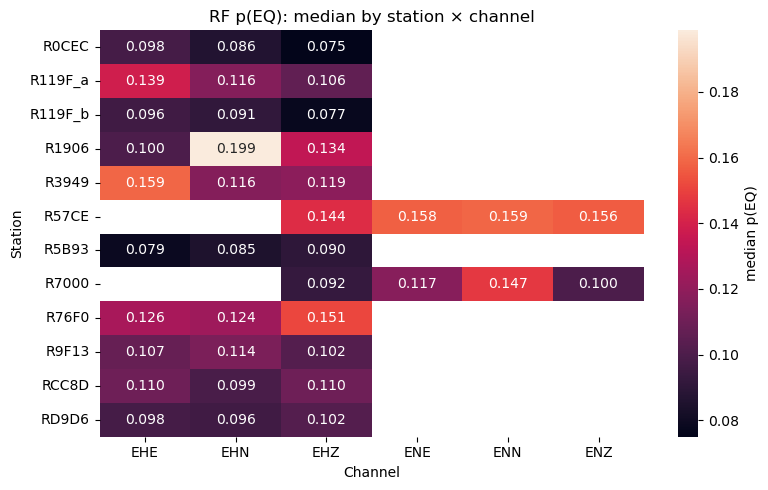

 Saved figure to: figures/non_eq_pEQ_station_by_channel_heatmap.png


In [666]:
# median p(EQ) by station and channel
pivot = (md_non_eq
         .groupby(["station2","channel"])["p_eq_rf"]
         .median().unstack("channel"))

plt.figure(figsize=(8,5))
sns.heatmap(pivot, annot=True, fmt=".3f", cbar_kws={"label":"median p(EQ)"})
plt.title("RF p(EQ): median by station × channel")
plt.xlabel("Channel"); plt.ylabel("Station")
plt.tight_layout()
save_and_show("non_eq_pEQ_station_by_channel_heatmap.png")

*Figure: Median RF p(EQ) by station × channel. Each cell shows the median probability that non-EQ segments from a given station and channel were classified as EQ-like. Darker cells (lower medians) indicate segments that consistently looked non-EQ, while lighter/redder cells (higher medians) highlight channels or stations where non-EQ segments more often appeared EQ-like. This provides a comparative fingerprint across the network, though note that EN\* values are based on fewer segments (n=48 per channel) and thus less stable.*

##### Station ECDFs (Empirical Cumulative Distribution Function) of p(EQ). (shape comparison without bins)

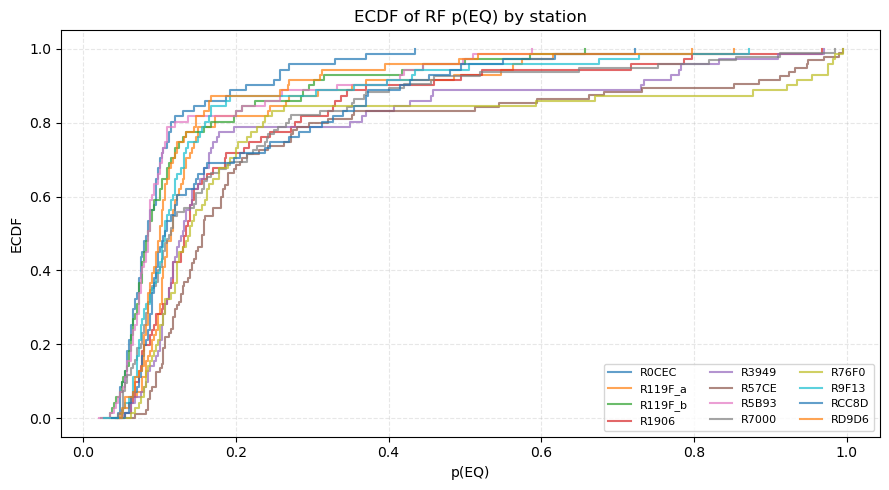

 Saved figure to: figures/non_eq_pEQ_ecdf_by_station.png


In [668]:
plt.figure(figsize=(9,5))
for s, g in md_non_eq.groupby("station2"):
    x = np.sort(g["p_eq_rf"].values)
    y = np.linspace(0,1,len(x),endpoint=True)
    plt.step(x, y, where="post", alpha=0.7, label=s)

plt.title("ECDF of RF p(EQ) by station")
plt.xlabel("p(EQ)"); plt.ylabel("ECDF")
plt.legend(ncol=3, fontsize=8, frameon=True)
plt.grid(ls="--", alpha=0.3)
plt.tight_layout()
save_and_show("non_eq_pEQ_ecdf_by_station.png")

##### Top segments per station (from waveforms)

In [670]:
# top-N segments per station2
N = 10
top_by_station = (md_non_eq
                  .sort_values("p_eq_rf", ascending=False)
                  .groupby("station2")
                  .head(N)
                  .sort_values(["station2","p_eq_rf"], ascending=[True,False]))

cols = ["station2","channel","p_eq_rf","source_file","seg_idx","seg_time"]
top_by_station[cols].to_csv("top_segments_per_station.csv", index=False)
print("Saved: top_segments_per_station.csv")
top_by_station[cols].head(15)

Saved: top_segments_per_station.csv


,station2,channel,p_eq_rf,source_file,seg_idx,seg_time
259,R0CEC,EHE,0.4350,R0CEC_EQ_trimmed_10min_EHE_segments.npy,19,2024-04-10 20:34:06
279,R0CEC,EHN,0.3700,R0CEC_EQ_trimmed_10min_EHN_segments.npy,15,2024-04-10 20:32:26
284,R0CEC,EHN,0.3300,R0CEC_EQ_trimmed_10min_EHN_segments.npy,20,2024-04-10 20:34:31
217,R0CEC,EHZ,0.2700,R0CEC_EQ_trimmed_10min_EHZ_segments.npy,1,2024-04-10 20:26:36
248,R0CEC,EHE,0.2575,R0CEC_EQ_trimmed_10min_EHE_segments.npy,8,2024-04-10 20:29:31
238,R0CEC,EHZ,0.2575,R0CEC_EQ_trimmed_10min_EHZ_segments.npy,22,2024-04-10 20:35:21
273,R0CEC,EHN,0.2500,R0CEC_EQ_trimmed_10min_EHN_segments.npy,9,2024-04-10 20:29:56
242,R0CEC,EHE,0.2125,R0CEC_EQ_trimmed_10min_EHE_segments.npy,2,2024-04-10 20:27:01
254,R0CEC,EHE,0.1925,R0CEC_EQ_trimmed_10min_EHE_segments.npy,14,2024-04-10 20:32:01
271,R0CEC,EHN,0.1875,R0CEC_EQ_trimmed_10min_EHN_segments.npy,7,2024-04-10 20:29:06


##### Informative ECDF

Saved: ecdf_station_summary.csv


,station2,N,median_pEQ,frac_<=0.10,frac_<=0.20
5,R57CE,96,0.15625,0.145833,0.687500
8,R76F0,72,0.13875,0.263889,0.736111
3,R1906,72,0.13375,0.291667,0.722222
4,R3949,72,0.12875,0.222222,0.791667
1,R119F_a,72,0.11500,0.319444,0.819444
7,R7000,96,0.11375,0.416667,0.697917
9,R9F13,72,0.10750,0.430556,0.875000
10,RCC8D,72,0.10625,0.472222,0.708333
11,RD9D6,72,0.10000,0.527778,0.875000
2,R119F_b,72,0.08500,0.625000,0.833333


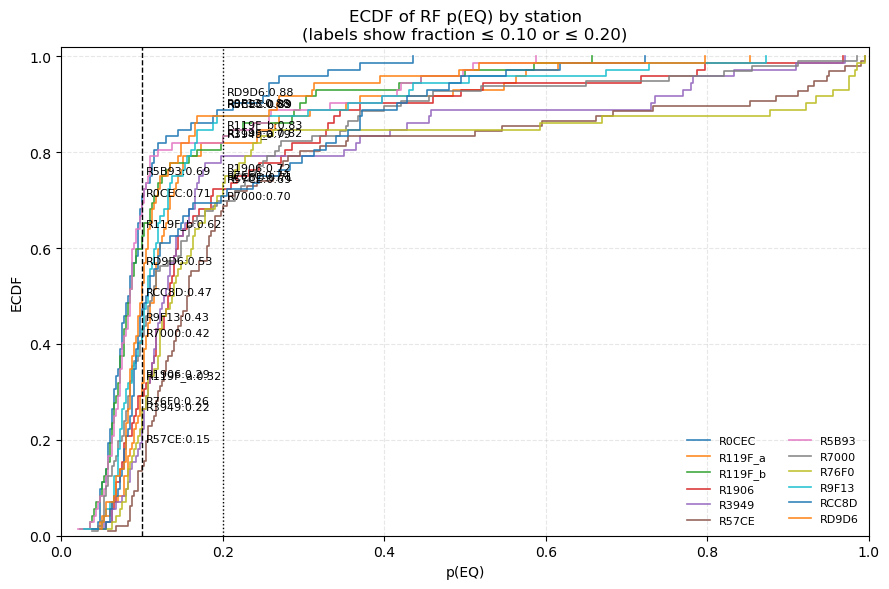

 Saved figure to: figures/non_eq_pEQ_ecdf_by_station_annotated.png
Saved: station_medians.csv


,station2,median_pEQ
0,R57CE,0.15625
1,R76F0,0.13875
2,R1906,0.13375
3,R3949,0.12875
4,R119F_a,0.11500
5,R7000,0.11375
6,R9F13,0.10750
7,RCC8D,0.10625
8,RD9D6,0.10000
9,R119F_b,0.08500


In [677]:
"""
ECDF per station with numeric call-outs at p(EQ)=0.10 and 0.20.
Also saves a compact summary table: N, median p(EQ), frac<=0.10, frac<=0.20.
"""

from collections import defaultdict

df = md_non_eq.dropna(subset=["p_eq_rf", "station2"]).copy()

# Per-station ECDF data + summary
ecdf_data = {}
rows = []
for sta, g in df.groupby("station2"):
    x = np.sort(g["p_eq_rf"].values)
    y = np.arange(1, len(x)+1) / len(x)
    ecdf_data[sta] = (x, y)
    frac_010 = (x <= 0.10).mean()
    frac_020 = (x <= 0.20).mean()
    rows.append({
        "station2": sta,
        "N": len(x),
        "median_pEQ": np.median(x),
        "frac_<=0.10": frac_010,
        "frac_<=0.20": frac_020
    })

tbl = pd.DataFrame(rows).sort_values("median_pEQ", ascending=False)
tbl.to_csv("ecdf_station_summary.csv", index=False)
print("Saved: ecdf_station_summary.csv")
display(tbl.head(12)) 

# Plot ECDFs
plt.figure(figsize=(9,6))
for sta, (x, y) in ecdf_data.items():
    plt.step(x, y, where="post", linewidth=1.2, alpha=0.9, label=sta)

# Vertical thresholds
for t, ls in [(0.10, "--"), (0.20, ":")]:
    plt.axvline(t, color="k", lw=1, ls=ls)
    # Annotate each station's fraction at this threshold (jitter y to reduce overlap)
    for i, (sta, (x, y)) in enumerate(ecdf_data.items()):
        frac = (x <= t).mean()
        # find y position on the ECDF near x=t
        yi = np.interp(t, x, y, left=0, right=1)
        jitter = (i % 7) * 0.01  # tiny vertical spread so labels don't stack
        plt.text(t + 0.005, min(yi + jitter, 0.995), f"{sta}:{frac:.2f}", fontsize=8)

plt.xlim(0, 1); plt.ylim(0, 1.02)
plt.xlabel("p(EQ)"); plt.ylabel("ECDF")
plt.title("ECDF of RF p(EQ) by station\n(labels show fraction ≤ 0.10 or ≤ 0.20)")
plt.legend(ncol=2, fontsize=8, frameon=False, loc="lower right")
plt.grid(True, ls="--", alpha=0.3)
plt.tight_layout()
save_and_show("non_eq_pEQ_ecdf_by_station_annotated.png")

# Also export a tidy table of station medians for quick reference
med_table = (df.groupby("station2")["p_eq_rf"]
               .median()
               .sort_values(ascending=False)
               .reset_index()
               .rename(columns={"p_eq_rf":"median_pEQ"}))
med_table.to_csv("station_medians.csv", index=False)
print("Saved: station_medians.csv")
display(med_table)

#### ECDF of RF p(EQ) by Station

The empirical cumulative distribution function (ECDF) was used to examine how the Random Forest classifier assigned earthquake-like probabilities, *p(EQ)*, to non-earthquake segments across stations.  

- For each station, the ECDF curve shows the distribution of classifier scores, while summary tables report the median *p(EQ)* and the fractions of segments below key thresholds (≤0.10 and ≤0.20).  
- Together, these provide a comparative view of how “EQ-like” each station’s non-earthquake data appeared to the classifier.  

**Limitations:**  
Because the non-earthquake dataset was constructed from short trimmed windows rather than continuous, balanced sampling, the ECDF cannot be taken as a true measure of physical station behavior.  

**Value and future direction:**  
Despite these limits, the ECDF results highlight how the classifier currently *perceives* each station’s non-earthquake signals. In future work, repeating this analysis on a fully balanced EQ vs non-EQ dataset would provide a genuine comparative fingerprint of station tendencies, showing which environments or sensor types most often produce earthquake-like signals.  

##### Non-EQ Station Map Telling a Story

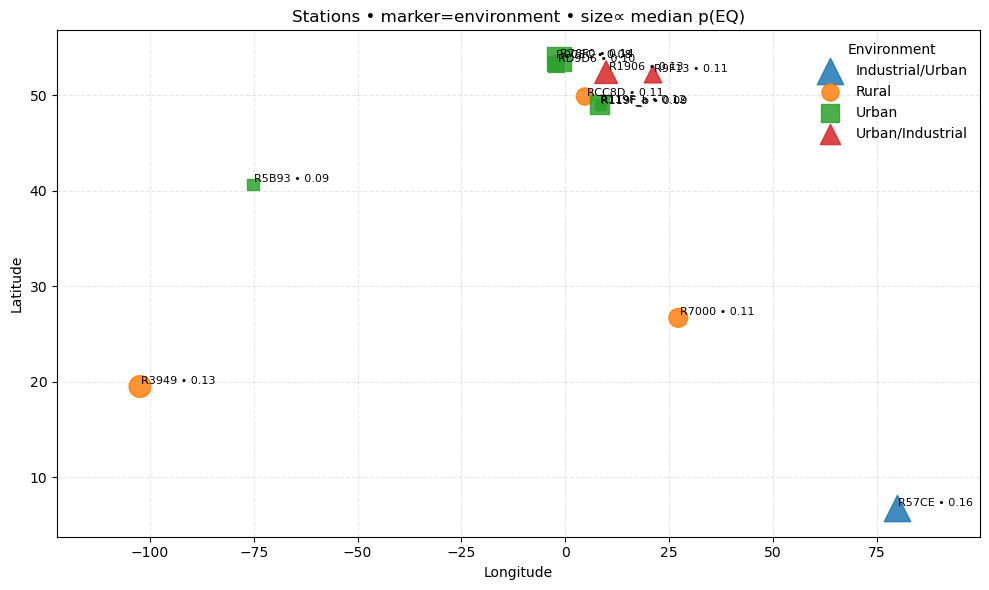

 Saved figure to: figures/non_eq_station_map_pEQ.png
Saved: station_map_table.csv


In [689]:
"""
Station map:
- shape encodes Env
- point size encodes median p(EQ) per station2
- label = station2 • med
"""

# your metadata
stations = [
    {"Station": "RCC8D", "Lat": 49.87387, "Lon": 4.73945,  "Env": "Rural"},
    {"Station": "RD9D6", "Lat": 53.26126, "Lon": -2.15416, "Env": "Urban"},
    {"Station": "R76F0", "Lat": 53.80180, "Lon": -1.54084, "Env": "Urban"},
    {"Station": "R0CEC", "Lat": 53.63964, "Lon": -2.49214, "Env": "Rural"},
    {"Station": "R5B93", "Lat": 40.69369, "Lon": -75.20585,"Env": "Urban"},
    {"Station": "R119F", "Lat": 49.01802, "Lon": 8.42088,  "Env": "Urban"},
    {"Station": "R1906", "Lat": 52.43243, "Lon": 9.84227,  "Env": "Urban/Industrial"},
    {"Station": "R3949", "Lat": 19.51351, "Lon": -102.41833,"Env": "Rural"},
    {"Station": "R9F13", "Lat": 52.21622, "Lon": 21.13200, "Env": "Urban/Industrial"},
    {"Station": "R7000", "Lat": 26.70270, "Lon": 27.22909, "Env": "Rural"},
    {"Station": "R57CE", "Lat": 6.79279,  "Lon": 79.89492, "Env": "Industrial/Urban"},
]
df_meta = pd.DataFrame(stations)

# Median p(EQ) per station
med = (md_non_eq
       .dropna(subset=["p_eq_rf","station2"])
       .groupby("station2")["p_eq_rf"]
       .median()
       .reset_index()
       .rename(columns={"p_eq_rf":"median_pEQ"}))

# Map station → base station (drop _a/_b suffix if present)
med["Station"] = med["station2"].str.replace(r"_(a|b)$", "", regex=True)

# Merge coords/env
m = med.merge(df_meta, on="Station", how="left")

# Nudge overlapping split points (R119F_a / R119F_b) slightly in lon
def nudge_lon(row):
    if row["station2"].endswith("_a"):
        return row["Lon"] - 0.08
    if row["station2"].endswith("_b"):
        return row["Lon"] + 0.08
    return row["Lon"]
m["Lon_n"] = m.apply(nudge_lon, axis=1)

# Marker shape per environment
shape_map = {
    "Urban": "s",
    "Rural": "o",
    "Urban/Industrial": "^",
    "Industrial/Urban": "^",   # treat same
}
m["marker"] = m["Env"].map(shape_map).fillna("o")

# Scale size by median p(EQ)
smin, smax = 60, 360
pmin, pmax = m["median_pEQ"].min(), m["median_pEQ"].max()
m["sz"] = smin + (m["median_pEQ"]-pmin)/(pmax-pmin + 1e-9)*(smax-smin)

# Compute padded axis limits so nothing is clipped 
pad_x = 20.0   # degrees lon padding
pad_y = 3.0   # degrees lat padding
xmin, xmax = m["Lon_n"].min() - pad_x, m["Lon_n"].max() + pad_x
ymin, ymax = m["Lat"].min()  - pad_y, m["Lat"].max()  + pad_y

plt.figure(figsize=(10,6))

# Plot by environment (marker encodes Env)
for env, g in m.groupby("Env"):
    mk = g["marker"].iloc[0]
    plt.scatter(g["Lon_n"], g["Lat"], s=g["sz"], marker=mk, alpha=0.85, label=env)

# Light jitter for labels inside dense cluster 
def jitter_xy(row):
    x, y = row["Lon_n"], row["Lat"]
    if (0 <= x <= 15) and (48 <= y <= 55):
        x = x + np.random.uniform(-0.35, 0.35)
        y = y + np.random.uniform(-0.25, 0.25)
    return x, y

for _, r in m.iterrows():
    lx, ly = jitter_xy(r)
    plt.text(lx + 0.3, ly + 0.25, f"{r['station2']} • {r['median_pEQ']:.2f}", fontsize=8)

plt.title("Stations • marker=environment • size∝ median p(EQ)")
plt.xlabel("Longitude"); plt.ylabel("Latitude")
plt.xlim(xmin, xmax); plt.ylim(ymin, ymax)
plt.grid(True, ls="--", alpha=0.3)
plt.legend(title="Environment", frameon=False, loc="best")
plt.tight_layout()
save_and_show("non_eq_station_map_pEQ.png")


# Also save table used for the map
m[["station2","Station","Env","Lat","Lon_n","median_pEQ"]].to_csv("station_map_table.csv", index=False)
print("Saved: station_map_table.csv")

##### Companion table with symbols + scores

In [692]:
# Symbol legend for the environments (matches markers in the plot)
env_symbol = {
    "Urban": "■",              # square
    "Rural": "●",              # circle
    "Urban/Industrial": "▲",   # triangle
    "Industrial/Urban": "▲",   # triangle
}

pretty = (m[["station2","Station","Env","Lat","Lon_n","median_pEQ"]]
          .rename(columns={"Lon_n":"Lon"}).copy())

pretty["Symbol"] = pretty["Env"].map(env_symbol).fillna("●")
pretty = pretty.sort_values(["Env","median_pEQ"], ascending=[True, False])

# Save and show
pretty[["Symbol","station2","Env","Lat","Lon","median_pEQ"]].to_csv(
    "station_symbol_scores_table.csv", index=False
)
print("Saved: station_symbol_scores_table.csv")

# Quick view
print(pretty[["Symbol","station2","Env","median_pEQ"]]
      .to_string(index=False, formatters={"median_pEQ":lambda v: f"{v:.3f}"}))

Saved: station_symbol_scores_table.csv
Symbol station2              Env median_pEQ
     ▲    R57CE Industrial/Urban      0.156
     ●    R3949            Rural      0.129
     ●    R7000            Rural      0.114
     ●    RCC8D            Rural      0.106
     ●    R0CEC            Rural      0.084
     ■    R76F0            Urban      0.139
     ■  R119F_a            Urban      0.115
     ■    RD9D6            Urban      0.100
     ■  R119F_b            Urban      0.085
     ■    R5B93            Urban      0.085
     ▲    R1906 Urban/Industrial      0.134
     ▲    R9F13 Urban/Industrial      0.107


It can be concluded from thse analysis that industrial areas or mixed urban industrail areas produces waveforms that the RF classifier considers more EQ like, compared to rural station. 

#### ================================
#### Top EQ-like segments (from RF) → trace Station / Channel / Environment
#### ================================

In [865]:
import pandas as pd
import numpy as np
import os

# REQUIRED INPUTS
# scored non-EQ metadata with RF probabilities
# Required columns: source_file, station2 (or station), channel, seg_idx, seg_time, p_eq_rf
df = md_non_eq.copy()

# station metadata (Station, Env)
#  E.g:
# stations = [
#     {"Station": "RCC8D", "Env": "Rural"},
#     {"Station": "RD9D6", "Env": "Urban"},
#     ...
# ]
df_stn = pd.DataFrame(stations)

# Make a clean Station + Env on df
# Split  IDs like R119F_a / R119F_b are present, keep them for reporting,
# but map environment using the base code before the underscore.
def base_code(s):
    s = str(s)
    return s.split("_")[0]

df["station2"] = df.get("station2", df.get("station"))
df["StationBase"] = df["station2"].apply(base_code)

env_map = dict(zip(df_stn["Station"], df_stn["Env"]))
df["Env"] = df["StationBase"].map(env_map)

# Channel family (EN* vs EH*) for a quick sensor-type view
df["ChanFamily"] = np.where(df["channel"].str.startswith("EN"), "EN*", "EH*")

# Drop rows without probability or env (for safety)
df = df.dropna(subset=["p_eq_rf", "Env", "channel", "station2"])

# Pick the “top EQ-like” segments 
top_segments = (df.sort_values("p_eq_rf", ascending=False)
                  .reset_index(drop=True))

cols_to_show = ["p_eq_rf","station2","StationBase","Env","channel","ChanFamily",
                "source_file","seg_idx","seg_time"]
print("Top EQ-like non-EQ segments (by RF p(EQ)):\n")
print(top_segments[cols_to_show].to_string(index=False))

# Save
top_segments[cols_to_show].to_csv("top_EQlike_segments_RF.csv", index=False)
print("\nSaved: top_EQlike_segments_RF.csv")

Top EQ-like non-EQ segments (by RF p(EQ)):

 p_eq_rf station2 StationBase              Env channel ChanFamily                                     source_file  seg_idx            seg_time
  0.9950    R76F0       R76F0            Urban     EHE        EH*         R76F0_EQ_trimmed_10min_EHE_segments.npy       17 2023-05-24 22:29:45
  0.9950    R57CE       R57CE Industrial/Urban     ENZ        EN* R57CE_EQ_20240918T101939_10min_ENZ_segments.npy       11 2024-09-18 10:24:14
  0.9900    R57CE       R57CE Industrial/Urban     ENN        EN* R57CE_EQ_20240918T101939_10min_ENN_segments.npy       22 2024-09-18 10:28:49
  0.9850    R76F0       R76F0            Urban     EHE        EH*         R76F0_EQ_trimmed_10min_EHE_segments.npy        6 2023-05-24 22:25:10
  0.9850    R7000       R7000            Rural     ENN        EN* R7000_EQ_20250528T124439_10min_ENN_segments.npy        9 2025-05-28 12:48:24
  0.9825    R76F0       R76F0            Urban     EHE        EH*         R76F0_EQ_trimmed_10min_E

In [873]:
# Who contributes more among these "EQ-like" segments?
# Compare composition of the sorted table vs the full pool, to see over/under-representation

def comp_table(key):
    all_counts = df[key].value_counts().rename("all_count")
    top_counts = top_segments[key].value_counts().rename("top_count")
    out = (pd.concat([all_counts, top_counts], axis=1)
             .fillna(0)
             .assign(all_share=lambda t: t["all_count"]/t["all_count"].sum(),
                     top_share=lambda t: t["top_count"]/t["top_count"].sum(),
                     lift=lambda t: t["top_share"] - t["all_share"])
             .sort_values("top_share", ascending=False))
    return out

env_comp   = comp_table("Env")
chan_comp  = comp_table("channel")
family_comp= comp_table("ChanFamily")

print("\nContribution among TOP_Segment by Environment (share and lift vs baseline):")
print(env_comp.to_string())

print("\nContribution among TOP_Segment by Channel (share and lift vs baseline):")
print(chan_comp.to_string())

print("\nContribution among TOP_Segment by Channel Family (EN* vs EH*):")
print(family_comp.to_string())


Contribution among TOP_Segment by Environment (share and lift vs baseline):
                  all_count  top_count  all_share  top_share  lift
Env                                                               
Urban                   360        360   0.394737   0.394737   0.0
Rural                   312        312   0.342105   0.342105   0.0
Urban/Industrial        144        144   0.157895   0.157895   0.0
Industrial/Urban         96         96   0.105263   0.105263   0.0

Contribution among TOP_Segment by Channel (share and lift vs baseline):
         all_count  top_count  all_share  top_share  lift
channel                                                  
EHZ            288        288   0.315789   0.315789   0.0
EHE            240        240   0.263158   0.263158   0.0
EHN            240        240   0.263158   0.263158   0.0
ENE             48         48   0.052632   0.052632   0.0
ENN             48         48   0.052632   0.052632   0.0
ENZ             48         48   0.052632  


Saved figures to: figures/top_EQlike_share_by_*.png


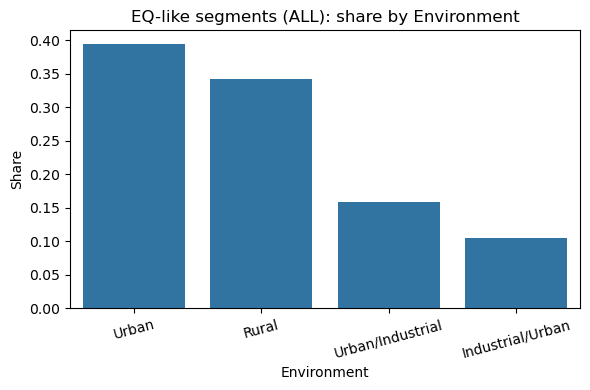

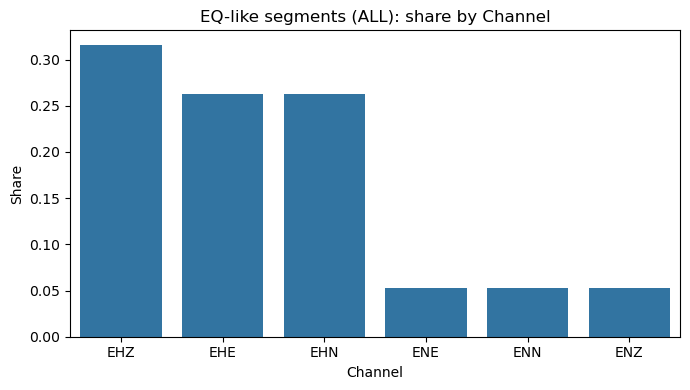

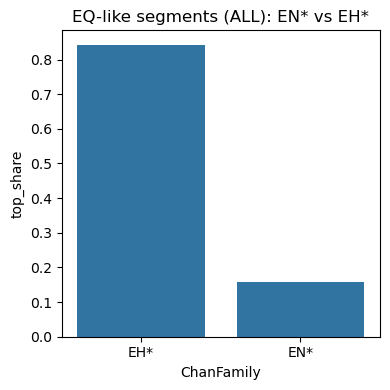

In [869]:
# quick plots 

plt.figure(figsize=(6,4))
sns.barplot(x=env_comp.index, y=env_comp["top_share"])
plt.title("EQ-like segments (ALL): share by Environment")
plt.ylabel("Share"); plt.xlabel("Environment"); plt.xticks(rotation=15)
plt.tight_layout(); plt.savefig("figures/top_EQlike_share_by_env.png", dpi=160)

plt.figure(figsize=(7,4))
sns.barplot(x=chan_comp.index, y=chan_comp["top_share"])
plt.title("EQ-like segments (ALL): share by Channel")
plt.ylabel("Share"); plt.xlabel("Channel")
plt.tight_layout(); plt.savefig("figures/top_EQlike_share_by_channel.png", dpi=160)

plt.figure(figsize=(4,4))
sns.barplot(x=family_comp.index, y=family_comp["top_share"])
plt.title("EQ-like segments (ALL): EN* vs EH*")
plt.title("EQ-like segments (ALL): EN* vs EH*")
plt.tight_layout(); plt.savefig("figures/top_EQlike_share_by_family.png", dpi=160)

print("\nSaved figures to: figures/top_EQlike_share_by_*.png")

#### Contribution of EQ-like Segments Across Environments and Channels

Urban stations contributed the largest share of EQ-like non-EQ segments (~39.5%), followed by rural (~34.2%). Mixed industrial/urban sites were less common. The vertical EHZ channel dominated, with EHE and EHN close behind. Overall, EH* channels (≈84%) far outweighed EN* channels, reflecting the classifier’s channel sensitivity.

#### AE analysis

In [717]:
from tensorflow.keras.models import load_model

# Paths
ae_path     = "final_autoencoder_std.keras"  # trained autoencoder

# Station metadata (with environment + components)
stations = [
    {"Station": "RCC8D", "Lat": 49.87387, "Lon":   4.73945,  "Env": "Rural",             "Components": ["EHZ","EHE","EHN"]},
    {"Station": "RD9D6", "Lat": 53.26126, "Lon":  -2.15416,  "Env": "Urban",             "Components": ["EHZ","EHE","EHN"]},
    {"Station": "R76F0", "Lat": 53.80180, "Lon":  -1.54084,  "Env": "Urban",             "Components": ["EHZ","EHE","EHN"]},
    {"Station": "R0CEC", "Lat": 53.63964, "Lon":  -2.49214,  "Env": "Rural",             "Components": ["EHZ","EHE","EHN"]},
    {"Station": "R5B93", "Lat": 40.69369, "Lon": -75.20585,  "Env": "Urban",             "Components": ["EHZ","EHE","EHN"]},
    {"Station": "R119F", "Lat": 49.01802, "Lon":   8.42088,  "Env": "Urban",             "Components": ["EHZ","EHE","EHN"]},
    {"Station": "R1906", "Lat": 52.43243, "Lon":   9.84227,  "Env": "Urban/Industrial",  "Components": ["EHZ","EHE","EHN"]},
    {"Station": "R3949", "Lat": 19.51351, "Lon": -102.41833, "Env": "Rural",             "Components": ["EHZ","EHE","EHN"]},
    {"Station": "R9F13", "Lat": 52.21622, "Lon":  21.13200,  "Env": "Urban/Industrial",  "Components": ["EHZ","EHE","EHN"]},
    {"Station": "R7000", "Lat": 26.70270, "Lon":  27.22909,  "Env": "Rural",             "Components": ["EHZ","ENE","ENN","ENZ"]},  # 4D
    {"Station": "R57CE", "Lat":  6.79279, "Lon":  79.89492,  "Env": "Industrial/Urban",  "Components": ["EHZ","ENE","ENN","ENZ"]},  # 4D
]
df_stations = pd.DataFrame(stations)

# Per-segment z-score (keeps shape, removes level)
def per_segment_z(x500: np.ndarray) -> np.ndarray:
    assert x500.ndim == 2 and x500.shape[1] == 500, "Expected (N, 500)."
    m = x500.mean(axis=1, keepdims=True)
    s = x500.std(axis=1, keepdims=True) + 1e-8
    return (x500 - m) / s

##### Load the autoencoder and discover files

In [715]:
# Load AE
ae = load_model(ae_path, compile=False)
print("Loaded AE:", ae_path)

# Build df_files from md_non_eq
files_ne = sorted(md_non_eq["source_file"].unique().tolist())
print(f"Using {len(files_ne)} non-EQ files from md_non_eq.")

rows = []
for fname in files_ne:
    station = fname.split("_")[0]
    m = re.search(r"_([A-Z]{3})_segments\.npy$", fname)
    channel = m.group(1) if m else "UNK"
    rows.append({"source_file": fname, "Station": station, "Channel": channel})

df_files = pd.DataFrame(rows)

# Merge metadata (Env, Components)
df_files = df_files.merge(df_stations[["Station","Env","Components"]], on="Station", how="left")

# Enforce list type + derive 3D/4D
df_files["Components"] = df_files["Components"].apply(
    lambda x: x if isinstance(x, (list, tuple)) else []
)
df_files["Type"] = df_files["Components"].apply(
    lambda comps: "4D" if any(str(c).startswith("EN") for c in comps) else "3D"
)

# Check
missing = df_files[df_files["Env"].isna()]["Station"].unique().tolist()
if missing:
    print("Stations missing metadata:", missing)
else:
    print("All non-EQ files matched metadata.")

df_files

Loaded AE: final_autoencoder_std.keras
Using 38 non-EQ files from md_non_eq.
All non-EQ files matched metadata.


,source_file,Station,Channel,Env,Components,Type
0,R0CEC_EQ_trimmed_10min_EHE_segments.npy,R0CEC,EHE,Rural,"[EHZ, EHE, EHN]",3D
1,R0CEC_EQ_trimmed_10min_EHN_segments.npy,R0CEC,EHN,Rural,"[EHZ, EHE, EHN]",3D
2,R0CEC_EQ_trimmed_10min_EHZ_segments.npy,R0CEC,EHZ,Rural,"[EHZ, EHE, EHN]",3D
3,R119F_EQ_20230921T132653_10min_EHE_segments.npy,R119F,EHE,Urban,"[EHZ, EHE, EHN]",3D
4,R119F_EQ_20230921T132653_10min_EHN_segments.npy,R119F,EHN,Urban,"[EHZ, EHE, EHN]",3D
5,R119F_EQ_20230921T132653_10min_EHZ_segments.npy,R119F,EHZ,Urban,"[EHZ, EHE, EHN]",3D
6,R119F_EQ_20231017T080517_10min_EHE_segments.npy,R119F,EHE,Urban,"[EHZ, EHE, EHN]",3D
7,R119F_EQ_20231017T080517_10min_EHN_segments.npy,R119F,EHN,Urban,"[EHZ, EHE, EHN]",3D
8,R119F_EQ_20231017T080517_10min_EHZ_segments.npy,R119F,EHZ,Urban,"[EHZ, EHE, EHN]",3D
9,R1906_EQ_20230924T205322_10min_EHE_segments.npy,R1906,EHE,Urban/Industrial,"[EHZ, EHE, EHN]",3D


##### Station metadata (Env + components → 3D/4D)

In [721]:
df_stations = pd.DataFrame(stations)
df_stations["Type"] = df_stations["Components"].apply(lambda comps: "4D" if any(c.startswith("EN") for c in comps) else "3D")
df_stations

,Station,Lat,Lon,Env,Components,Type
0,RCC8D,49.87387,4.73945,Rural,"[EHZ, EHE, EHN]",3D
1,RD9D6,53.26126,-2.15416,Urban,"[EHZ, EHE, EHN]",3D
2,R76F0,53.80180,-1.54084,Urban,"[EHZ, EHE, EHN]",3D
3,R0CEC,53.63964,-2.49214,Rural,"[EHZ, EHE, EHN]",3D
4,R5B93,40.69369,-75.20585,Urban,"[EHZ, EHE, EHN]",3D
5,R119F,49.01802,8.42088,Urban,"[EHZ, EHE, EHN]",3D
6,R1906,52.43243,9.84227,Urban/Industrial,"[EHZ, EHE, EHN]",3D
7,R3949,19.51351,-102.41833,Rural,"[EHZ, EHE, EHN]",3D
8,R9F13,52.21622,21.13200,Urban/Industrial,"[EHZ, EHE, EHN]",3D
9,R7000,26.70270,27.22909,Rural,"[EHZ, ENE, ENN, ENZ]",4D


##### Compute AE reconstruction error per file

In [726]:
"""
Compute AE reconstruction error per *file* by loading arrays from disk.
Assumes each file in md_non_eq['source_file'] is an (N,500) float array.
"""

def per_segment_z(x500: np.ndarray) -> np.ndarray:
    m = x500.mean(axis=1, keepdims=True)
    s = x500.std(axis=1, keepdims=True) + 1e-8
    return (x500 - m) / s

unique_files = sorted(md_non_eq["source_file"].unique().tolist())

file_errors = []
for fname in unique_files:
    fpath = os.path.join(segment_dir, fname)
    try:
        X = np.load(fpath, allow_pickle=False)                 # expect (N,500)
        if X.ndim != 2 or X.shape[1] != 500:
            raise ValueError(f"expected (N,500), got {X.shape}")

        X = X.astype("float32")
        Xn = per_segment_z(X)                               

        Xhat = ae.predict(Xn, verbose=0)                       # reconstruct
        mse  = ((Xn - Xhat)**2).mean(axis=1)                   # per-segment MSE

        # Parse station & channel from filename
        station = fname.split("_")[0]
        m = re.search(r"_([A-Z]{3})_segments\.npy$", fname)
        channel = m.group(1) if m else "UNK"

        file_errors.append({
            "source_file":   fname,
            "Station":       station,
            "Channel":       channel,
            "N_segments":    X.shape[0],
            "Mean_AE_Error": float(mse.mean()),
            "Std_AE_Error":  float(mse.std(ddof=1))
        })

    except Exception as e:
        print(f"[SKIP] {fname}: {e}")

df_err = (pd.DataFrame(file_errors)
          .sort_values("Mean_AE_Error", ascending=False)
          .reset_index(drop=True))

df_err.to_csv("ae_mean_error_per_file.csv", index=False)
print(f"Computed mean AE error for {len(df_err)} files and saved -> ae_mean_error_per_file.csv")
df_err

Computed mean AE error for 38 files and saved -> ae_mean_error_per_file.csv


,source_file,Station,Channel,N_segments,Mean_AE_Error,Std_AE_Error
0,R57CE_EQ_20240918T101939_10min_ENN_segments.npy,R57CE,ENN,24,0.790022,0.125520
1,R57CE_EQ_20240918T101939_10min_ENZ_segments.npy,R57CE,ENZ,24,0.763065,0.110768
2,R76F0_EQ_trimmed_10min_EHE_segments.npy,R76F0,EHE,24,0.749669,0.149717
3,R57CE_EQ_20240918T101939_10min_ENE_segments.npy,R57CE,ENE,24,0.728537,0.081031
4,R76F0_EQ_trimmed_10min_EHZ_segments.npy,R76F0,EHZ,24,0.721321,0.069178
5,R76F0_EQ_trimmed_10min_EHN_segments.npy,R76F0,EHN,24,0.715706,0.083485
6,R3949_EQ_20230721T031559_10min_EHE_segments.npy,R3949,EHE,24,0.713252,0.175305
7,R1906_EQ_20230924T205322_10min_EHN_segments.npy,R1906,EHN,24,0.683158,0.162803
8,R57CE_EQ_20240918T101939_10min_EHZ_segments.npy,R57CE,EHZ,24,0.645780,0.099779
9,R7000_EQ_20250528T124439_10min_ENN_segments.npy,R7000,ENN,24,0.642421,0.192826



Join AE error table with environment/type metadata,
then visualize average AE error by environment and type.


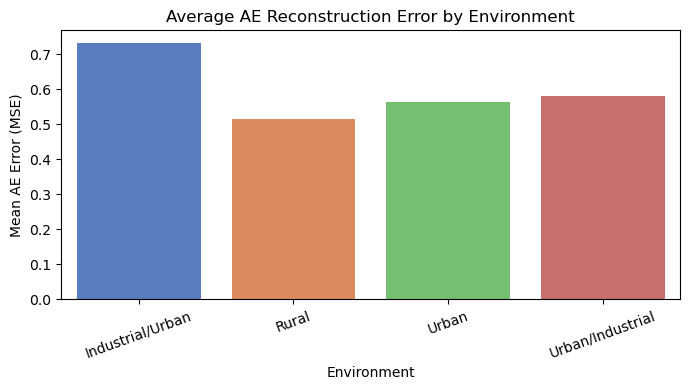

 Saved figure to: figures/ae_error_by_env.png
AE Error by Environment:
              Env     mean      std  count
Industrial/Urban 0.731851 0.062656      4
           Rural 0.515967 0.113735     13
           Urban 0.563425 0.103339     15
Urban/Industrial 0.582095 0.056539      6


In [731]:
"""
Join AE error table with environment/type metadata,
then visualize average AE error by environment and type.
"""

# Merge with metadata
df_full = df_err.merge(df_stations[["Station","Env","Components"]], on="Station", how="left")

# Aggregate & plot AE error by Environment
env_stats = (
    df_full.dropna(subset=["Env"])               # ensure Env is present
           .groupby("Env", as_index=False)["Mean_AE_Error"]
           .agg(mean="mean", std="std", count="count")
)

plt.figure(figsize=(7,4))
# Use hue to assign the palette 
sns.barplot(
    data=env_stats, x="Env", y="mean",
    hue="Env", palette="muted", legend=False,
    errorbar="sd"   # let seaborn draw SD bars (only when count>1)
)
plt.title("Average AE Reconstruction Error by Environment")
plt.ylabel("Mean AE Error (MSE)")
plt.xlabel("Environment")
plt.xticks(rotation=20)
plt.tight_layout()
save_and_show("ae_error_by_env.png")

print("AE Error by Environment:\n", env_stats.to_string(index=False))

##### AE error by Type

In [735]:
# To ensure df_full has a Type column (3D vs 4D)

# Build a station→Type map using stations metadata 
type_map = {}

try:
    df_stn = pd.DataFrame(stations)  # expects columns: Station, Env, Components
    if "Components" in df_stn.columns:
        def comps_to_type(comps):
            if isinstance(comps, (list, tuple)) and any(str(c).startswith("EN") for c in comps):
                return "4D"
            return "3D"
        df_stn["Type"] = df_stn["Components"].apply(comps_to_type)
        type_map.update(dict(zip(df_stn["Station"], df_stn["Type"])))
except Exception as e:
    print("Note: could not read Components from stations metadata:", e)

# Fallback: infer from channels found in df_err (any EN* → 4D)
if not type_map:
    st_has_en = (
        df_err.groupby("Station")["Channel"]
              .apply(lambda ser: any(str(c).startswith("EN") for c in ser.dropna()))
    )
    type_map = {st: ("4D" if has_en else "3D") for st, has_en in st_has_en.items()}

# Attach to df_full
df_full = df_full.copy()
df_full["Type"] = df_full["Station"].map(type_map)
print("Type value counts:\n", df_full["Type"].value_counts(dropna=False))

Type value counts:
 Type
3D    30
4D     8
Name: count, dtype: int64


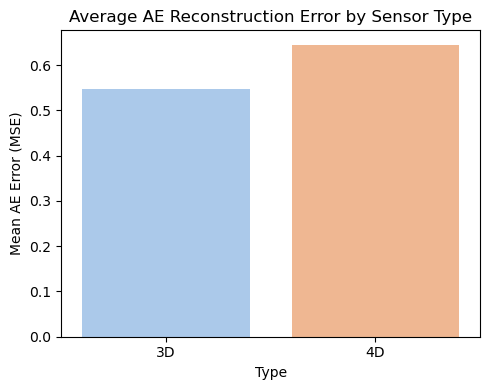

 Saved figure to: figures/ae_error_by_type.png

AE Error by Type:
 Type     mean      std  count
  3D 0.547415 0.106808     30
  4D 0.644557 0.110941      8


In [737]:
# Aggregate & plot AE error by Type
type_stats = (
    df_full.dropna(subset=["Type"])
           .groupby("Type", as_index=False)["Mean_AE_Error"]
           .agg(mean="mean", std="std", count="count")
)

plt.figure(figsize=(5,4))
sns.barplot(
    data=type_stats, x="Type", y="mean",
    hue="Type", legend=False, palette="pastel",
    errorbar="sd"    # seaborn draws SD whiskers if count>1
)
plt.title("Average AE Reconstruction Error by Sensor Type")
plt.ylabel("Mean AE Error (MSE)")
plt.xlabel("Type")
plt.tight_layout()
save_and_show("ae_error_by_type.png")

print("\nAE Error by Type:\n", type_stats.to_string(index=False))

##### Aggregate AE error by channel (simple mean/std/count)

In [761]:
chan_stats = (
    df_full.dropna(subset=["Channel"])
           .groupby("Channel", as_index=False)["Mean_AE_Error"]
           .agg(mean="mean", std="std", count="count")
           .sort_values("mean", ascending=False)
)

print(chan_stats)

  Channel      mean       std  count
4     ENN  0.716222  0.104370      2
3     ENE  0.649246  0.112133      2
5     ENZ  0.648032  0.162681      2
0     EHE  0.565284  0.112588     10
1     EHN  0.542198  0.117235     10
2     EHZ  0.539758  0.096586     12


##### Plot as bar chart with simple ±1 std error bars

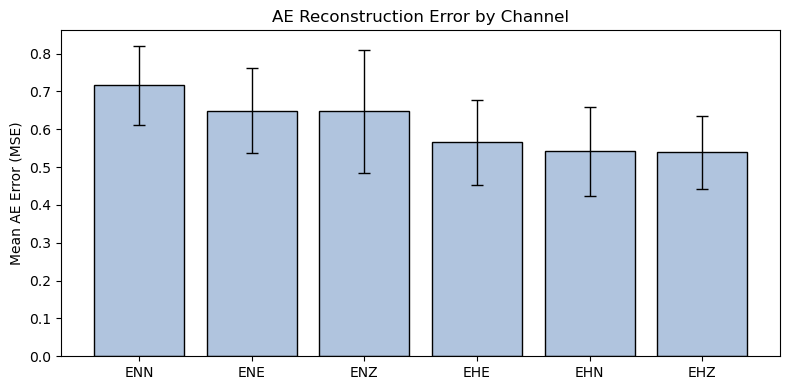

 Saved figure to: figures/ae_error_by_channel.png


In [763]:
x = np.arange(len(chan_stats))
y = chan_stats["mean"].values
yerr = chan_stats["std"].values

plt.figure(figsize=(8,4))
plt.bar(x, y, color="lightsteelblue", edgecolor="k")
plt.errorbar(x, y, yerr=yerr, fmt="none", ecolor="k", elinewidth=1, capsize=4)
plt.xticks(x, chan_stats["Channel"])
plt.ylabel("Mean AE Error (MSE)")
plt.title("AE Reconstruction Error by Channel")
plt.tight_layout()
save_and_show("ae_error_by_channel.png")

#### Bootstrap Confidence Intervals for AE Error

In [753]:
def bootstrap_mean_ci(x, n_boot=5000, ci=95, seed=42):
    """
    Nonparametric bootstrap of the mean.
    Returns (mean, lo, hi) where lo/hi are the central 'ci'% interval.
    """
    x = np.asarray(x, dtype=float)
    rng = np.random.default_rng(seed)
    boots = rng.choice(x, size=(n_boot, x.size), replace=True).mean(axis=1)
    lo, hi = np.percentile(boots, [(100-ci)/2, 100-(100-ci)/2])
    return x.mean(), lo, hi

def group_bootstrap(df, group_col, value_col="Mean_AE_Error", **boot_kw):
    rows = []
    for key, g in df.groupby(group_col):
        m, lo, hi = bootstrap_mean_ci(g[value_col].values, **boot_kw)
        rows.append({group_col: key, "mean": m, "ci_lo": lo, "ci_hi": hi, "count": len(g)})
    out = pd.DataFrame(rows).sort_values("mean").reset_index(drop=True)
    return out

##### AE error by Environment with 95% CIs

,Env,mean,ci_lo,ci_hi,count
0,Rural,0.515967,0.455654,0.574773,13
1,Urban,0.563425,0.515745,0.616249,15
2,Urban/Industrial,0.582095,0.545869,0.627021,6
3,Industrial/Urban,0.731851,0.675101,0.776544,4


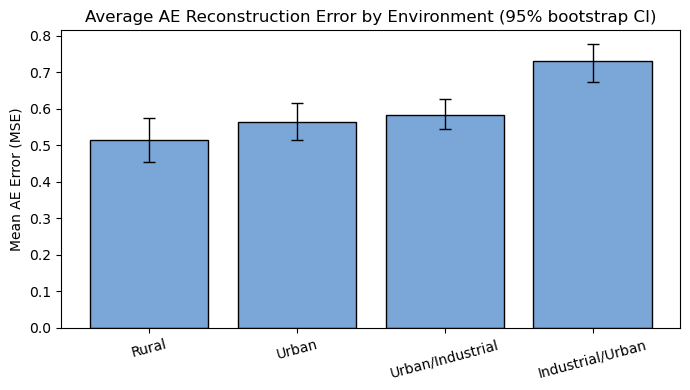

 Saved figure to: figures/ae_error_by_env_bootstrapCI.png


In [756]:
env_ci = group_bootstrap(df_full.dropna(subset=["Env"]), "Env", value_col="Mean_AE_Error", n_boot=5000, ci=95)

display(env_ci) 
env_ci.to_csv("ae_env_bootstrap_ci.csv", index=False)

# bar plot with asymmetric error bars
x = np.arange(len(env_ci))
y = env_ci["mean"].values
yerr = np.vstack([y - env_ci["ci_lo"].values, env_ci["ci_hi"].values - y])

plt.figure(figsize=(7,4))
plt.bar(x, y, color="#7aa6d8", edgecolor="k")
plt.errorbar(x, y, yerr=yerr, fmt="none", ecolor="k", elinewidth=1, capsize=4)
plt.xticks(x, env_ci["Env"], rotation=15)
plt.ylabel("Mean AE Error (MSE)")
plt.title("Average AE Reconstruction Error by Environment (95% bootstrap CI)")
plt.tight_layout()
save_and_show("ae_error_by_env_bootstrapCI.png")

##### AE error by Sensor Type (3D vs 4D) with 95% CIs

,Type,mean,ci_lo,ci_hi,count
0,3D,0.547415,0.509889,0.584920,30
1,4D,0.644557,0.573326,0.715931,8


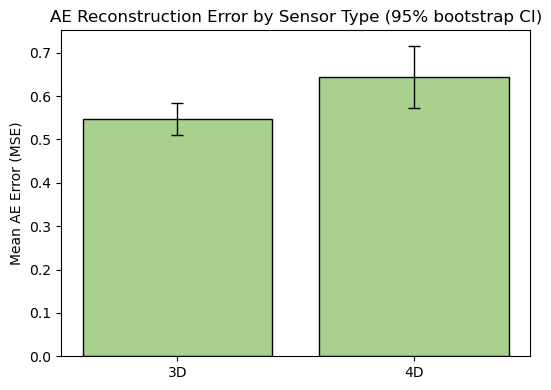

 Saved figure to: figures/ae_error_by_type_bootstrapCI.png


In [758]:
type_ci = group_bootstrap(df_full.dropna(subset=["Type"]), "Type", value_col="Mean_AE_Error", n_boot=5000, ci=95)
display(type_ci)
type_ci.to_csv("ae_type_bootstrap_ci.csv", index=False)

x = np.arange(len(type_ci))
y = type_ci["mean"].values
yerr = np.vstack([y - type_ci["ci_lo"].values, type_ci["ci_hi"].values - y])

plt.figure(figsize=(5.5,4))
plt.bar(x, y, color="#a9d18e", edgecolor="k")
plt.errorbar(x, y, yerr=yerr, fmt="none", ecolor="k", elinewidth=1, capsize=4)
plt.xticks(x, type_ci["Type"])
plt.ylabel("Mean AE Error (MSE)")
plt.title("AE Reconstruction Error by Sensor Type (95% bootstrap CI)")
plt.tight_layout()
save_and_show("ae_error_by_type_bootstrapCI.png")

##### AE error by Channel with 95% CIs

,Channel,mean,ci_lo,ci_hi,count
0,ENN,0.716222,0.642421,0.790022,2
1,ENE,0.649246,0.569956,0.728537,2
2,ENZ,0.648032,0.532999,0.763065,2
3,EHE,0.565284,0.500486,0.631911,10
4,EHN,0.542198,0.473968,0.610853,10
5,EHZ,0.539758,0.486274,0.591671,12


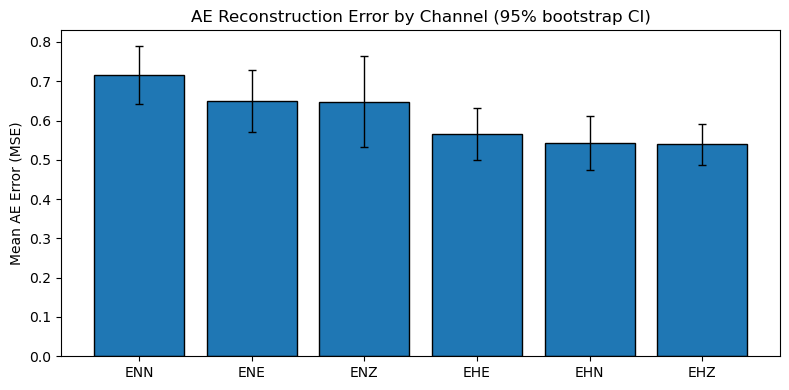

 Saved figure to: figures/ae_error_by_channel_bootstrapCI.png


In [767]:
chan_ci = group_bootstrap(df_full.dropna(subset=["Channel"]), "Channel", value_col="Mean_AE_Error", n_boot=5000, ci=95)
chan_ci = chan_ci.sort_values("mean", ascending=False).reset_index(drop=True)
display(chan_ci)
chan_ci.to_csv("ae_channel_bootstrap_ci.csv", index=False)

x = np.arange(len(chan_ci))
y = chan_ci["mean"].values
yerr = np.vstack([y - chan_ci["ci_lo"].values, chan_ci["ci_hi"].values - y])

plt.figure(figsize=(8,4))
plt.bar(x, y, edgecolor="k")
plt.errorbar(x, y, yerr=yerr, fmt="none", ecolor="k", elinewidth=1, capsize=3)
plt.xticks(x, chan_ci["Channel"])
plt.ylabel("Mean AE Error (MSE)")
plt.title("AE Reconstruction Error by Channel (95% bootstrap CI)")
plt.tight_layout()
save_and_show("ae_error_by_channel_bootstrapCI.png")

#### Aggregation and Uncertainty Analysis

- **Aggregation**: Reconstruction errors were grouped by **channel, environment, and sensor type**, enabling comparison across meaningful categories.  
- **Uncertainty**: 95% **bootstrap confidence intervals** were computed for each group. These intervals quantify the variability of the mean error, providing statistical support beyond raw averages.  
- Together, aggregation + uncertainty analysis demonstrates which groups consistently show higher/lower AE errors, and whether differences are statistically meaningful.

### Note

While the anomaly detection results **(AE reconstruction error distributions, RF classifier probabilities, threshold tuning, ROC/PR performance)** are valid and reliable, analyses involving temporal or environmental trends must be interpreted with caution. Because non-EQ data were sampled at random times rather than through continuous monitoring. Patterns by hour of day, weekday, or environment do not reflect true real-world cycles. These analyses are therefore presented as demonstrations of methodology rather than evidence of anthropogenic or environmental effects.

Future works should include continued long-term non-EQ data collection for each station, which would allow for better study of diurnal/weekly human activity patterns and environmental effects on the seismic background noise and would be a direct means of answering the second research question and making stronger statements regarding anthropogenic trends.

***Clarification: why the 0.10 and 0.20 thresholds in the ECDFs***

The 0.10 and 0.20 thresholds in ECDFs are heuristic markers, not model cutoffs. They summarize how much of each station’s non-EQ distribution lies in the confidently “non-EQ” range. Higher fractions mean cleaner non-EQ background. Medians and fractions enable station comparison, aiding interpretation without imposing rigid decision boundaries.

## Plot Raspberry Shake station Locations on a Map

#### Create Pandas DataFrame with Station List to Prepare for Mapping

In [829]:

# My station data
_stations = [
    {"Station": "RCC8D", "Lat": 49.87387, "Lon": 4.73945, "Env": "Rural"},
    {"Station": "RD9D6", "Lat": 53.26126, "Lon": -2.15416, "Env": "Urban"},
    {"Station": "R5C62", "Lat": -6.30631, "Lon": 106.67406, "Env": "Urban", "EQ": True},
    {"Station": "R76F0", "Lat": 53.80180, "Lon": -1.54084, "Env": "Urban"},
    {"Station": "R0CEC", "Lat": 53.63964, "Lon": -2.49214, "Env": "Rural"},
    {"Station": "R5B93", "Lat": 40.69369, "Lon": -75.20585, "Env": "Urban"},
    {"Station": "R77F9", "Lat": 43.54955, "Lon": -76.11243, "Env": "Rural/Industrial", "EQ": True},
    {"Station": "RE992", "Lat": 41.56757, "Lon": -81.49729, "Env": "Industrial", "EQ": True},
    {"Station": "R853C", "Lat": -32.89189, "Lon": -68.87089, "Env": "Rural", "EQ": True},
    {"Station": "R119F", "Lat": 49.01802, "Lon": 8.42088, "Env": "Urban"},
    {"Station": "R1906", "Lat": 52.43243, "Lon": 9.84227, "Env": "Urban/Industrial"},
    {"Station": "R74A7", "Lat": 34.90991, "Lon": 135.79704, "Env": "Urban", "EQ": True},
    {"Station": "R3949", "Lat": 19.51351, "Lon": -102.41833, "Env": "Rural"},
    {"Station": "R30A2", "Lat": 32.02703, "Lon": -102.10107, "Env": "Urban/Industrial", "EQ": True},
    {"Station": "R9F13", "Lat": 52.21622, "Lon": 21.13200, "Env": "Urban/Industrial"},
    {"Station": "R5156", "Lat": 33.86486, "Lon": 35.49175, "Env": "Urban", "EQ": True},
    {"Station": "R7000", "Lat": 26.70270, "Lon": 27.22909, "Env": "Rural"},
    {"Station": "R47BB", "Lat": -25.65766, "Lon": 27.24548, "Env": "Industrial/Urban", "EQ": True},
    {"Station": "R57CE", "Lat": 6.79279, "Lon": 79.89492, "Env": "Industrial/Urban"},
    {"Station": "R5E3B", "Lat": 40.22523, "Lon": 44.57093, "Env": "Urban", "EQ": True},
]

df_stations_ = pd.DataFrame(_stations)

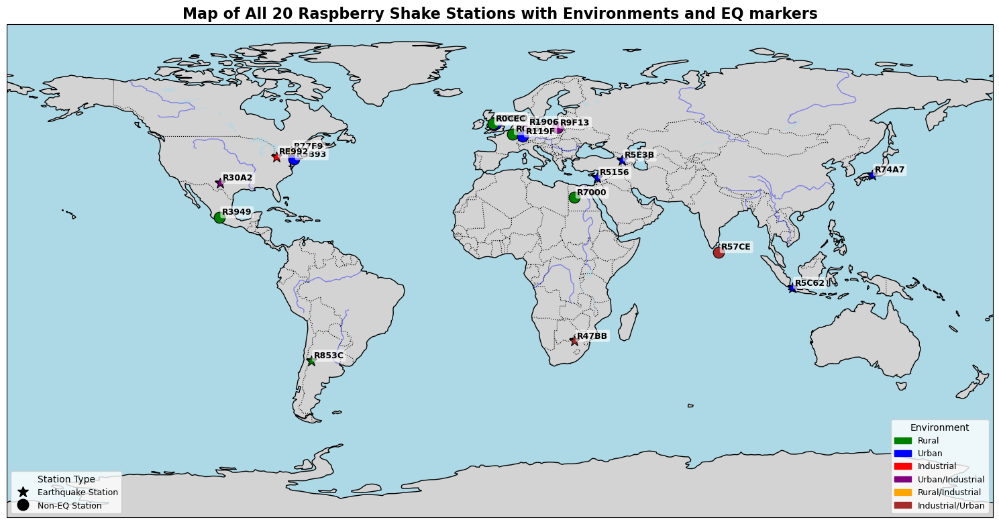

 Saved figure to: figures/station_map_withbasemap_.png


In [857]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import matplotlib.pyplot as plt

# Set EQ flag to False
df_stations_["EQ"] = df_stations_["EQ"].fillna(False)

# Custom colors per environment
env_colors = {
    "Rural": "green",
    "Urban": "blue",
    "Industrial": "red",
    "Urban/Industrial": "purple",
    "Rural/Industrial": "orange",
    "Industrial/Urban": "brown"
}

# Create figure
plt.figure(figsize=(15, 8))  
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()

# Add base map layers
ax.add_feature(cfeature.COASTLINE, linewidth=1.0)
ax.add_feature(cfeature.BORDERS, linestyle=":", linewidth=0.8)
ax.add_feature(cfeature.LAND, facecolor="lightgray")
ax.add_feature(cfeature.OCEAN, facecolor="lightblue")
ax.add_feature(cfeature.LAKES, facecolor="lightblue", alpha=0.5)
ax.add_feature(cfeature.RIVERS, edgecolor="blue", alpha=0.4)

# Plot each station 
for _, row in df_stations_.iterrows():
    color = env_colors.get(row["Env"], "black")
    marker = "*" if row["EQ"] else "o"
    ax.plot(row["Lon"], row["Lat"], marker=marker, color=color,
            markersize=12, transform=ccrs.PlateCarree(), markeredgecolor="black", markeredgewidth=0.8)
    ax.text(row["Lon"] + 1, row["Lat"] + 1, row["Station"],
            fontsize=9, weight="bold", transform=ccrs.PlateCarree(),
            bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="none", alpha=0.6))

# Legends
eq_marker = mlines.Line2D([], [], color='black', marker='*', linestyle='None',
                          markersize=12, label='Earthquake Station')
non_eq_marker = mlines.Line2D([], [], color='black', marker='o', linestyle='None',
                              markersize=12, label='Non-EQ Station')

env_patches = [mpatches.Patch(color=clr, label=env) for env, clr in env_colors.items()]

legend1 = ax.legend(handles=[eq_marker, non_eq_marker], title="Station Type",
                    loc="lower left", fontsize=9, title_fontsize=10)
legend2 = ax.legend(handles=env_patches, title="Environment",
                    loc="lower right", fontsize=9, title_fontsize=10)
ax.add_artist(legend1)

# Title
plt.title("Map of All 20 Raspberry Shake Stations with Environments and EQ markers", fontsize=16, weight="bold")
plt.tight_layout()
save_and_show("station_map_withbasemap_.png")

The figure above displays the geographic distribution of all 20 Raspberry Shake stations used in this study, categorized by environment and earthquake association. The star markers indicate stations where earthquake-triggered data were present, while circle markers represent non-earthquake data segments.

In [859]:
# Display station table with EQ flags
df_stations_[["Station", "Env", "Lat", "Lon", "EQ"]]

,Station,Env,Lat,Lon,EQ
0,RCC8D,Rural,49.87387,4.73945,False
1,RD9D6,Urban,53.26126,-2.15416,False
2,R5C62,Urban,-6.30631,106.67406,True
3,R76F0,Urban,53.80180,-1.54084,False
4,R0CEC,Rural,53.63964,-2.49214,False
5,R5B93,Urban,40.69369,-75.20585,False
6,R77F9,Rural/Industrial,43.54955,-76.11243,True
7,RE992,Industrial,41.56757,-81.49729,True
8,R853C,Rural,-32.89189,-68.87089,True
9,R119F,Urban,49.01802,8.42088,False
